## Assignment 3: Generative Model

# Part I - Generative Adversarial Networks (GANs)
So far in DS6050, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__.
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661).

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [2]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy.


**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1].

In [4]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data

        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B))

11490434/11490434 [==============================] - 0s 0us/step


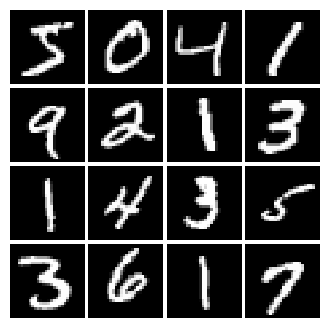

In [5]:
# show a batch
mnist = MNIST(batch_size=16)
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [6]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.

    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU

    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    lr = tf.maximum(alpha * x, x)
    return lr

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [7]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [8]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.

    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate

    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    sn = tf.random.uniform(shape=[batch_size, dim], minval=-1, maxval=1)
    return sn

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [9]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")

test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1

The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [10]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    tf.keras.layers.Dense(256, input_shape=(784,)),
    tf.keras.layers.LeakyReLU(alpha=0.01),
    tf.keras.layers.Dense(256),
    tf.keras.layers.LeakyReLU(alpha=0.01),
    tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [11]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')

test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [12]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, input_shape=(noise_dim,)),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784),
        tf.keras.layers.Activation('tanh')

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [13]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')

test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [14]:
loss_bc = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.

    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = loss_bc(tf.ones(logits_real.shape), logits_real) + loss_bc(tf.zeros(logits_fake.shape), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.

    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = loss_bc(tf.ones(logits_fake.shape), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [15]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 6.02597e-17


In [16]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z).

In [17]:
# TODO: create an AdamOptimizer for D_optimizer and G_optimizer
def get_optimizers(learning_rate=1e-3, beta1=0.5):
    """Create optimizer for GAN training.

    Inputs:
    - learning_rate: learning rate to use for both optimizer
    - beta1: beta1 parameter for both optimizer (first moment decay)

    Returns:
    - D_optimizer: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_optimizer: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_optimizer = None
    G_optimizer = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate,beta_1=beta1)
    G_optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate,beta_1= beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_optimizer, G_optimizer

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other.

In [18]:
# a giant helper function
def run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.

    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_optimizer: an Optimizer for Discriminator
    - G_optimizer: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)

    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)
                D_optimizer.apply_gradients(zip(d_gradients, D.trainable_variables))

            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)
                G_optimizer.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1

    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Instructions for updating:
Use tf.identity with explicit device placement instead.


Epoch: 0, Iter: 0, D: 1.749, G:0.7381


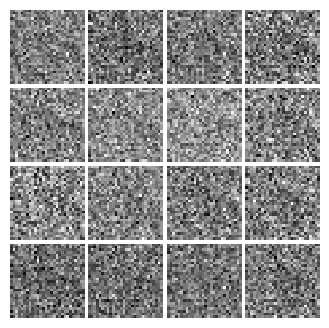

Epoch: 0, Iter: 20, D: 0.6048, G:0.8984


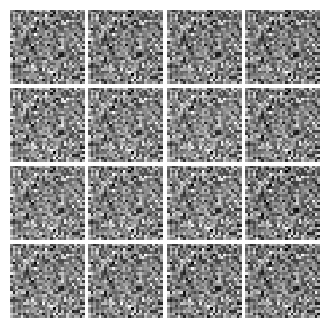

Epoch: 0, Iter: 40, D: 0.4528, G:1.138


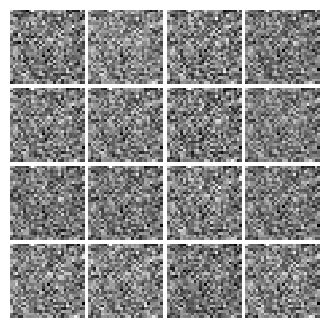

Epoch: 0, Iter: 60, D: 1.515, G:3.478


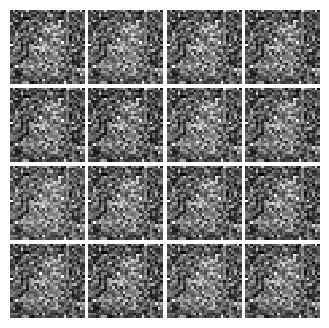

Epoch: 0, Iter: 80, D: 1.301, G:0.9571


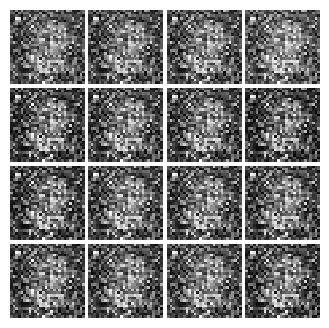

Epoch: 0, Iter: 100, D: 1.179, G:1.225


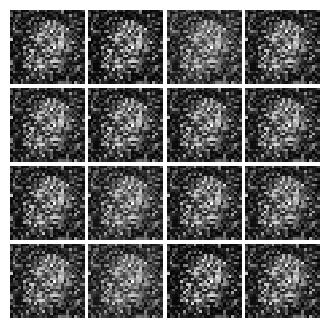

Epoch: 0, Iter: 120, D: 0.8153, G:1.833


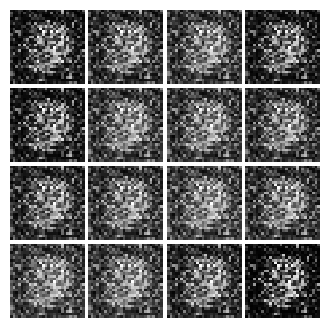

Epoch: 0, Iter: 140, D: 1.624, G:0.9091


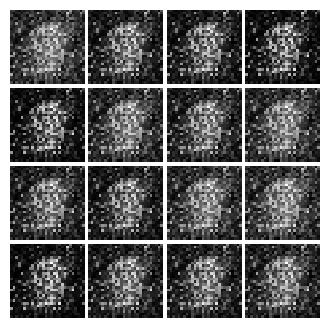

Epoch: 0, Iter: 160, D: 1.024, G:1.242


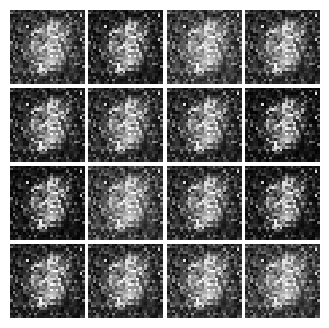

Epoch: 0, Iter: 180, D: 1.039, G:1.73


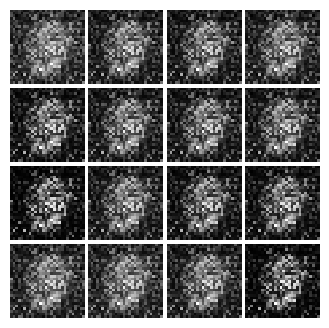

Epoch: 0, Iter: 200, D: 1.299, G:1.505


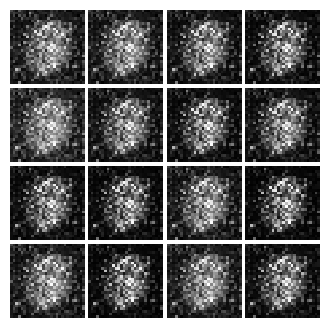

Epoch: 0, Iter: 220, D: 0.8631, G:1.871


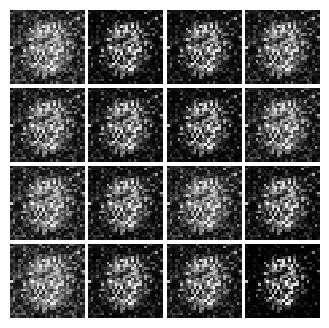

Epoch: 0, Iter: 240, D: 2.334, G:1.598


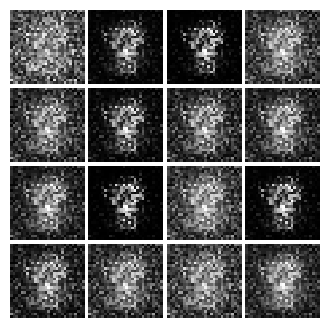

Epoch: 0, Iter: 260, D: 1.099, G:1.18


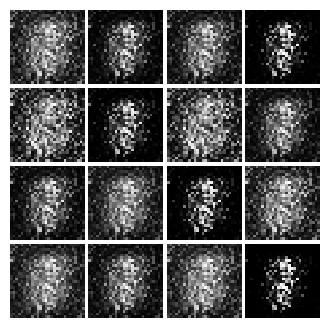

Epoch: 0, Iter: 280, D: 1.385, G:1.107


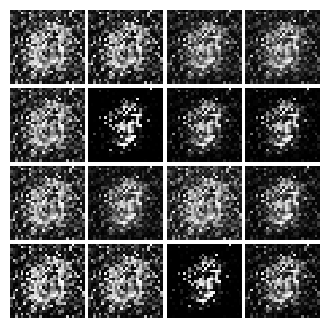

Epoch: 0, Iter: 300, D: 1.25, G:3.72


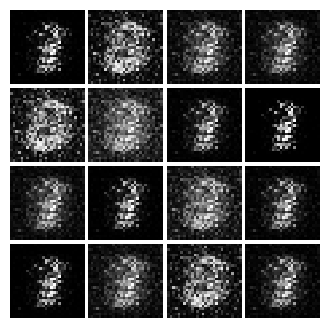

Epoch: 0, Iter: 320, D: 1.191, G:1.755


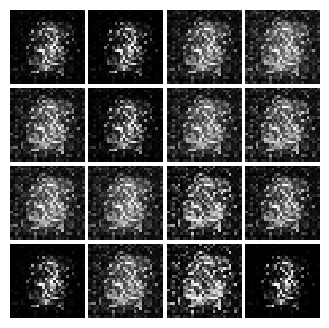

Epoch: 0, Iter: 340, D: 0.9542, G:1.384


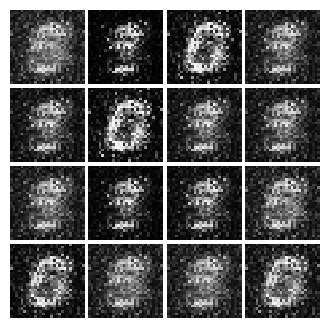

Epoch: 0, Iter: 360, D: 1.505, G:0.5661


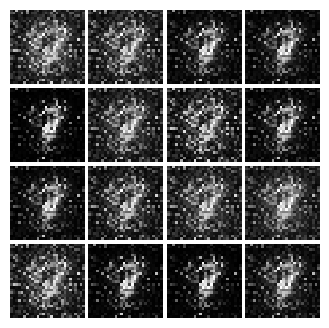

Epoch: 0, Iter: 380, D: 0.7901, G:2.04


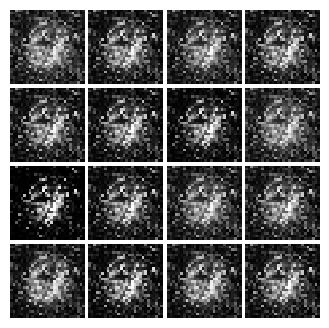

Epoch: 0, Iter: 400, D: 1.198, G:1.355


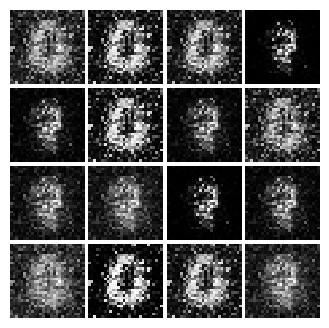

Epoch: 0, Iter: 420, D: 1.025, G:1.165


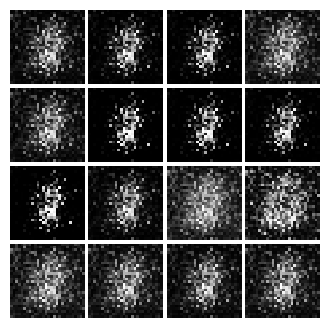

Epoch: 0, Iter: 440, D: 1.333, G:1.266


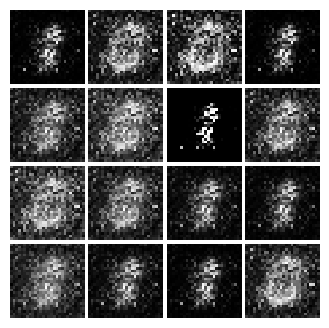

Epoch: 0, Iter: 460, D: 0.9953, G:1.213


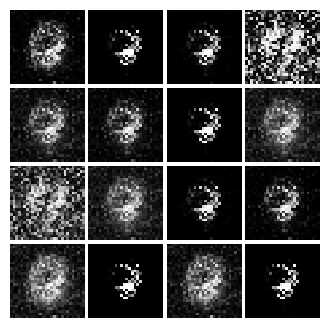

Epoch: 1, Iter: 480, D: 1.017, G:1.34


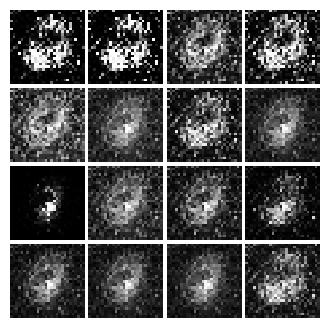

Epoch: 1, Iter: 500, D: 1.071, G:1.281


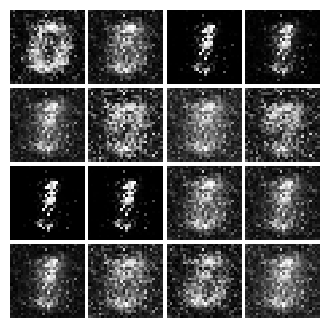

Epoch: 1, Iter: 520, D: 1.015, G:1.853


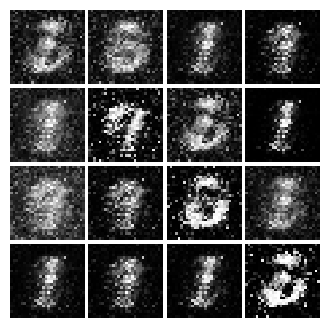

Epoch: 1, Iter: 540, D: 1.135, G:1.265


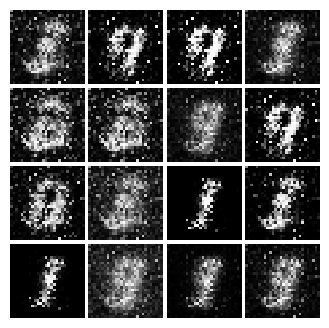

Epoch: 1, Iter: 560, D: 2.022, G:2.189


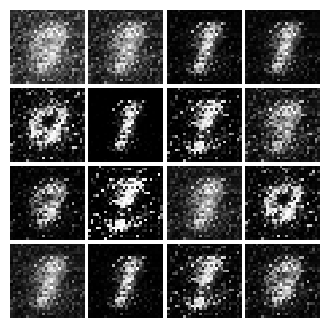

Epoch: 1, Iter: 580, D: 0.9401, G:2.024


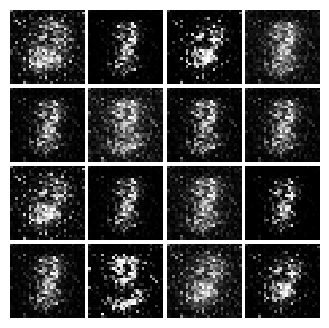

Epoch: 1, Iter: 600, D: 1.403, G:0.9959


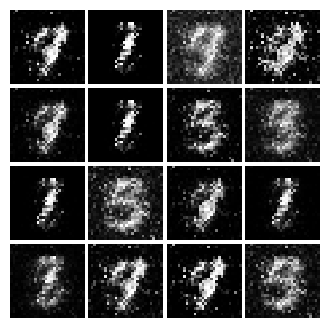

Epoch: 1, Iter: 620, D: 2.367, G:1.283


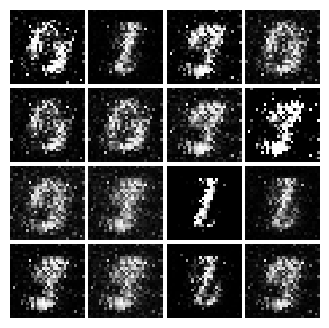

Epoch: 1, Iter: 640, D: 1.085, G:1.086


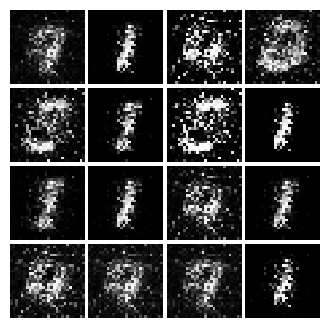

Epoch: 1, Iter: 660, D: 1.177, G:1.559


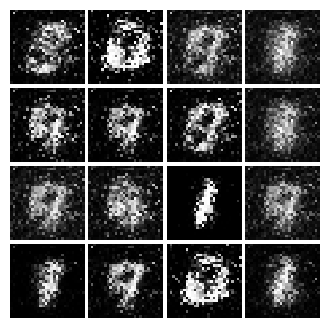

Epoch: 1, Iter: 680, D: 1.209, G:1.149


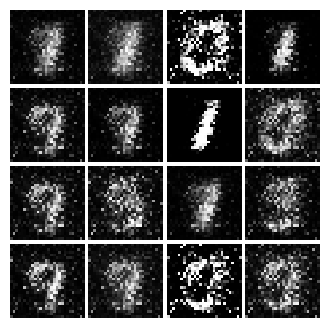

Epoch: 1, Iter: 700, D: 1.042, G:1.596


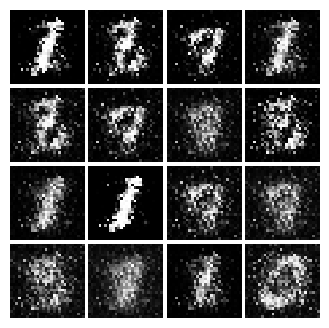

Epoch: 1, Iter: 720, D: 1.055, G:1.052


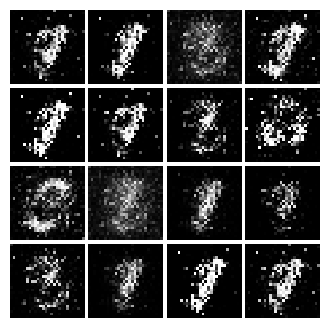

Epoch: 1, Iter: 740, D: 1.274, G:0.9175


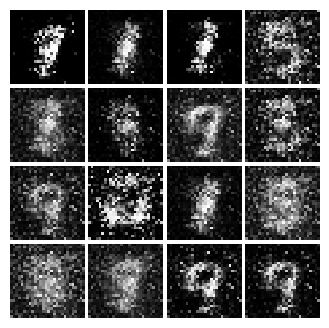

Epoch: 1, Iter: 760, D: 1.129, G:1.211


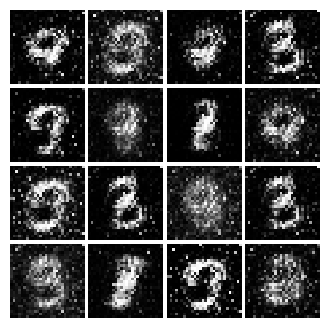

Epoch: 1, Iter: 780, D: 1.022, G:1.105


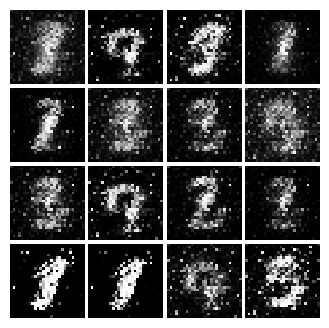

Epoch: 1, Iter: 800, D: 1.105, G:1.53


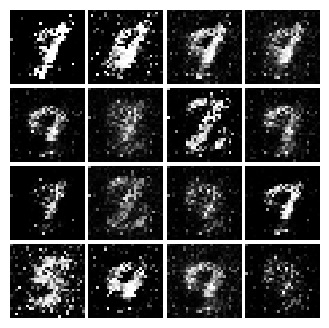

Epoch: 1, Iter: 820, D: 1.142, G:0.5484


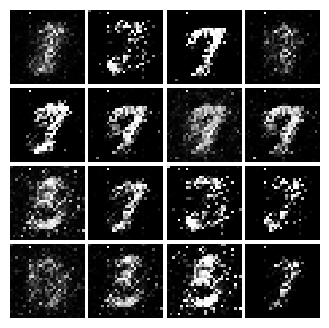

Epoch: 1, Iter: 840, D: 1.836, G:0.6942


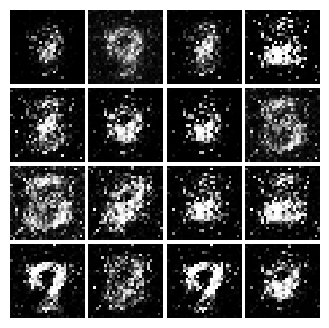

Epoch: 1, Iter: 860, D: 1.04, G:0.5736


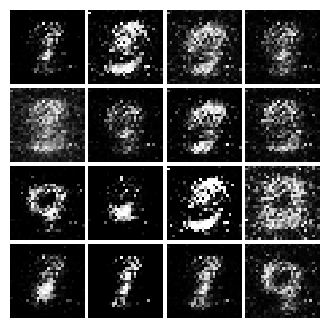

Epoch: 1, Iter: 880, D: 1.079, G:1.362


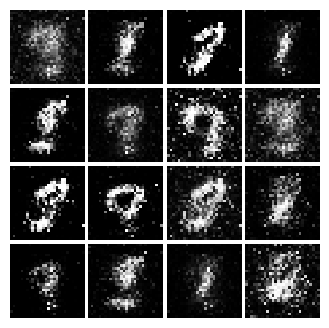

Epoch: 1, Iter: 900, D: 1.059, G:1.884


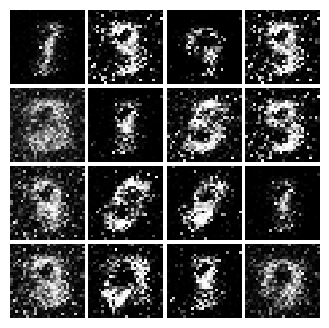

Epoch: 1, Iter: 920, D: 1.257, G:1.013


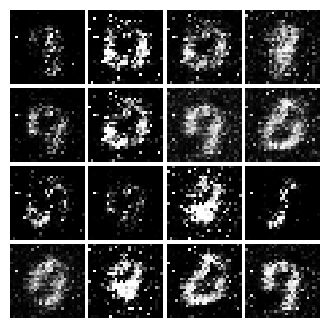

Epoch: 2, Iter: 940, D: 1.175, G:1.412


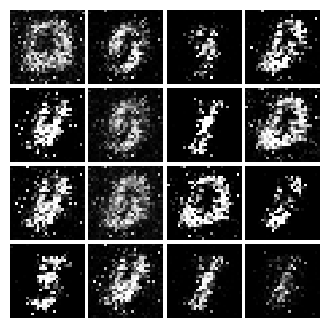

Epoch: 2, Iter: 960, D: 1.08, G:1.26


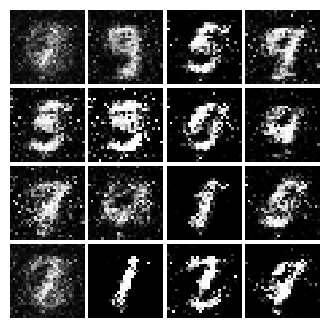

Epoch: 2, Iter: 980, D: 1.009, G:1.155


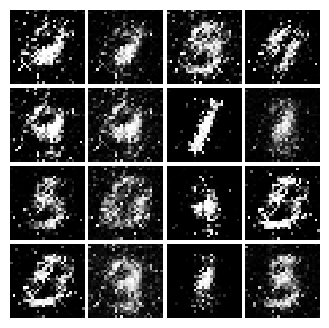

Epoch: 2, Iter: 1000, D: 1.052, G:1.091


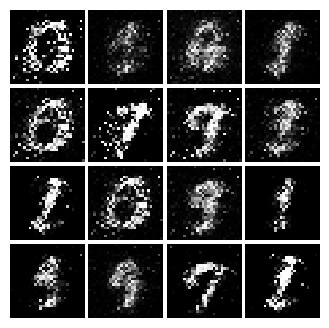

Epoch: 2, Iter: 1020, D: 1.16, G:1.22


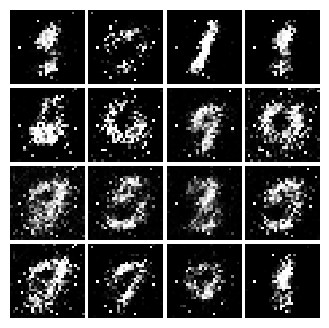

Epoch: 2, Iter: 1040, D: 1.1, G:1.269


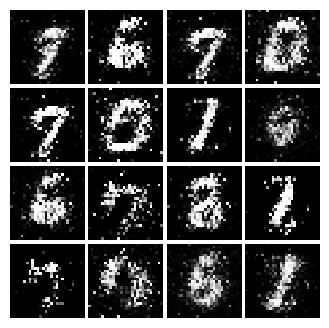

Epoch: 2, Iter: 1060, D: 1.098, G:1.551


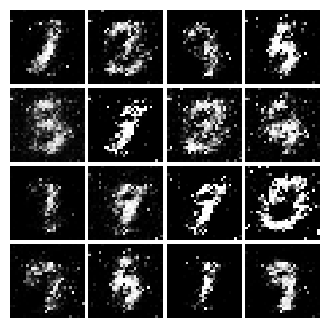

Epoch: 2, Iter: 1080, D: 1.187, G:1.183


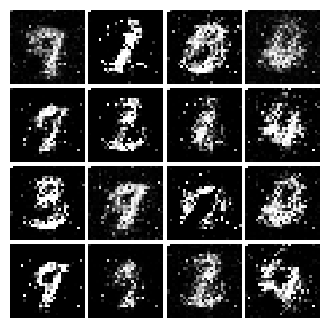

Epoch: 2, Iter: 1100, D: 1.269, G:1.543


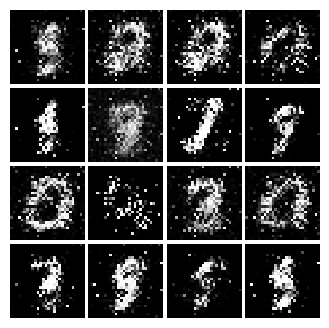

Epoch: 2, Iter: 1120, D: 1.16, G:1.349


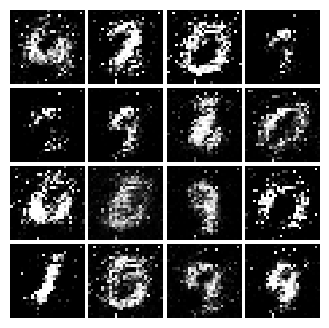

Epoch: 2, Iter: 1140, D: 1.37, G:0.9801


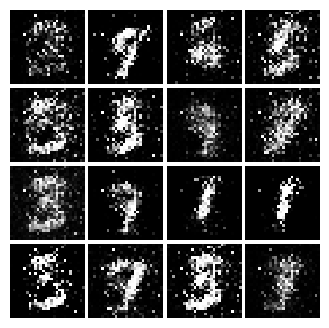

Epoch: 2, Iter: 1160, D: 1.12, G:1.376


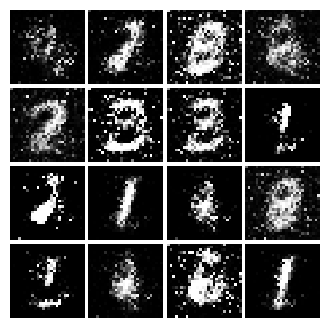

Epoch: 2, Iter: 1180, D: 1.032, G:1.321


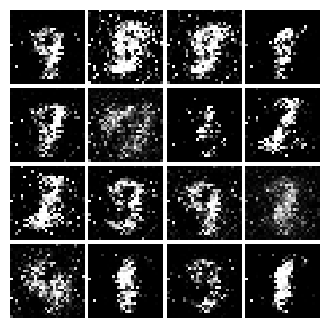

Epoch: 2, Iter: 1200, D: 1.169, G:1.105


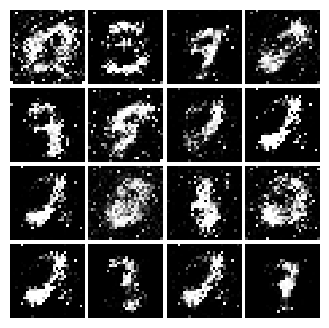

Epoch: 2, Iter: 1220, D: 1.074, G:1.543


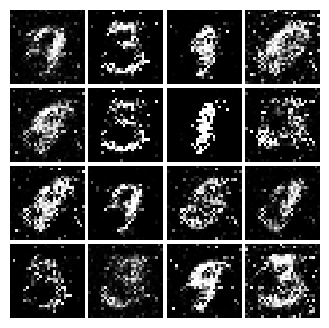

Epoch: 2, Iter: 1240, D: 2.391, G:0.4419


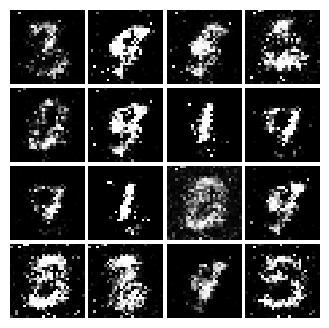

Epoch: 2, Iter: 1260, D: 1.128, G:1.329


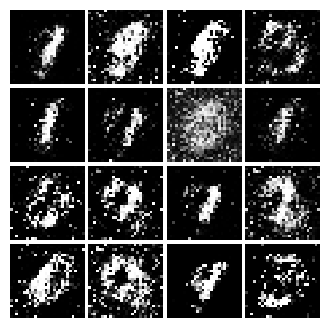

Epoch: 2, Iter: 1280, D: 1.362, G:0.9988


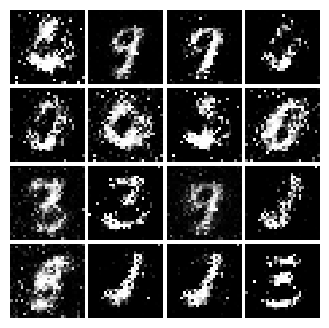

Epoch: 2, Iter: 1300, D: 1.017, G:1.754


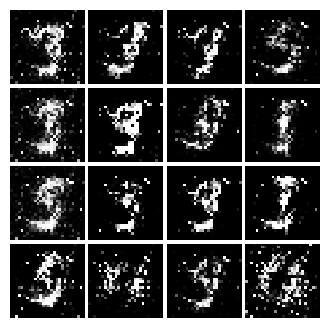

Epoch: 2, Iter: 1320, D: 1.387, G:1.406


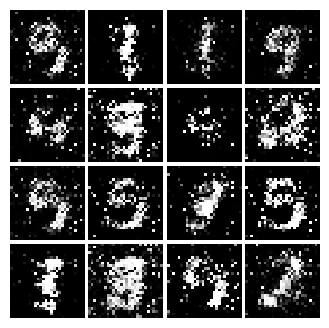

Epoch: 2, Iter: 1340, D: 1.251, G:1.11


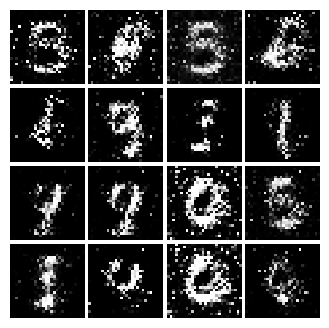

Epoch: 2, Iter: 1360, D: 1.235, G:1.057


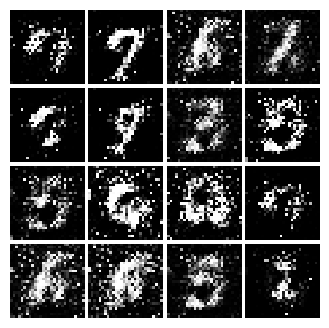

Epoch: 2, Iter: 1380, D: 1.094, G:1.319


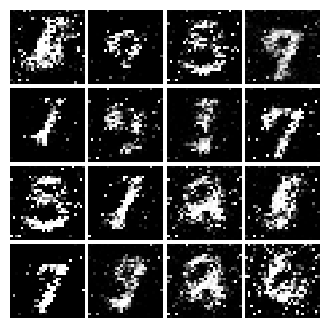

Epoch: 2, Iter: 1400, D: 1.551, G:0.2408


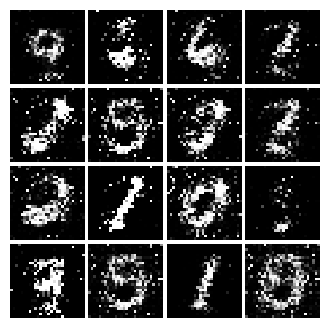

Epoch: 3, Iter: 1420, D: 1.204, G:0.9382


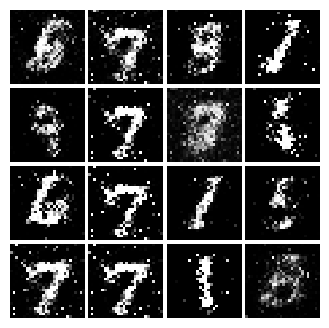

Epoch: 3, Iter: 1440, D: 1.099, G:1.02


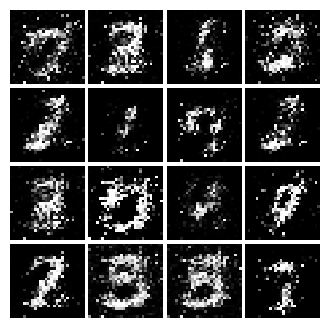

Epoch: 3, Iter: 1460, D: 1.19, G:1.123


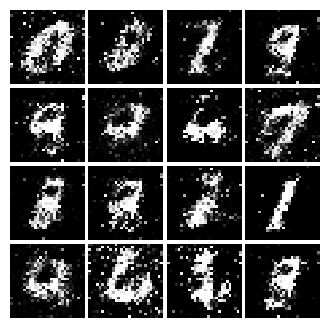

Epoch: 3, Iter: 1480, D: 1.213, G:0.9709


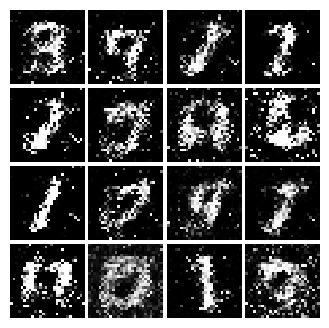

Epoch: 3, Iter: 1500, D: 1.41, G:1.177


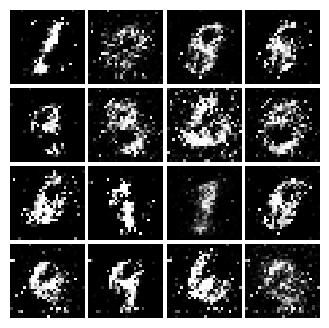

Epoch: 3, Iter: 1520, D: 1.238, G:1.044


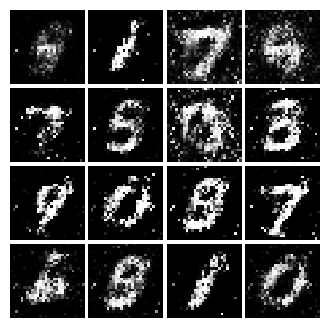

Epoch: 3, Iter: 1540, D: 1.36, G:0.8778


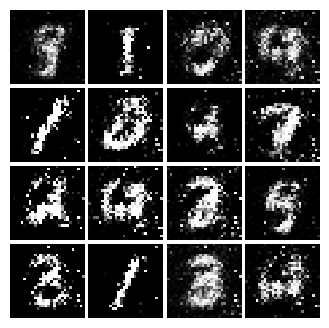

Epoch: 3, Iter: 1560, D: 1.224, G:1.064


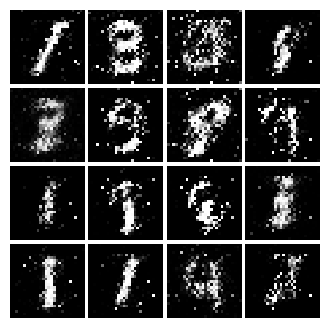

Epoch: 3, Iter: 1580, D: 1.771, G:0.2817


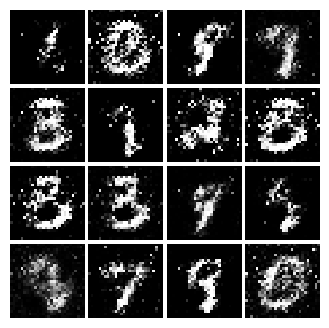

Epoch: 3, Iter: 1600, D: 1.117, G:1.109


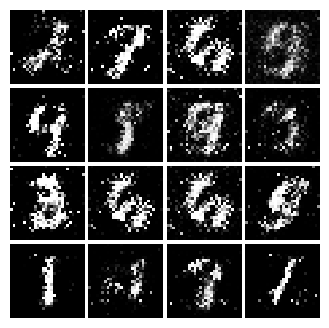

Epoch: 3, Iter: 1620, D: 1.235, G:1.216


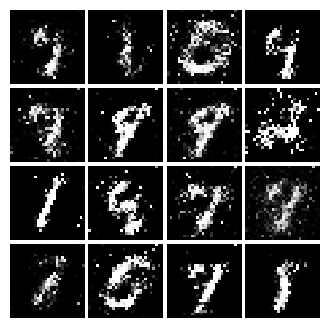

Epoch: 3, Iter: 1640, D: 1.267, G:0.9523


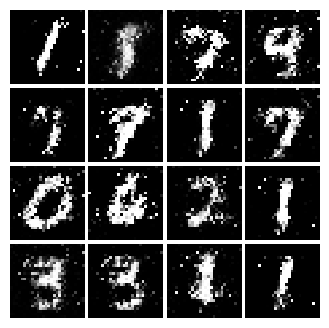

Epoch: 3, Iter: 1660, D: 1.247, G:0.9265


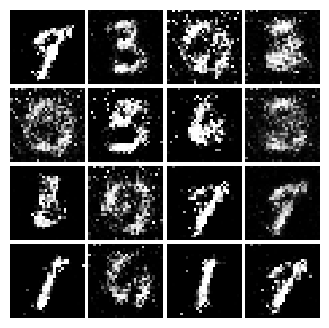

Epoch: 3, Iter: 1680, D: 1.281, G:0.7942


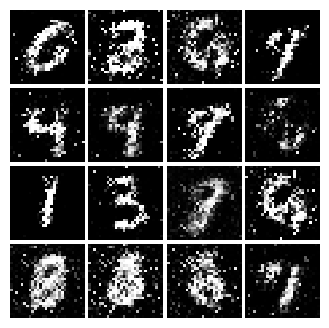

Epoch: 3, Iter: 1700, D: 1.514, G:0.974


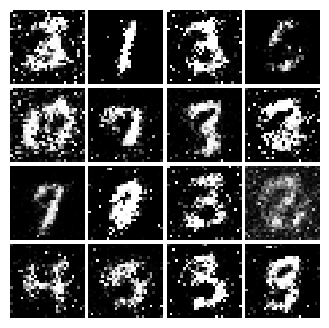

Epoch: 3, Iter: 1720, D: 1.239, G:0.9001


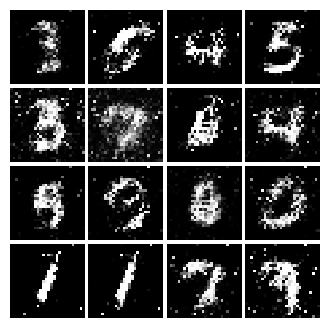

Epoch: 3, Iter: 1740, D: 1.26, G:1.025


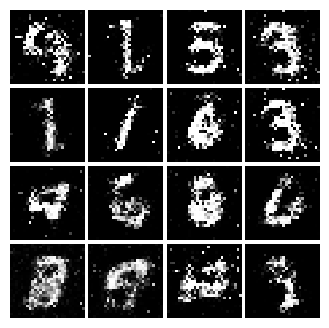

Epoch: 3, Iter: 1760, D: 1.189, G:0.9851


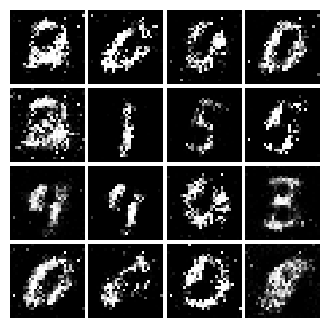

Epoch: 3, Iter: 1780, D: 1.212, G:0.9495


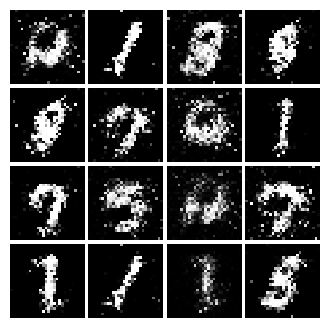

Epoch: 3, Iter: 1800, D: 1.363, G:0.9568


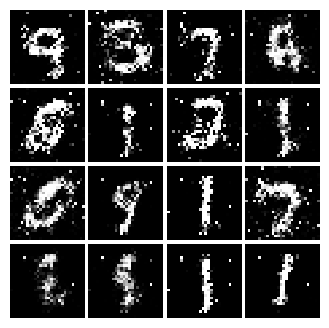

Epoch: 3, Iter: 1820, D: 1.151, G:1.181


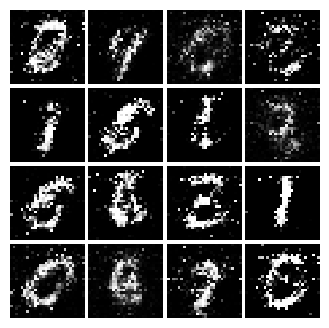

Epoch: 3, Iter: 1840, D: 1.262, G:0.9242


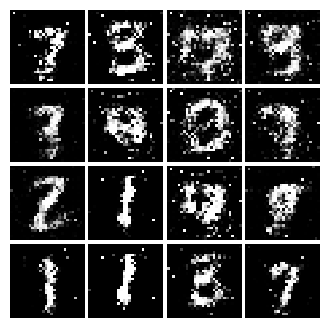

Epoch: 3, Iter: 1860, D: 1.237, G:0.8947


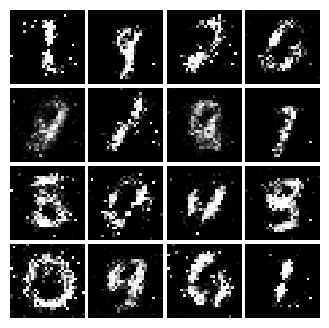

Epoch: 4, Iter: 1880, D: 1.236, G:1.017


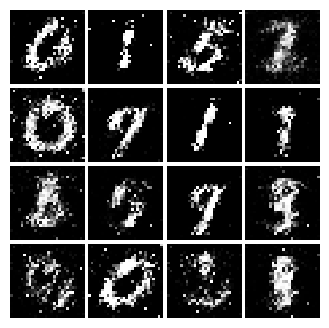

Epoch: 4, Iter: 1900, D: 1.215, G:0.8832


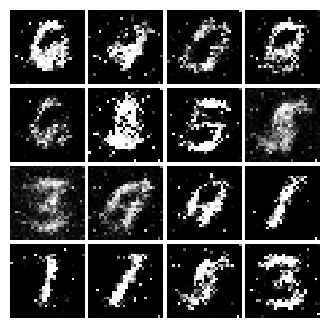

Epoch: 4, Iter: 1920, D: 1.222, G:1.054


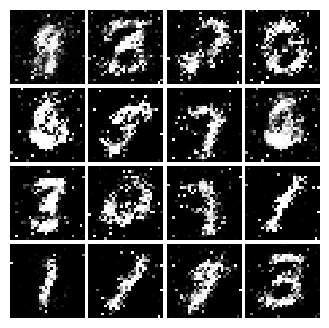

Epoch: 4, Iter: 1940, D: 1.172, G:1.678


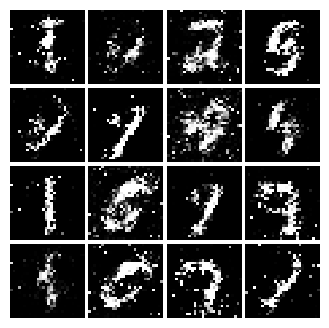

Epoch: 4, Iter: 1960, D: 1.253, G:1.123


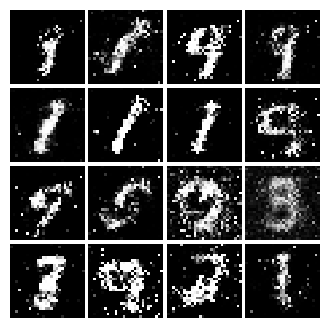

Epoch: 4, Iter: 1980, D: 1.235, G:0.9462


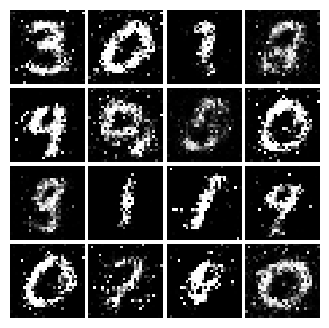

Epoch: 4, Iter: 2000, D: 1.436, G:0.8303


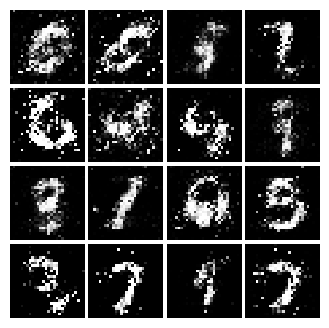

Epoch: 4, Iter: 2020, D: 1.291, G:0.919


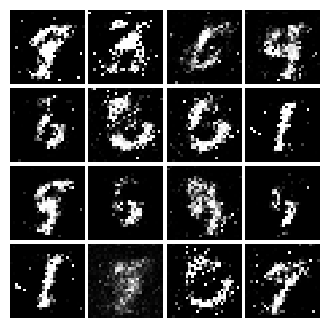

Epoch: 4, Iter: 2040, D: 1.372, G:0.9341


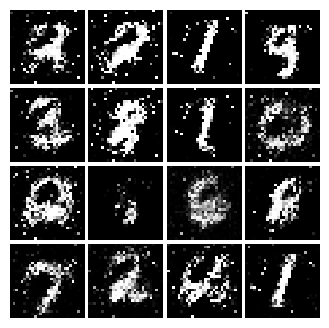

Epoch: 4, Iter: 2060, D: 1.341, G:0.9071


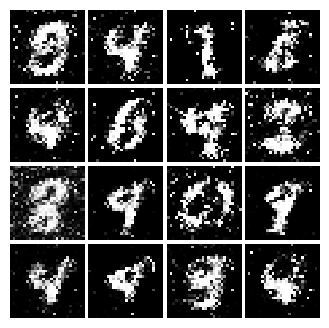

Epoch: 4, Iter: 2080, D: 1.244, G:0.9799


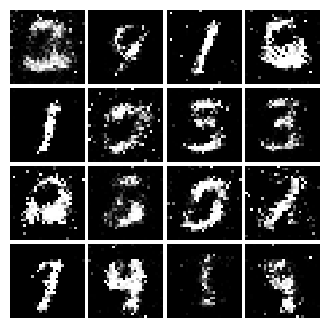

Epoch: 4, Iter: 2100, D: 1.291, G:0.9684


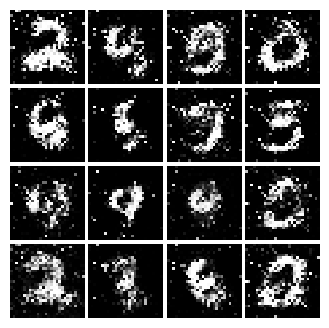

Epoch: 4, Iter: 2120, D: 1.349, G:0.8899


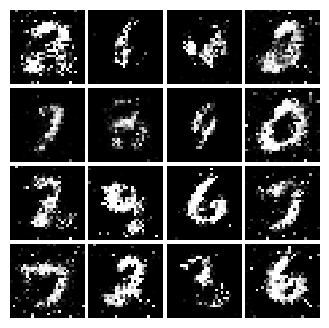

Epoch: 4, Iter: 2140, D: 1.333, G:0.8066


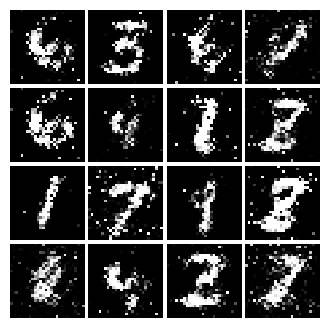

Epoch: 4, Iter: 2160, D: 1.263, G:0.8701


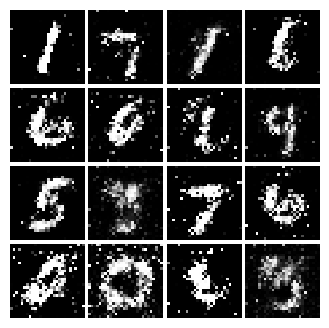

Epoch: 4, Iter: 2180, D: 1.318, G:0.8896


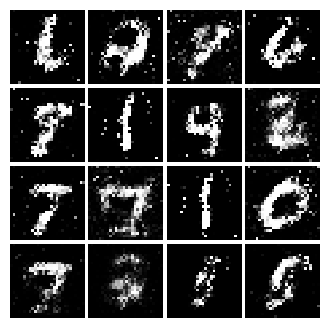

Epoch: 4, Iter: 2200, D: 1.242, G:0.9199


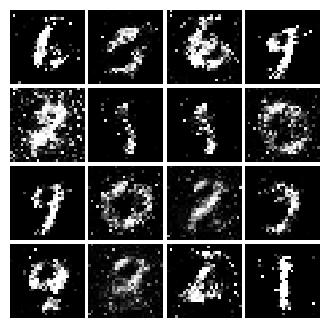

Epoch: 4, Iter: 2220, D: 1.374, G:0.8297


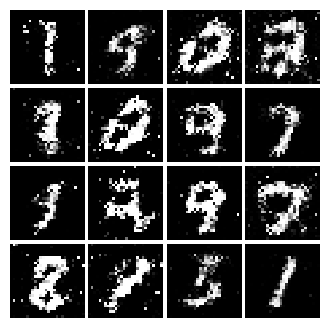

Epoch: 4, Iter: 2240, D: 1.139, G:0.8145


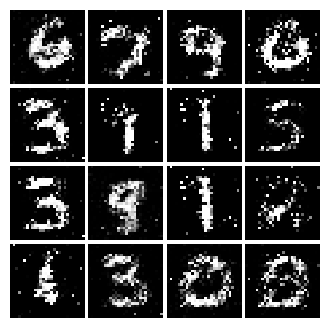

Epoch: 4, Iter: 2260, D: 1.188, G:1.191


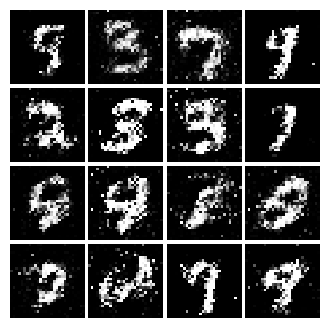

Epoch: 4, Iter: 2280, D: 1.334, G:1.077


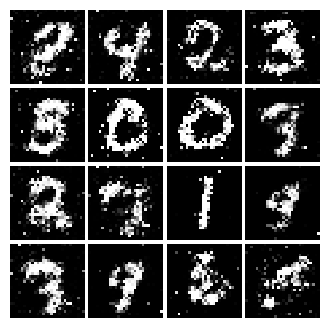

Epoch: 4, Iter: 2300, D: 1.276, G:0.86


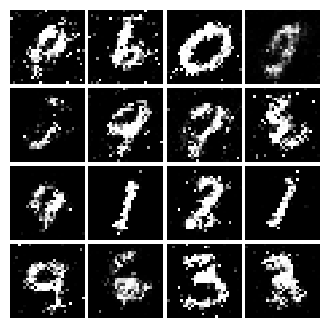

Epoch: 4, Iter: 2320, D: 1.261, G:1.052


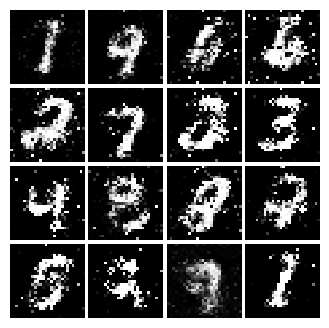

Epoch: 4, Iter: 2340, D: 1.256, G:0.8971


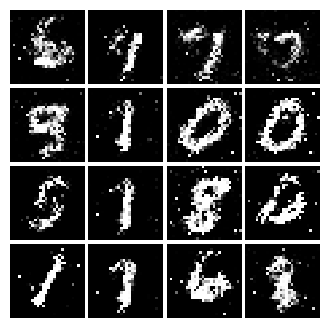

Epoch: 5, Iter: 2360, D: 1.265, G:0.8181


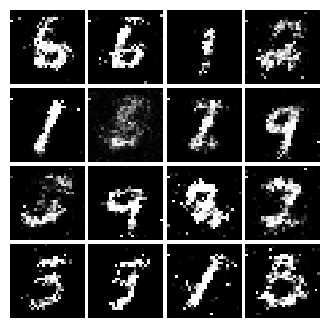

Epoch: 5, Iter: 2380, D: 1.237, G:0.869


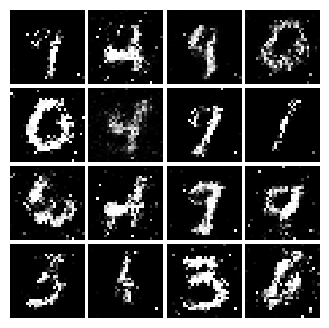

Epoch: 5, Iter: 2400, D: 1.291, G:1.052


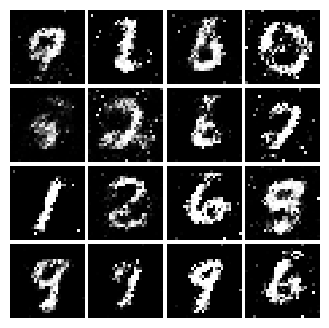

Epoch: 5, Iter: 2420, D: 1.218, G:0.8598


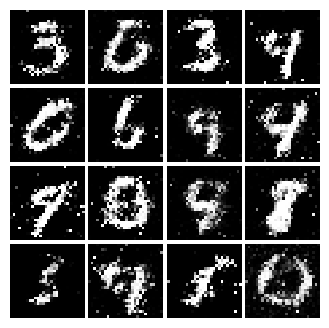

Epoch: 5, Iter: 2440, D: 1.259, G:0.8012


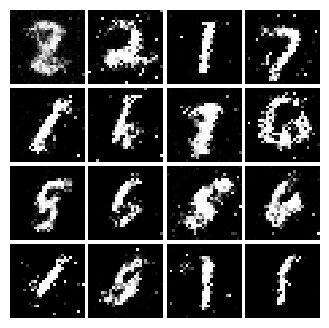

Epoch: 5, Iter: 2460, D: 1.18, G:0.932


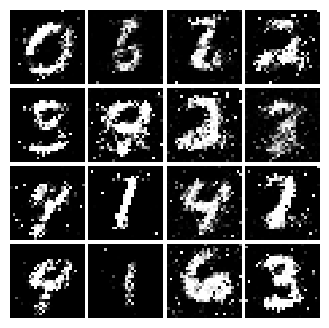

Epoch: 5, Iter: 2480, D: 1.281, G:0.912


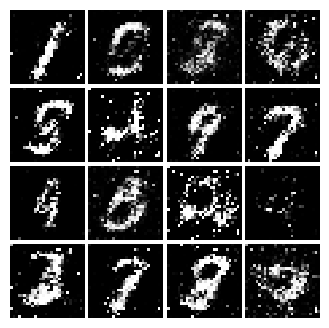

Epoch: 5, Iter: 2500, D: 1.223, G:0.8349


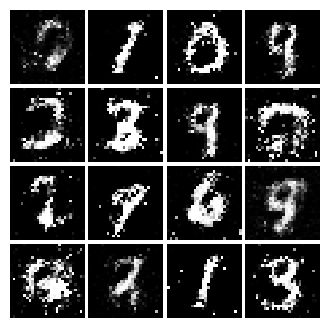

Epoch: 5, Iter: 2520, D: 1.403, G:0.9057


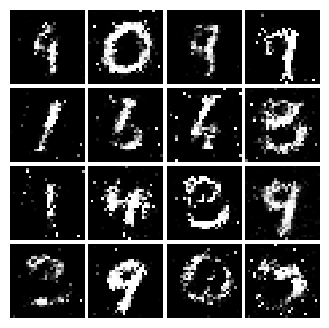

Epoch: 5, Iter: 2540, D: 1.305, G:0.8019


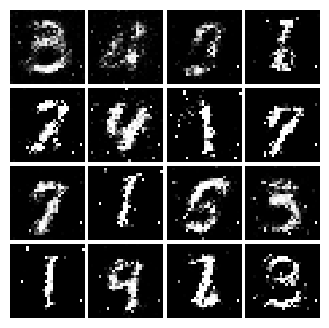

Epoch: 5, Iter: 2560, D: 1.332, G:0.9103


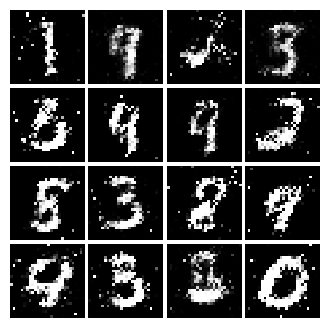

Epoch: 5, Iter: 2580, D: 1.342, G:0.9688


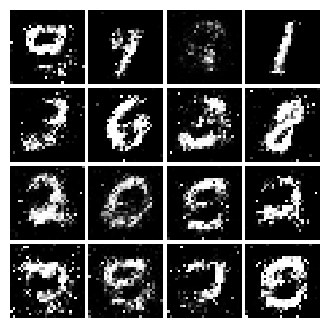

Epoch: 5, Iter: 2600, D: 1.529, G:0.7243


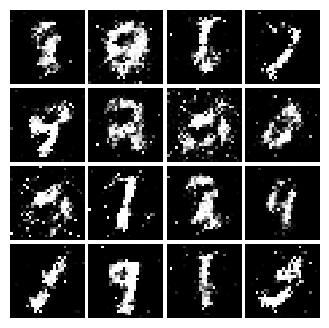

Epoch: 5, Iter: 2620, D: 1.27, G:0.9231


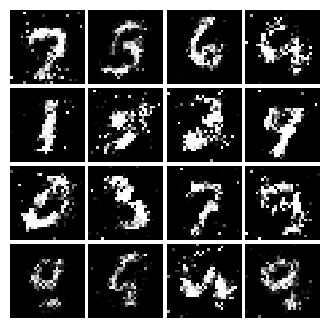

Epoch: 5, Iter: 2640, D: 1.341, G:0.935


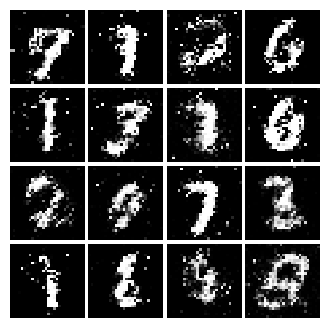

Epoch: 5, Iter: 2660, D: 1.321, G:0.8287


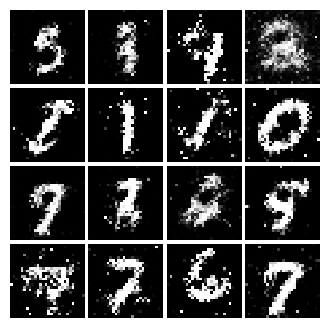

Epoch: 5, Iter: 2680, D: 1.32, G:0.8479


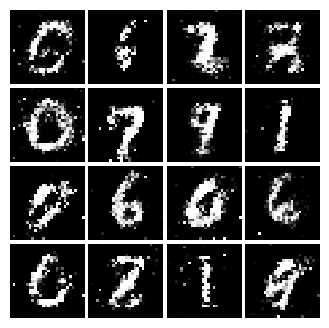

Epoch: 5, Iter: 2700, D: 1.288, G:0.8711


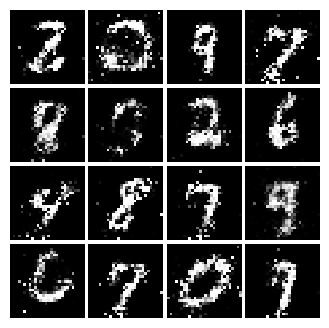

Epoch: 5, Iter: 2720, D: 1.265, G:0.8095


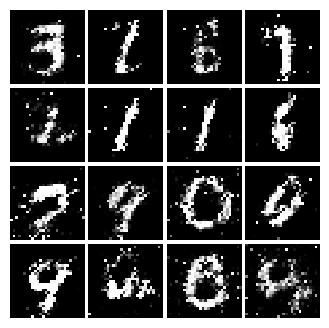

Epoch: 5, Iter: 2740, D: 1.403, G:0.9169


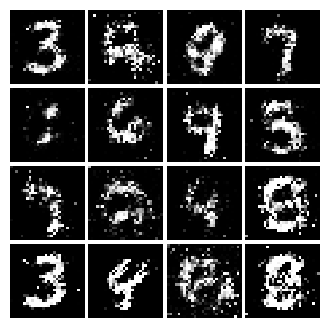

Epoch: 5, Iter: 2760, D: 1.29, G:0.846


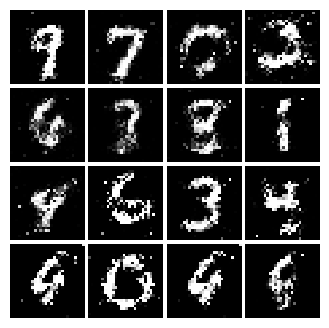

Epoch: 5, Iter: 2780, D: 1.242, G:0.7684


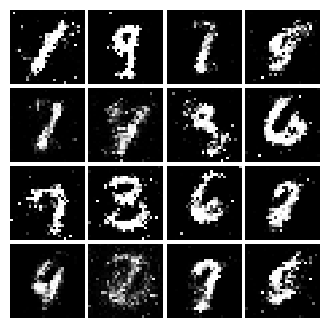

Epoch: 5, Iter: 2800, D: 1.297, G:0.8319


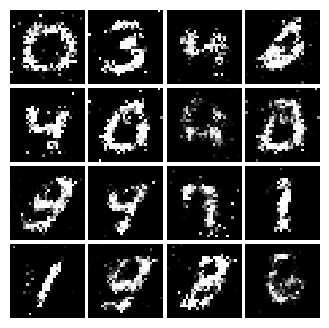

Epoch: 6, Iter: 2820, D: 1.294, G:0.806


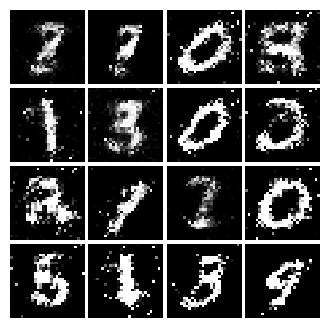

Epoch: 6, Iter: 2840, D: 1.295, G:0.8753


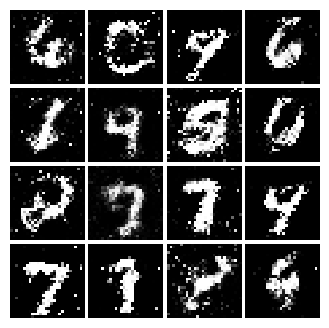

Epoch: 6, Iter: 2860, D: 1.321, G:0.832


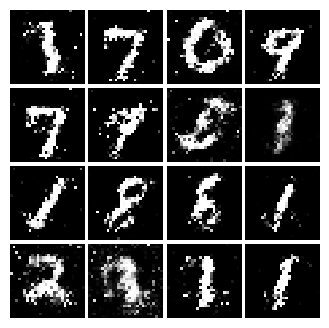

Epoch: 6, Iter: 2880, D: 1.248, G:0.8064


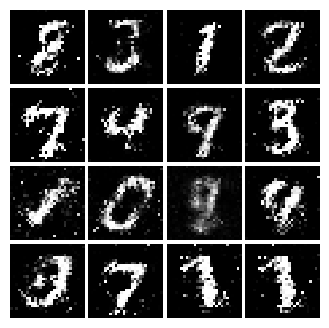

Epoch: 6, Iter: 2900, D: 1.299, G:0.7771


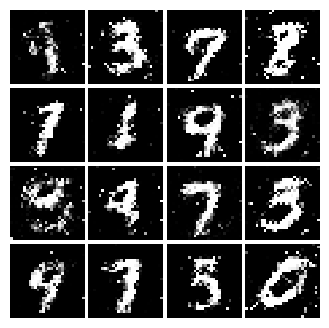

Epoch: 6, Iter: 2920, D: 1.389, G:0.9116


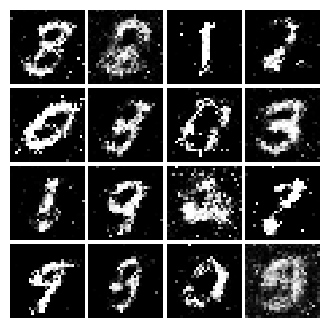

Epoch: 6, Iter: 2940, D: 1.297, G:0.7522


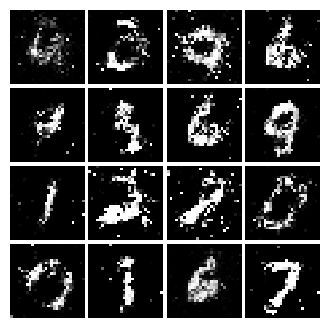

Epoch: 6, Iter: 2960, D: 1.319, G:0.9209


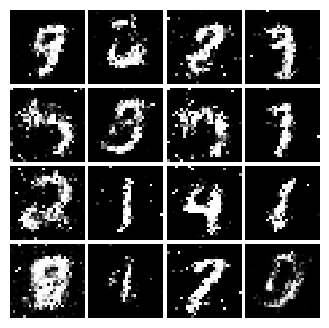

Epoch: 6, Iter: 2980, D: 1.336, G:0.7867


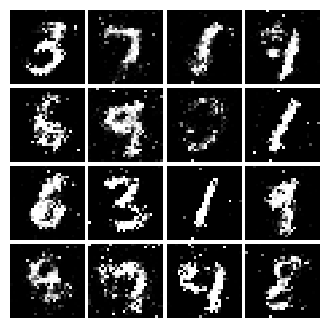

Epoch: 6, Iter: 3000, D: 1.281, G:0.8544


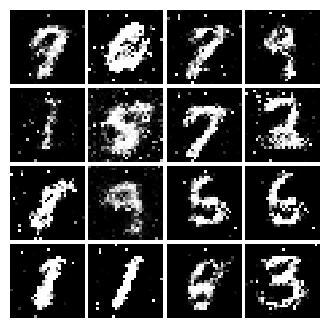

Epoch: 6, Iter: 3020, D: 1.302, G:0.8606


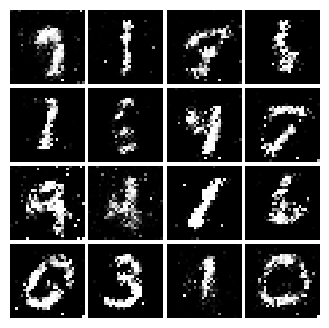

Epoch: 6, Iter: 3040, D: 1.382, G:0.8115


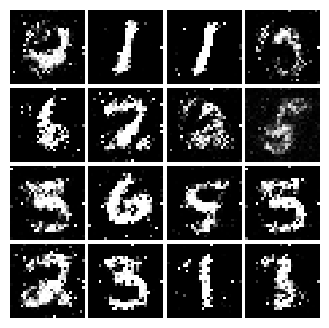

Epoch: 6, Iter: 3060, D: 1.24, G:0.8487


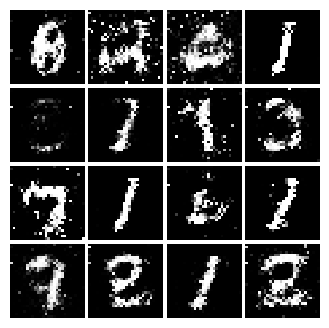

Epoch: 6, Iter: 3080, D: 1.258, G:0.8502


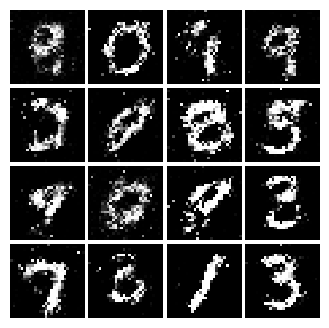

Epoch: 6, Iter: 3100, D: 1.287, G:0.8979


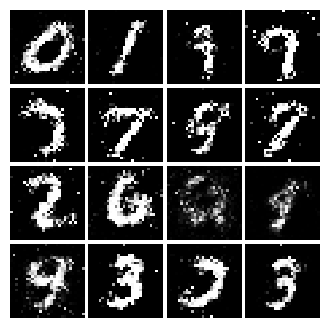

Epoch: 6, Iter: 3120, D: 1.327, G:0.7897


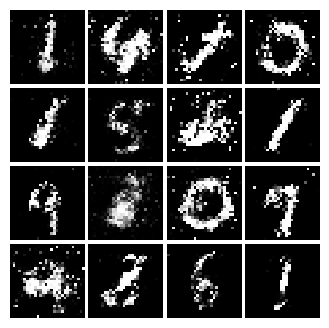

Epoch: 6, Iter: 3140, D: 1.289, G:0.8468


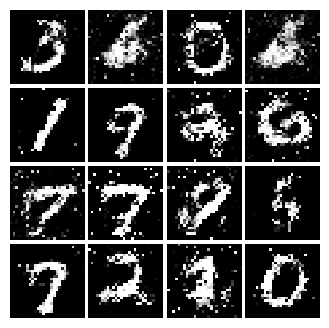

Epoch: 6, Iter: 3160, D: 1.187, G:1.077


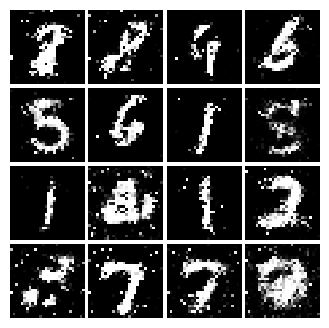

Epoch: 6, Iter: 3180, D: 1.29, G:0.8541


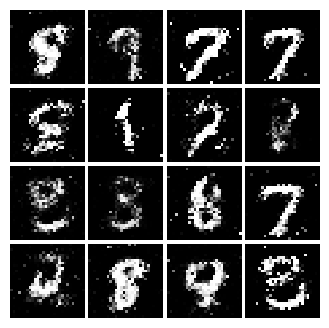

Epoch: 6, Iter: 3200, D: 1.229, G:0.8584


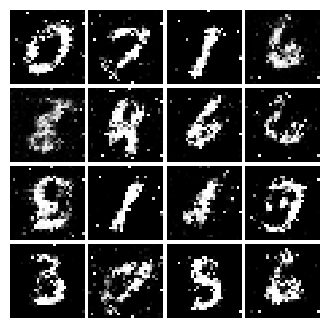

Epoch: 6, Iter: 3220, D: 1.345, G:0.7847


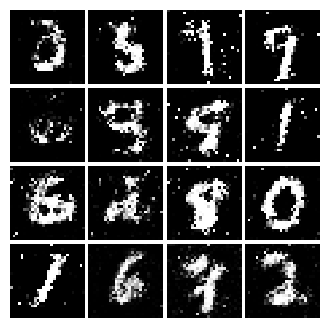

Epoch: 6, Iter: 3240, D: 1.172, G:0.8154


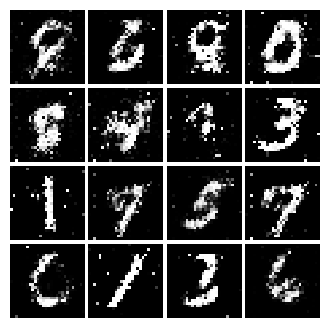

Epoch: 6, Iter: 3260, D: 1.351, G:0.8031


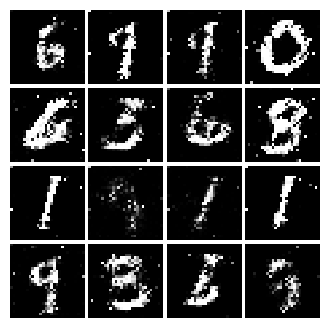

Epoch: 6, Iter: 3280, D: 1.328, G:0.91


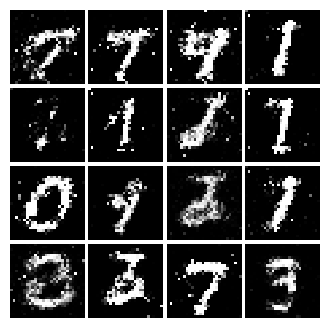

Epoch: 7, Iter: 3300, D: 1.195, G:0.8628


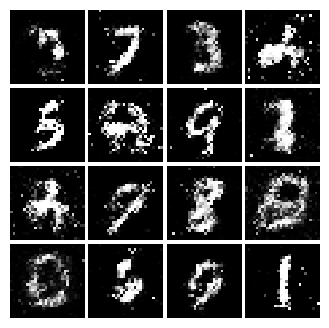

Epoch: 7, Iter: 3320, D: 1.388, G:0.7697


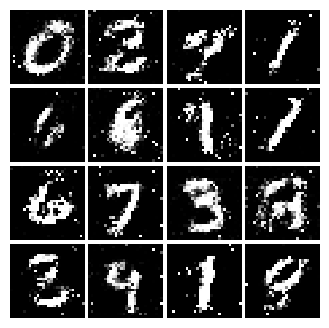

Epoch: 7, Iter: 3340, D: 1.295, G:0.8061


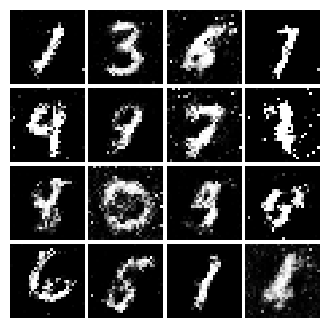

Epoch: 7, Iter: 3360, D: 1.293, G:0.8216


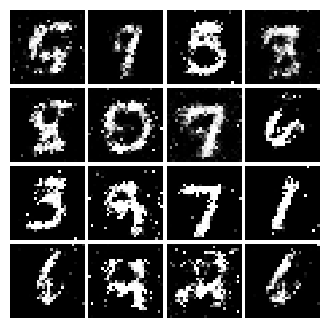

Epoch: 7, Iter: 3380, D: 1.295, G:0.8373


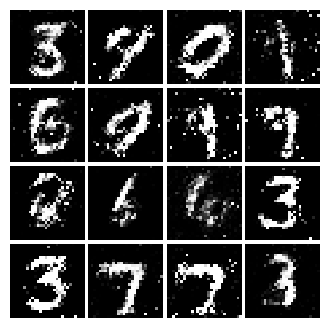

Epoch: 7, Iter: 3400, D: 1.536, G:0.9411


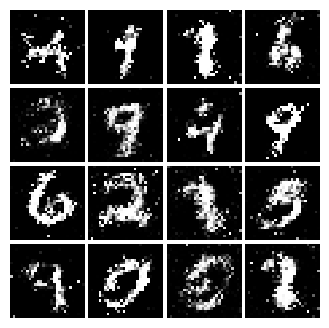

Epoch: 7, Iter: 3420, D: 1.394, G:0.8458


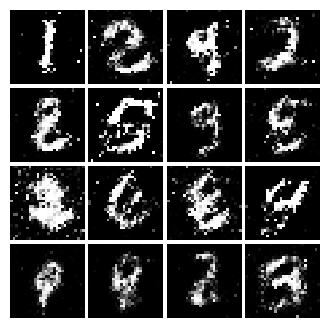

Epoch: 7, Iter: 3440, D: 1.282, G:0.9511


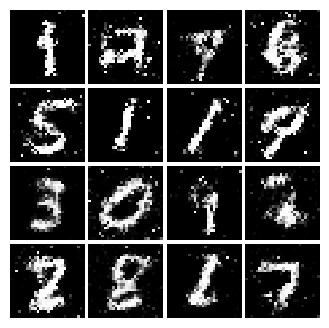

Epoch: 7, Iter: 3460, D: 1.208, G:0.8564


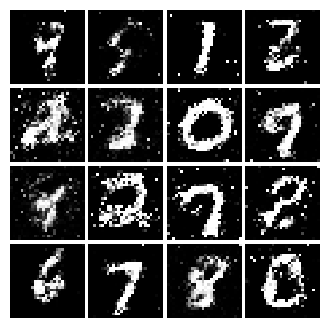

Epoch: 7, Iter: 3480, D: 1.345, G:0.8216


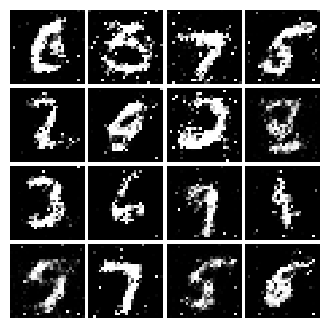

Epoch: 7, Iter: 3500, D: 1.321, G:0.8139


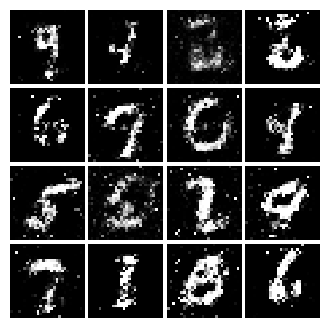

Epoch: 7, Iter: 3520, D: 1.306, G:0.8172


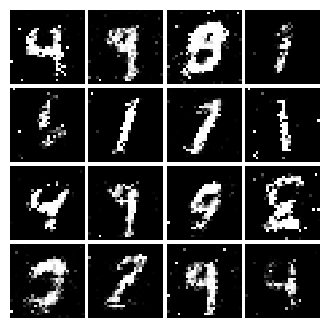

Epoch: 7, Iter: 3540, D: 1.321, G:0.877


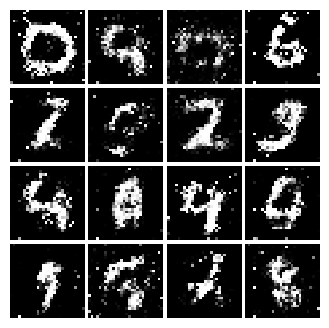

Epoch: 7, Iter: 3560, D: 1.23, G:1.039


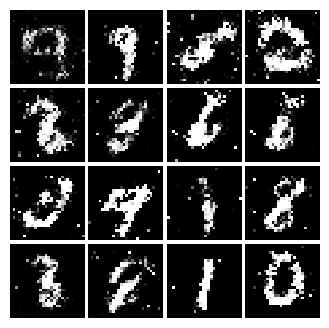

Epoch: 7, Iter: 3580, D: 1.316, G:0.9683


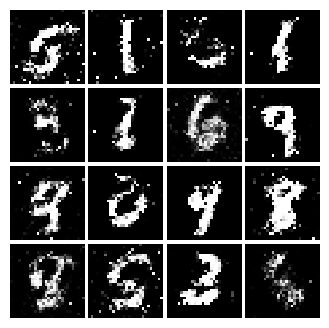

Epoch: 7, Iter: 3600, D: 1.306, G:0.8424


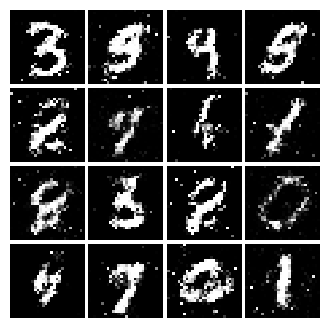

Epoch: 7, Iter: 3620, D: 1.315, G:0.8158


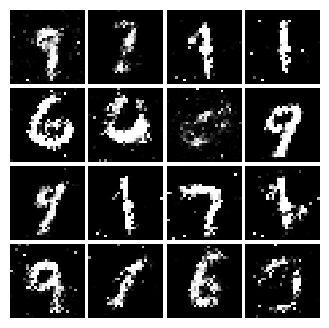

Epoch: 7, Iter: 3640, D: 1.34, G:0.7564


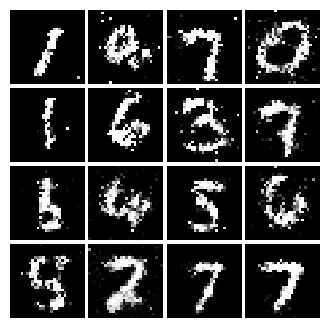

Epoch: 7, Iter: 3660, D: 1.338, G:0.789


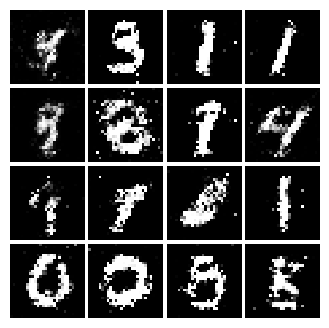

Epoch: 7, Iter: 3680, D: 1.257, G:0.874


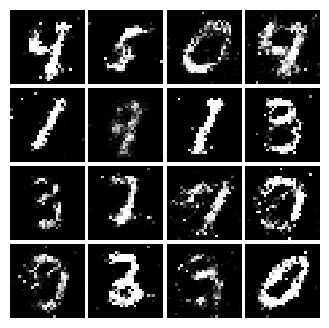

Epoch: 7, Iter: 3700, D: 1.393, G:0.8193


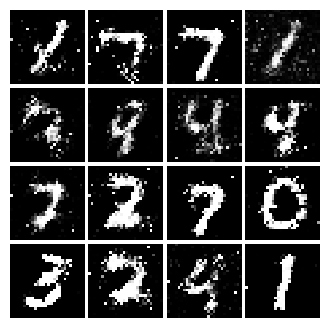

Epoch: 7, Iter: 3720, D: 1.323, G:0.8672


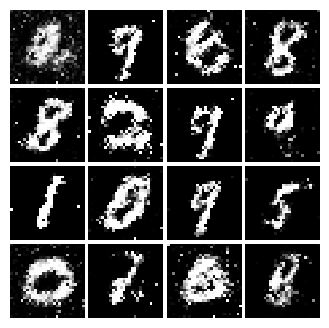

Epoch: 7, Iter: 3740, D: 1.349, G:0.8311


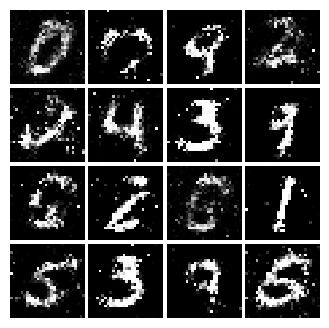

Epoch: 8, Iter: 3760, D: 1.37, G:0.8548


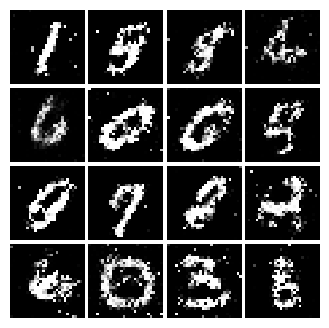

Epoch: 8, Iter: 3780, D: 1.421, G:0.8266


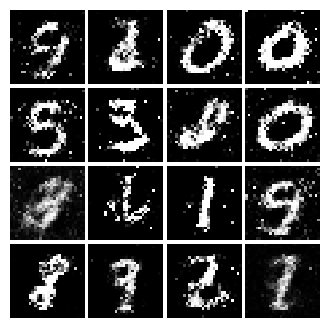

Epoch: 8, Iter: 3800, D: 1.399, G:0.8373


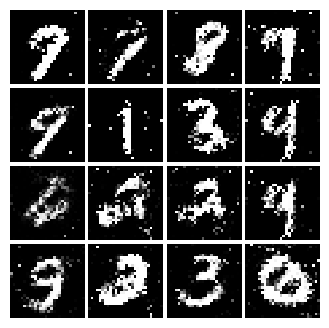

Epoch: 8, Iter: 3820, D: 1.342, G:0.7266


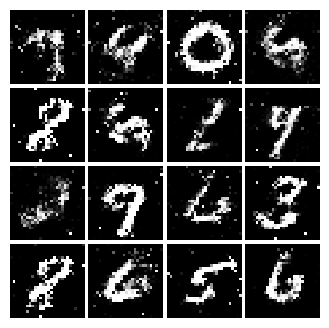

Epoch: 8, Iter: 3840, D: 1.299, G:0.8441


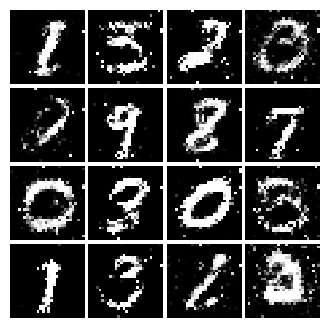

Epoch: 8, Iter: 3860, D: 1.33, G:0.8135


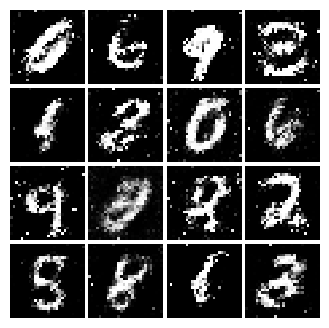

Epoch: 8, Iter: 3880, D: 1.302, G:0.7363


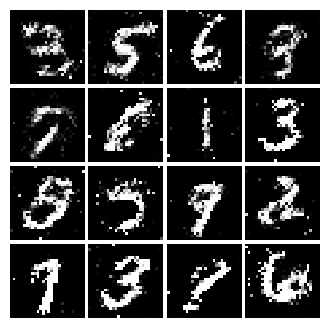

Epoch: 8, Iter: 3900, D: 1.383, G:0.8263


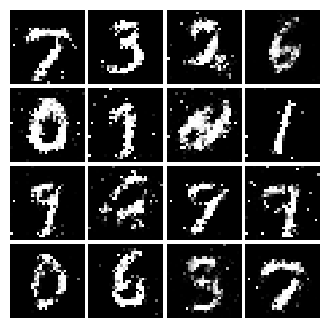

Epoch: 8, Iter: 3920, D: 1.295, G:0.8458


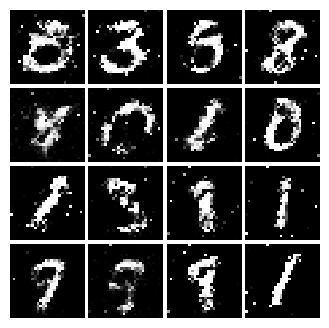

Epoch: 8, Iter: 3940, D: 1.467, G:0.8999


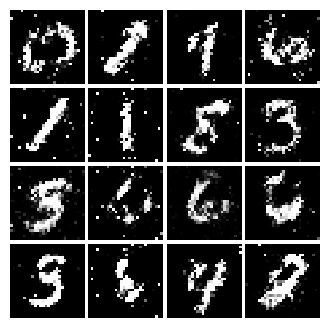

Epoch: 8, Iter: 3960, D: 1.373, G:0.7878


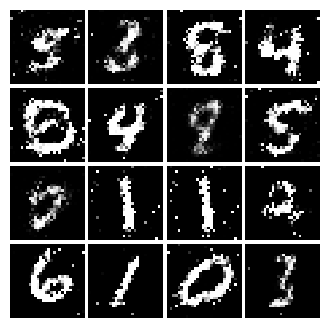

Epoch: 8, Iter: 3980, D: 1.351, G:0.8185


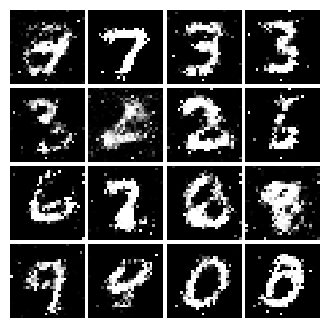

Epoch: 8, Iter: 4000, D: 1.283, G:0.8265


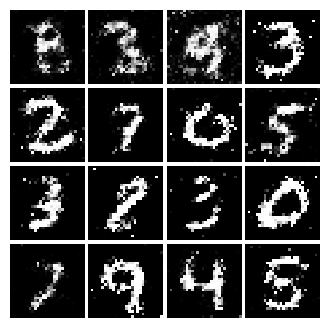

Epoch: 8, Iter: 4020, D: 1.269, G:0.8413


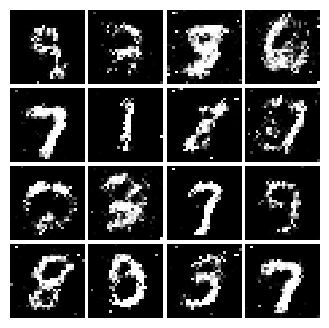

Epoch: 8, Iter: 4040, D: 1.328, G:0.8601


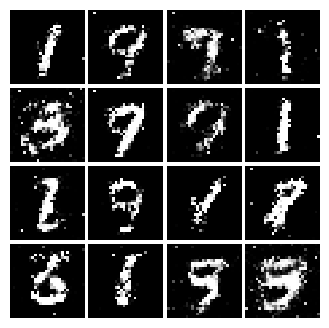

Epoch: 8, Iter: 4060, D: 1.324, G:0.8074


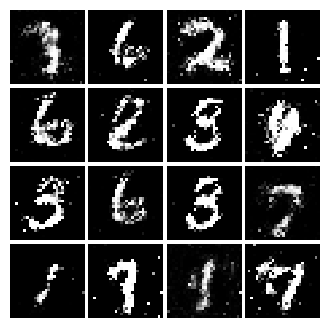

Epoch: 8, Iter: 4080, D: 1.388, G:0.7951


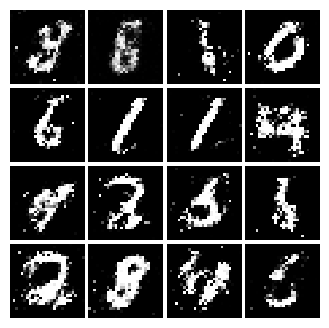

Epoch: 8, Iter: 4100, D: 1.396, G:0.9869


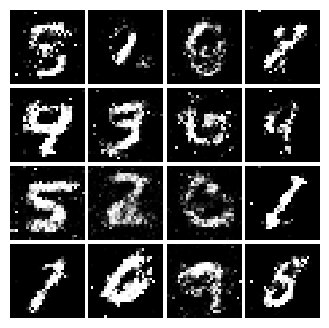

Epoch: 8, Iter: 4120, D: 1.309, G:0.7041


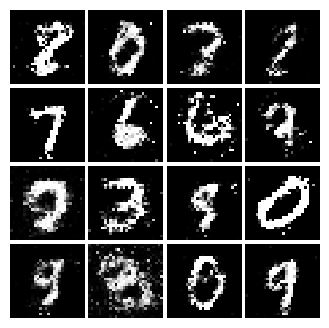

Epoch: 8, Iter: 4140, D: 1.32, G:0.8479


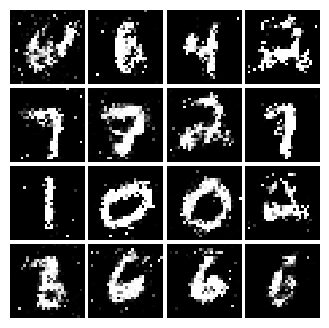

Epoch: 8, Iter: 4160, D: 1.361, G:0.8664


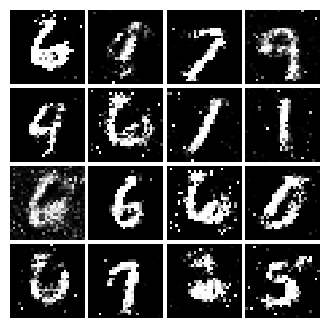

Epoch: 8, Iter: 4180, D: 1.41, G:0.7188


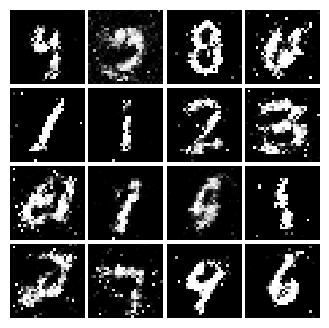

Epoch: 8, Iter: 4200, D: 1.288, G:0.8488


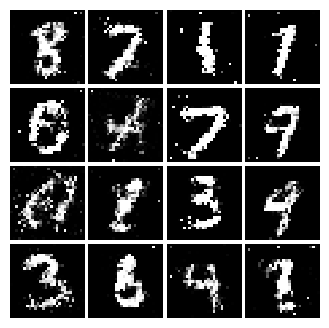

Epoch: 8, Iter: 4220, D: 1.278, G:1.134


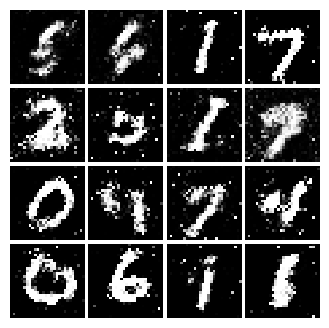

Epoch: 9, Iter: 4240, D: 1.393, G:0.8138


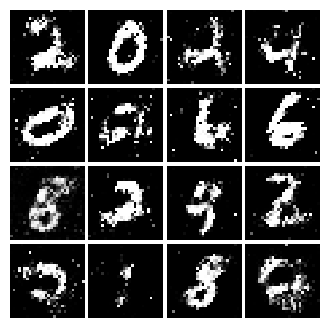

Epoch: 9, Iter: 4260, D: 1.424, G:0.7215


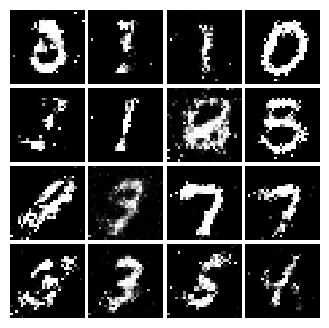

Epoch: 9, Iter: 4280, D: 1.224, G:0.8557


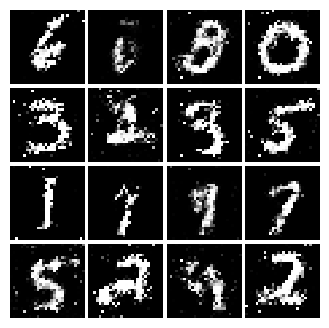

Epoch: 9, Iter: 4300, D: 1.458, G:0.7928


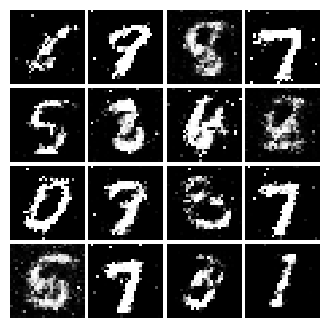

Epoch: 9, Iter: 4320, D: 1.363, G:0.9681


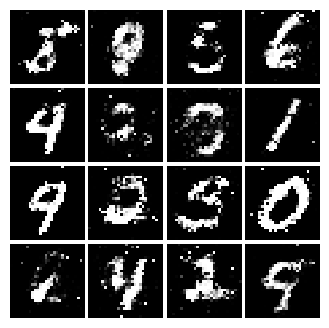

Epoch: 9, Iter: 4340, D: 1.357, G:0.8694


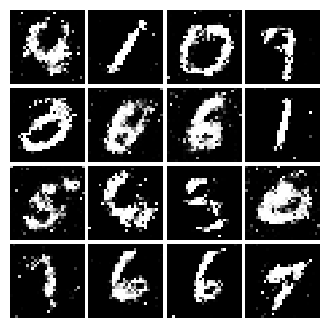

Epoch: 9, Iter: 4360, D: 1.352, G:0.8722


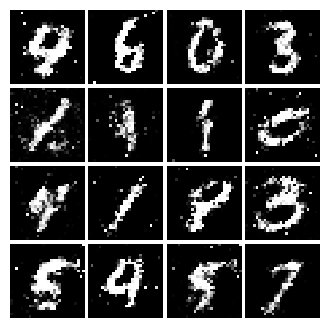

Epoch: 9, Iter: 4380, D: 1.342, G:0.9331


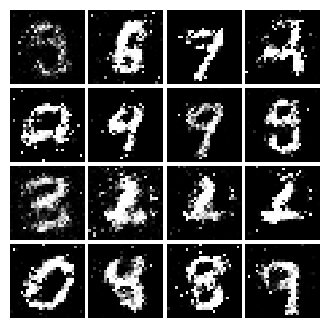

Epoch: 9, Iter: 4400, D: 1.249, G:0.8698


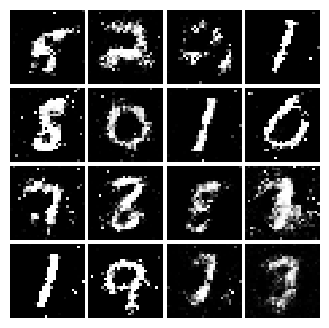

Epoch: 9, Iter: 4420, D: 1.381, G:0.753


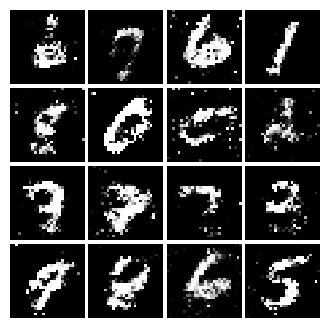

Epoch: 9, Iter: 4440, D: 1.342, G:0.7711


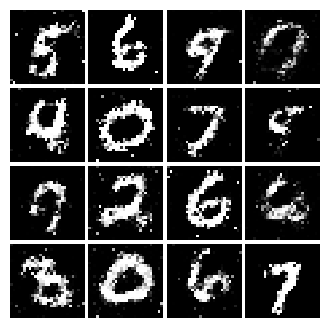

Epoch: 9, Iter: 4460, D: 1.308, G:0.7512


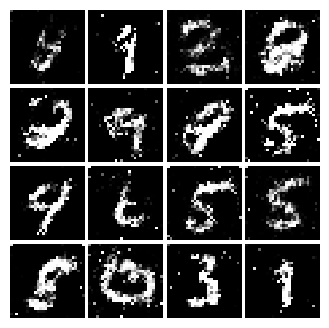

Epoch: 9, Iter: 4480, D: 1.324, G:0.8234


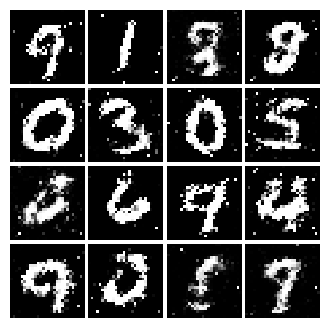

Epoch: 9, Iter: 4500, D: 1.448, G:0.7664


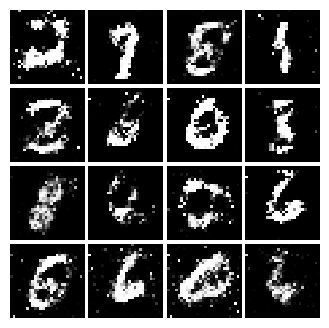

Epoch: 9, Iter: 4520, D: 1.357, G:0.7544


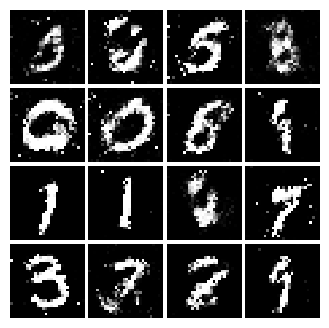

Epoch: 9, Iter: 4540, D: 1.337, G:0.7941


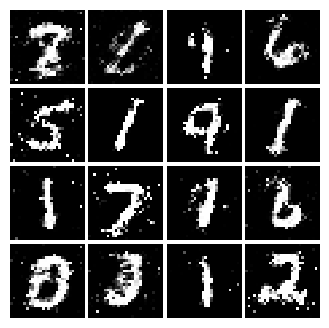

Epoch: 9, Iter: 4560, D: 1.314, G:0.7655


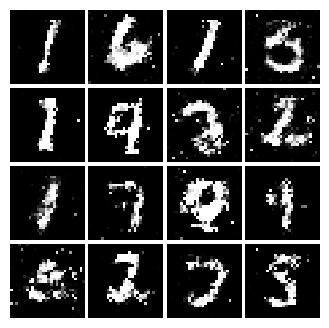

Epoch: 9, Iter: 4580, D: 1.337, G:0.7491


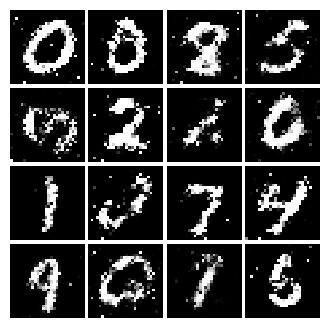

Epoch: 9, Iter: 4600, D: 1.363, G:0.7744


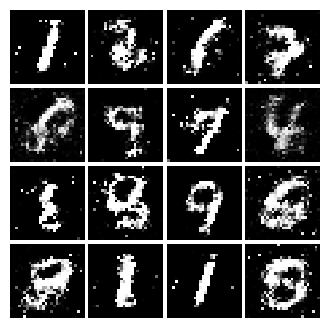

Epoch: 9, Iter: 4620, D: 1.34, G:0.7254


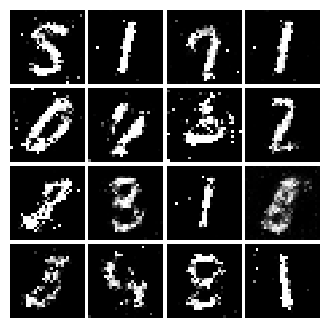

Epoch: 9, Iter: 4640, D: 1.322, G:0.7685


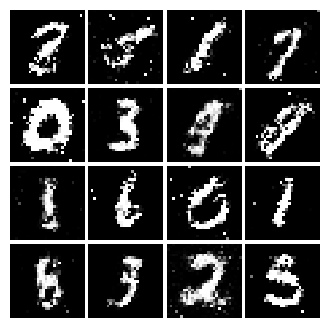

Epoch: 9, Iter: 4660, D: 1.317, G:0.765


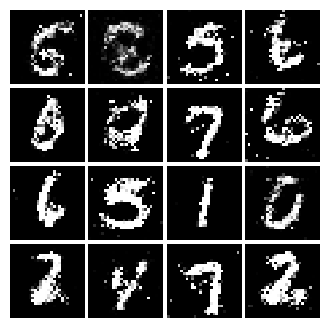

Epoch: 9, Iter: 4680, D: 1.305, G:0.8498


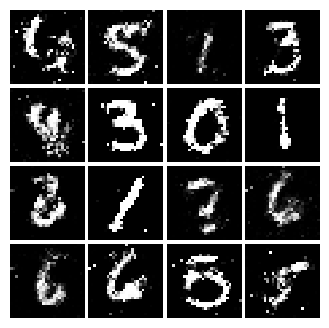

Final images


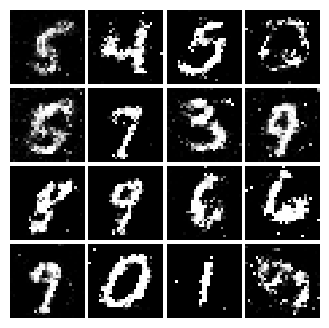

In [19]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [20]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.

    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    ###############################################################
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ###############################################################

    loss = (1/2)*(tf.reduce_mean(tf.square(scores_real - 1)) + tf.reduce_mean(tf.square(scores_fake)))

    #############################################################
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #############################################################
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.

    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.

    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    ###############################################################
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ###############################################################

    loss = (1/2)*tf.reduce_mean(tf.square(scores_fake - 1))

    #############################################################
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #############################################################
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [21]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):

    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.3966, G:0.3736


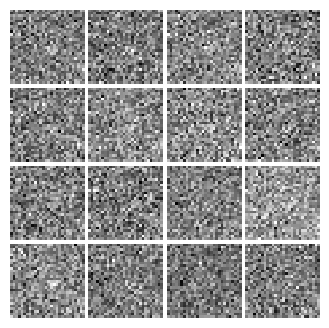

Epoch: 0, Iter: 20, D: 0.1147, G:1.701


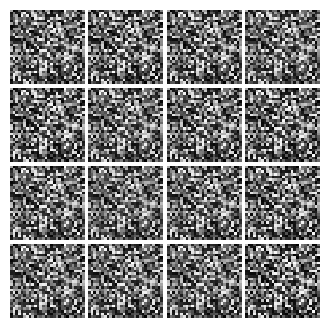

Epoch: 0, Iter: 40, D: 0.04964, G:0.7326


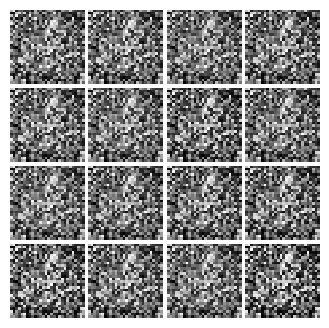

Epoch: 0, Iter: 60, D: 0.01915, G:0.758


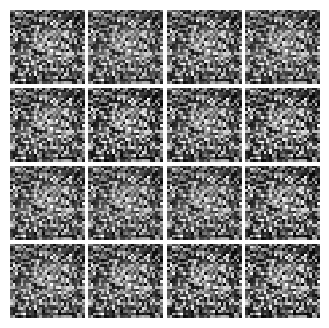

Epoch: 0, Iter: 80, D: 0.03151, G:0.8144


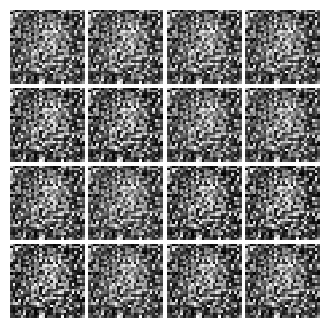

Epoch: 0, Iter: 100, D: 0.597, G:0.02064


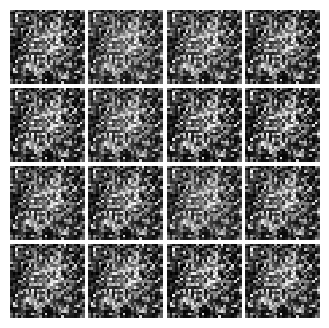

Epoch: 0, Iter: 120, D: 0.5117, G:0.1174


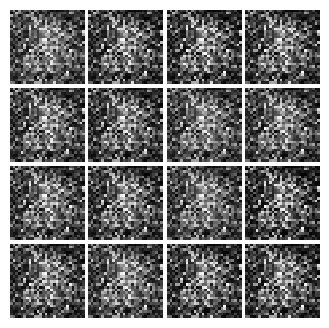

Epoch: 0, Iter: 140, D: 0.02791, G:0.7487


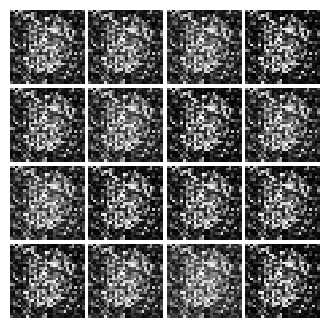

Epoch: 0, Iter: 160, D: 0.1188, G:0.3929


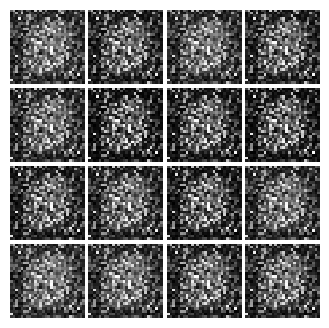

Epoch: 0, Iter: 180, D: 0.1767, G:0.5993


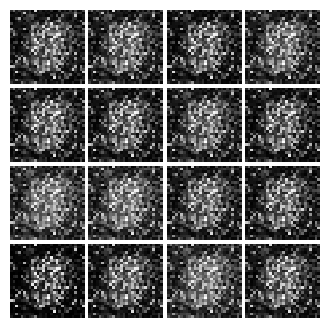

Epoch: 0, Iter: 200, D: 0.2378, G:0.3006


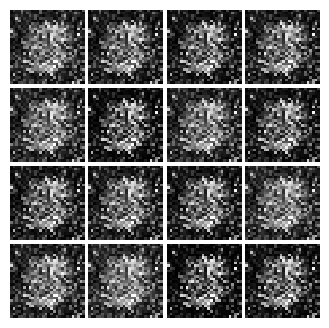

Epoch: 0, Iter: 220, D: 0.1267, G:0.4973


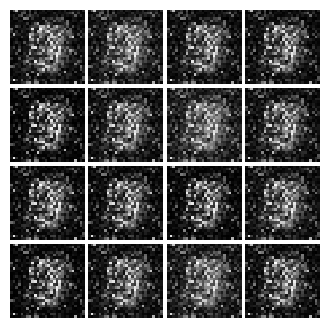

Epoch: 0, Iter: 240, D: 0.106, G:0.4071


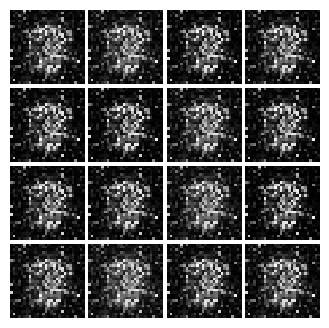

Epoch: 0, Iter: 260, D: 0.129, G:0.3015


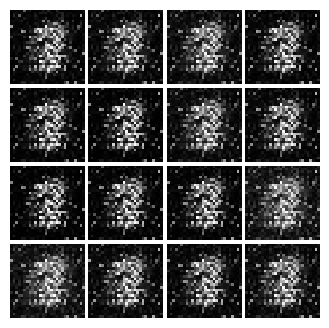

Epoch: 0, Iter: 280, D: 0.6888, G:0.1352


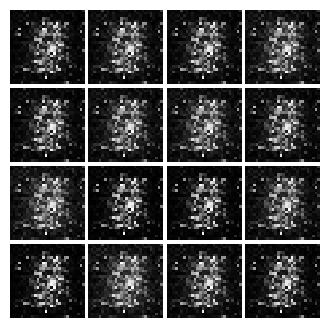

Epoch: 0, Iter: 300, D: 0.1148, G:1.015


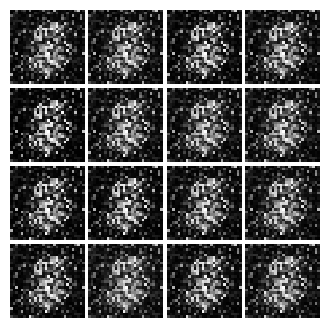

Epoch: 0, Iter: 320, D: 0.5118, G:4.795


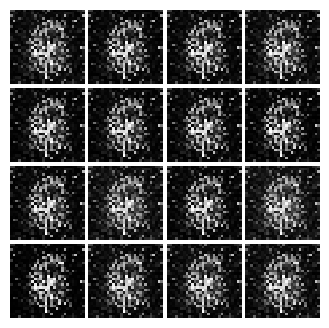

Epoch: 0, Iter: 340, D: 0.04436, G:0.636


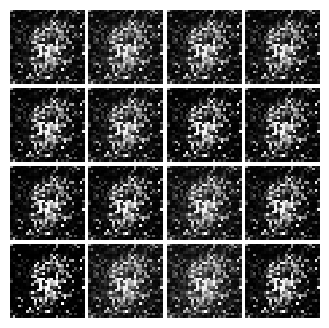

Epoch: 0, Iter: 360, D: 0.1192, G:0.4526


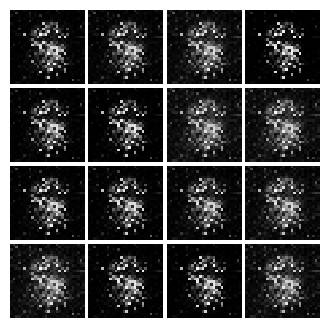

Epoch: 0, Iter: 380, D: 0.07835, G:0.5566


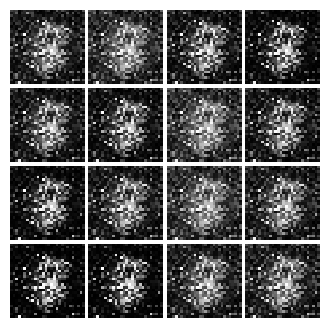

Epoch: 0, Iter: 400, D: 0.1121, G:0.6099


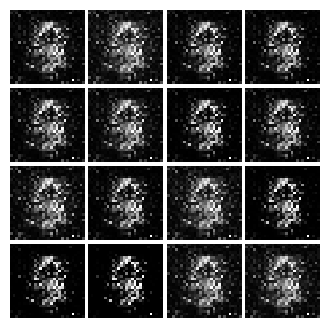

Epoch: 0, Iter: 420, D: 0.2774, G:0.2298


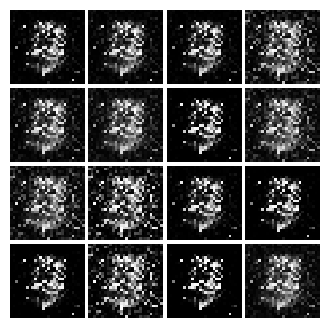

Epoch: 0, Iter: 440, D: 0.1364, G:0.2538


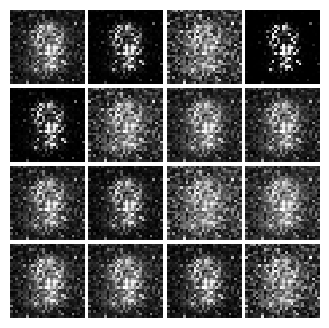

Epoch: 0, Iter: 460, D: 0.143, G:0.5167


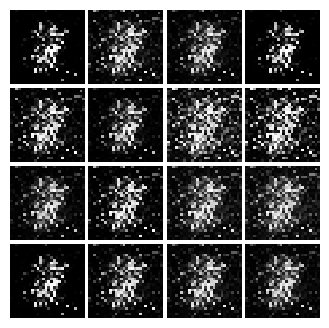

Epoch: 1, Iter: 480, D: 0.08227, G:0.4547


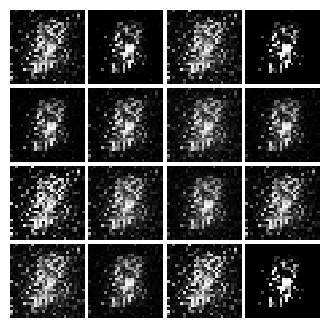

Epoch: 1, Iter: 500, D: 0.1341, G:0.5388


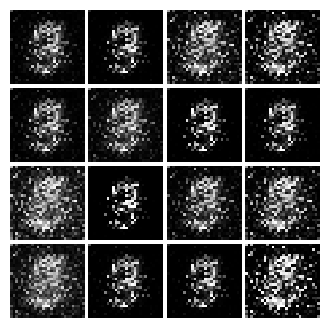

Epoch: 1, Iter: 520, D: 0.08475, G:0.4246


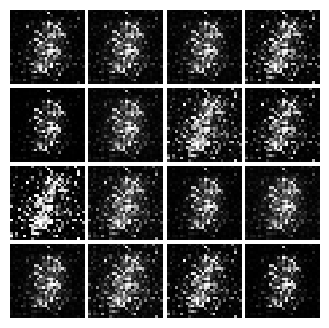

Epoch: 1, Iter: 540, D: 0.09093, G:0.5169


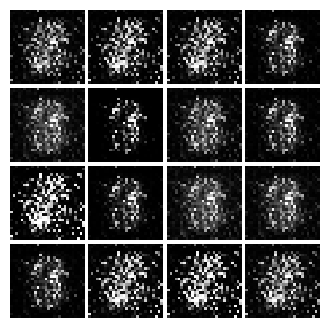

Epoch: 1, Iter: 560, D: 0.1496, G:0.4154


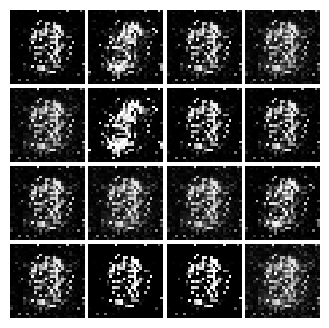

Epoch: 1, Iter: 580, D: 0.1067, G:0.5516


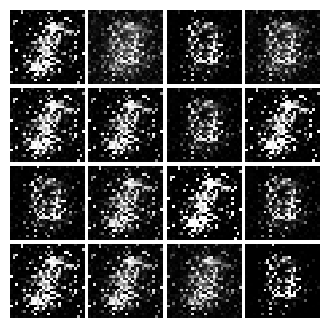

Epoch: 1, Iter: 600, D: 0.1664, G:0.4185


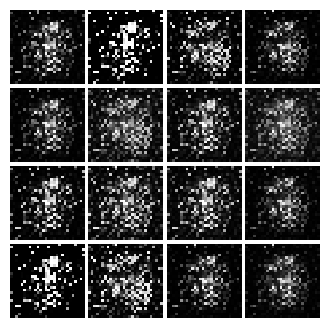

Epoch: 1, Iter: 620, D: 0.1594, G:0.5019


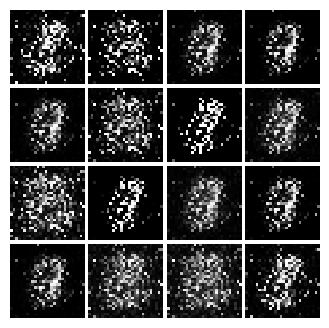

Epoch: 1, Iter: 640, D: 0.1424, G:0.6686


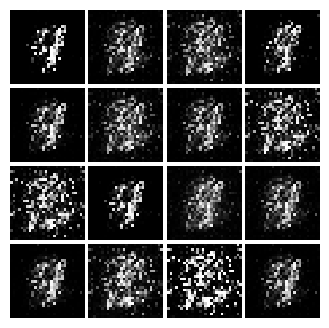

Epoch: 1, Iter: 660, D: 0.08899, G:0.359


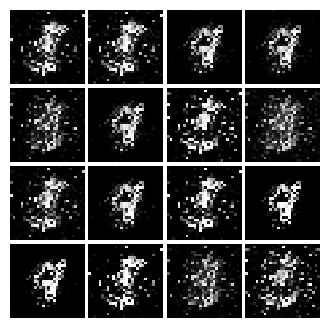

Epoch: 1, Iter: 680, D: 0.09545, G:0.3564


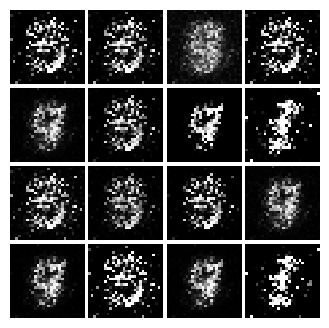

Epoch: 1, Iter: 700, D: 0.1087, G:0.6233


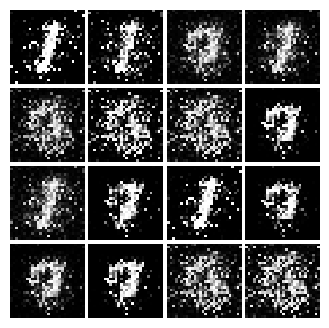

Epoch: 1, Iter: 720, D: 0.1198, G:0.3948


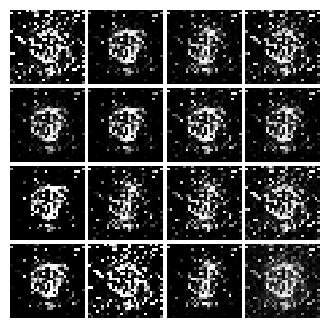

Epoch: 1, Iter: 740, D: 0.08883, G:0.4184


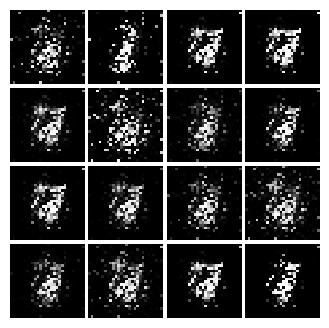

Epoch: 1, Iter: 760, D: 0.1542, G:0.5231


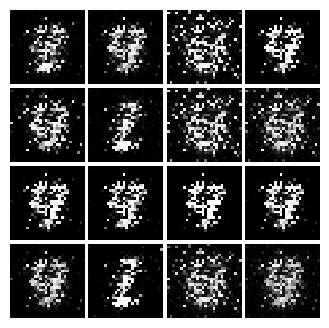

Epoch: 1, Iter: 780, D: 0.1308, G:0.3085


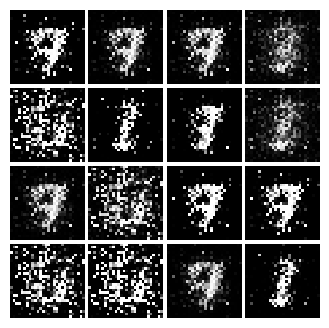

Epoch: 1, Iter: 800, D: 0.1793, G:0.2245


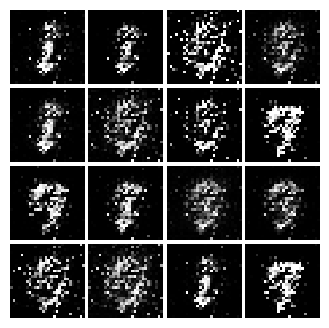

Epoch: 1, Iter: 820, D: 0.06998, G:0.3816


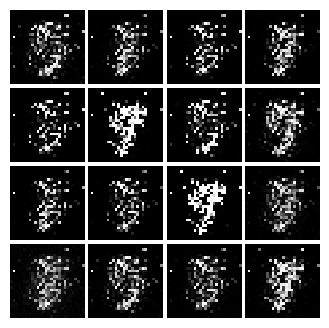

Epoch: 1, Iter: 840, D: 0.07683, G:0.4363


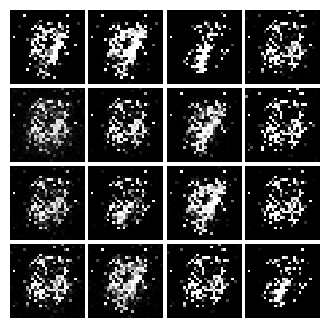

Epoch: 1, Iter: 860, D: 0.1626, G:0.5357


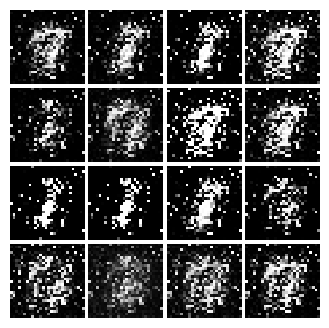

Epoch: 1, Iter: 880, D: 0.1187, G:0.3337


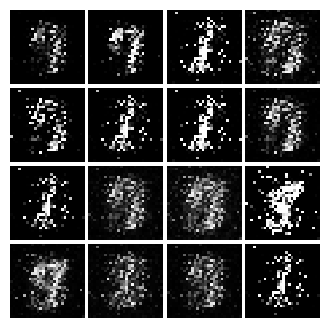

Epoch: 1, Iter: 900, D: 0.1144, G:0.9556


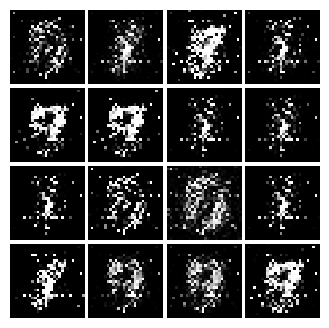

Epoch: 1, Iter: 920, D: 0.1532, G:0.3167


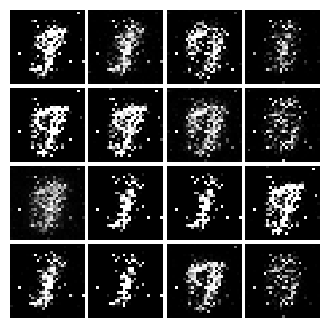

Epoch: 2, Iter: 940, D: 0.1369, G:0.3463


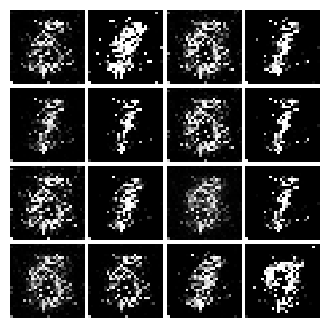

Epoch: 2, Iter: 960, D: 0.142, G:0.482


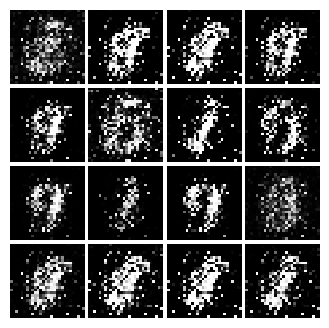

Epoch: 2, Iter: 980, D: 0.09163, G:0.8032


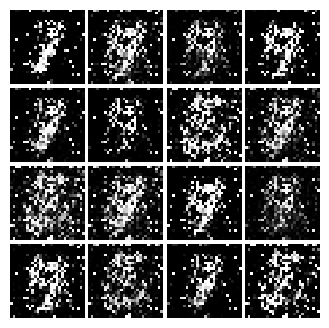

Epoch: 2, Iter: 1000, D: 0.1087, G:0.7778


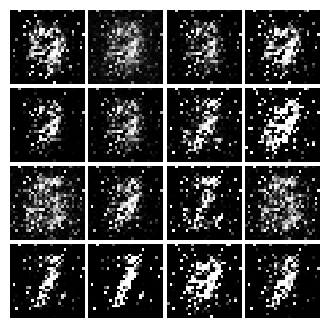

Epoch: 2, Iter: 1020, D: 0.1336, G:0.2888


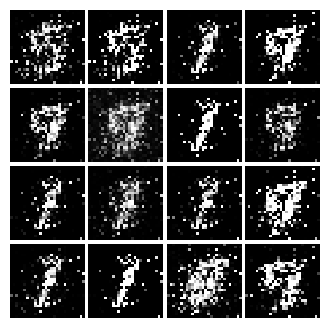

Epoch: 2, Iter: 1040, D: 0.1174, G:0.2795


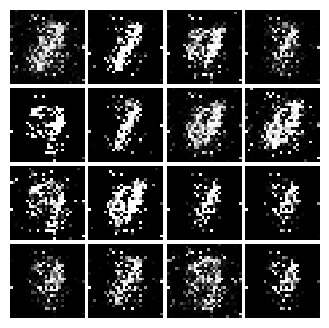

Epoch: 2, Iter: 1060, D: 0.1318, G:0.3893


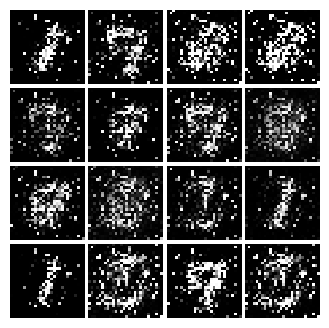

Epoch: 2, Iter: 1080, D: 0.1504, G:0.6097


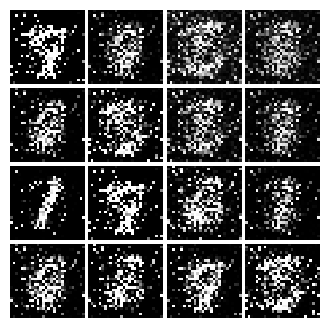

Epoch: 2, Iter: 1100, D: 0.1205, G:0.4629


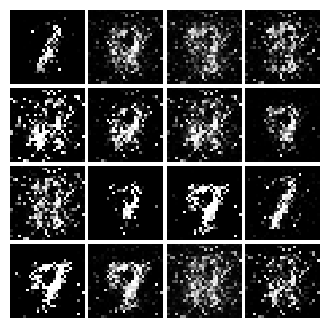

Epoch: 2, Iter: 1120, D: 0.1501, G:0.3563


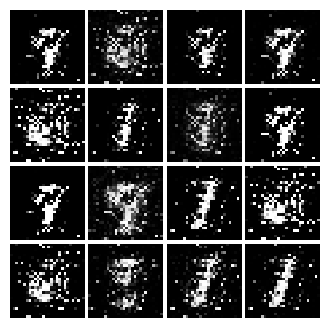

Epoch: 2, Iter: 1140, D: 0.1232, G:0.513


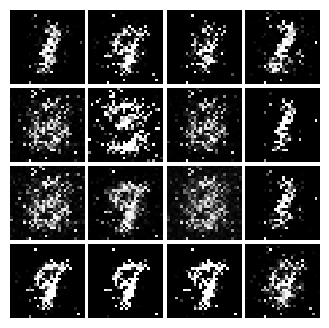

Epoch: 2, Iter: 1160, D: 0.1196, G:0.2702


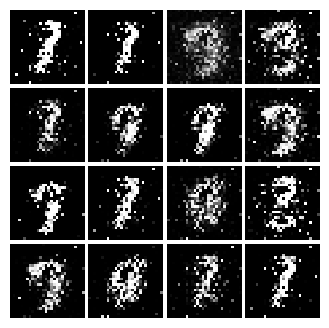

Epoch: 2, Iter: 1180, D: 0.1607, G:0.281


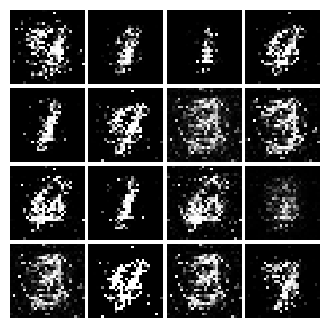

Epoch: 2, Iter: 1200, D: 0.1616, G:0.3124


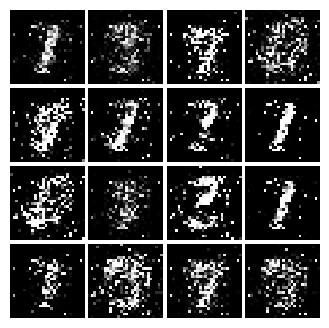

Epoch: 2, Iter: 1220, D: 0.1223, G:0.4445


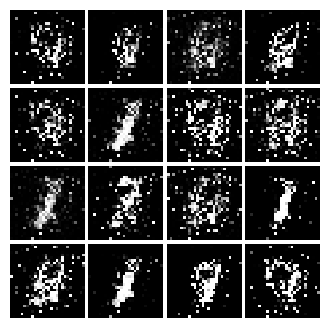

Epoch: 2, Iter: 1240, D: 0.1539, G:0.2367


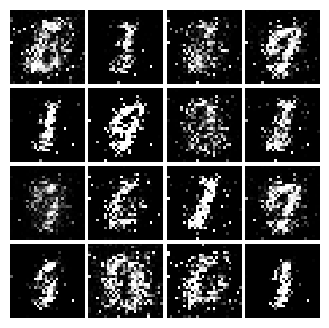

Epoch: 2, Iter: 1260, D: 0.1748, G:0.2816


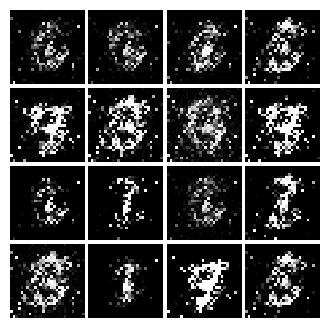

Epoch: 2, Iter: 1280, D: 0.1714, G:0.2885


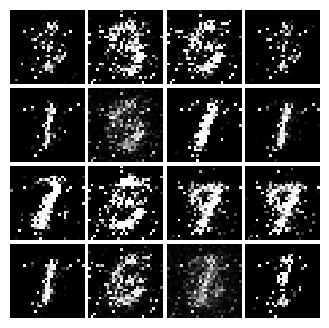

Epoch: 2, Iter: 1300, D: 0.14, G:0.3401


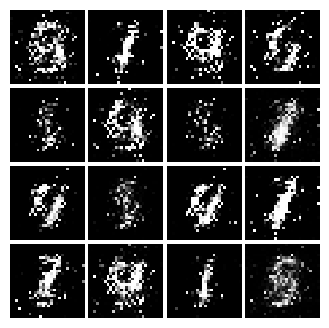

Epoch: 2, Iter: 1320, D: 0.1734, G:0.1564


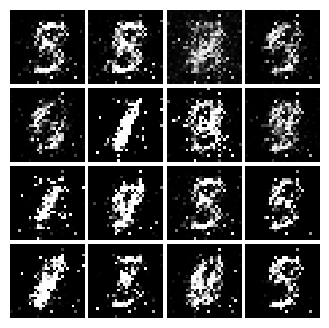

Epoch: 2, Iter: 1340, D: 0.1654, G:0.334


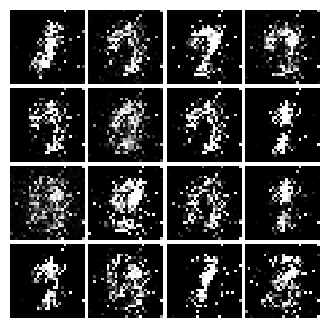

Epoch: 2, Iter: 1360, D: 0.1611, G:0.3083


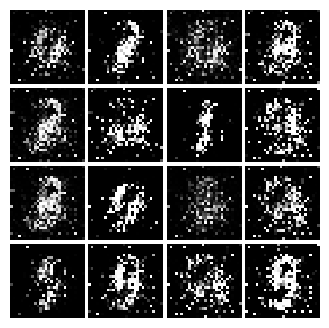

Epoch: 2, Iter: 1380, D: 0.1313, G:0.3325


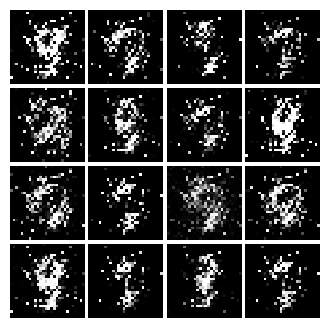

Epoch: 2, Iter: 1400, D: 0.1401, G:0.8006


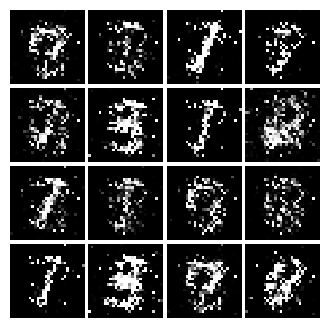

Epoch: 3, Iter: 1420, D: 0.1723, G:0.2156


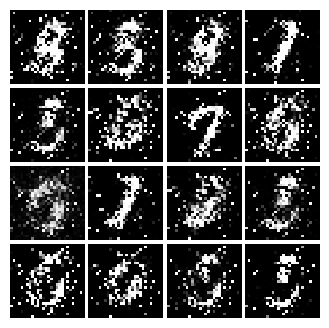

Epoch: 3, Iter: 1440, D: 0.1464, G:0.3197


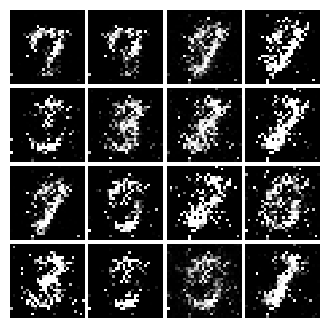

Epoch: 3, Iter: 1460, D: 0.172, G:0.5303


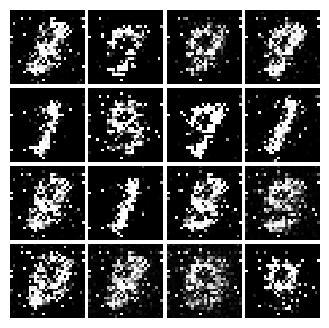

Epoch: 3, Iter: 1480, D: 0.1641, G:0.2918


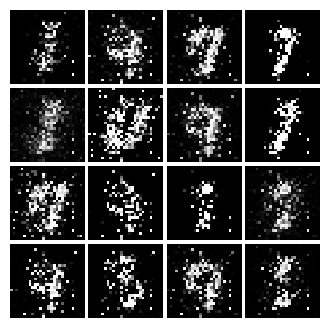

Epoch: 3, Iter: 1500, D: 0.1285, G:0.4123


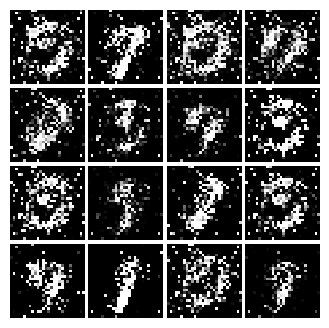

Epoch: 3, Iter: 1520, D: 0.3629, G:0.679


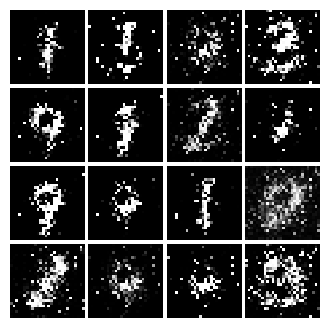

Epoch: 3, Iter: 1540, D: 0.1711, G:0.294


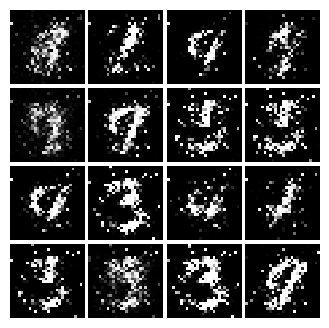

Epoch: 3, Iter: 1560, D: 0.1605, G:0.2139


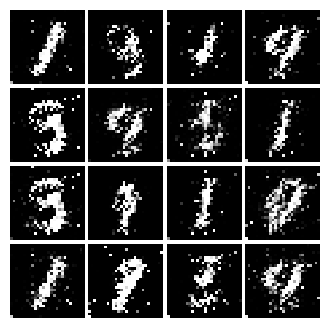

Epoch: 3, Iter: 1580, D: 0.1537, G:0.325


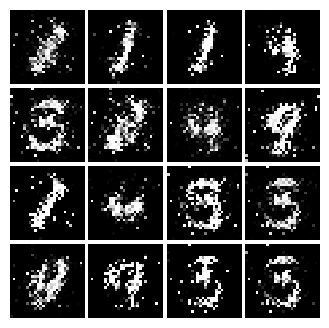

Epoch: 3, Iter: 1600, D: 0.1406, G:0.2857


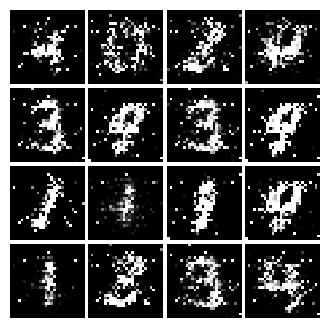

Epoch: 3, Iter: 1620, D: 0.1656, G:0.2776


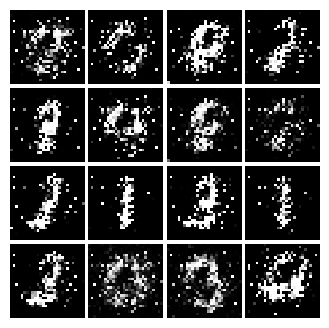

Epoch: 3, Iter: 1640, D: 0.2229, G:0.317


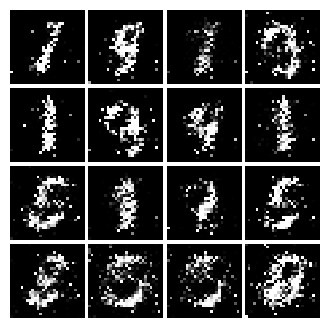

Epoch: 3, Iter: 1660, D: 0.1802, G:0.3006


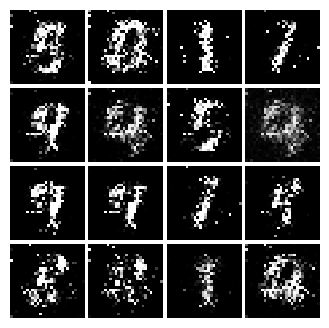

Epoch: 3, Iter: 1680, D: 0.1706, G:0.2965


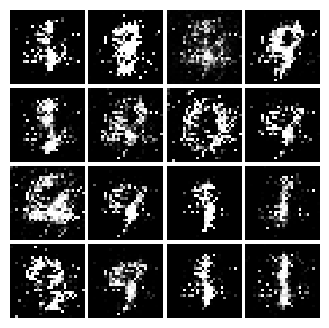

Epoch: 3, Iter: 1700, D: 0.161, G:0.3086


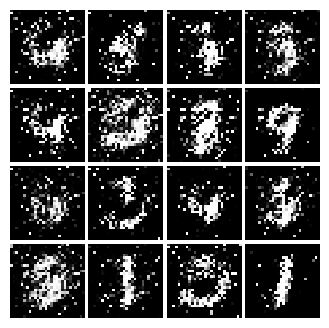

Epoch: 3, Iter: 1720, D: 0.1909, G:0.7007


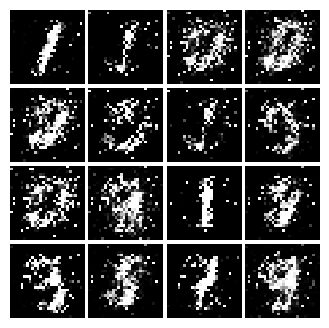

Epoch: 3, Iter: 1740, D: 0.154, G:0.4754


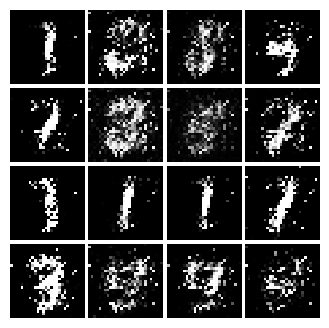

Epoch: 3, Iter: 1760, D: 0.1967, G:0.3479


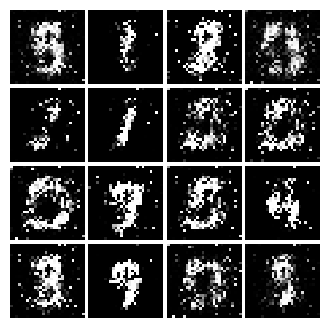

Epoch: 3, Iter: 1780, D: 0.1688, G:0.3335


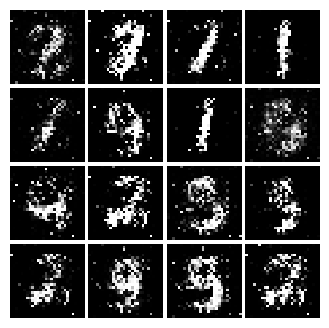

Epoch: 3, Iter: 1800, D: 0.1877, G:0.2832


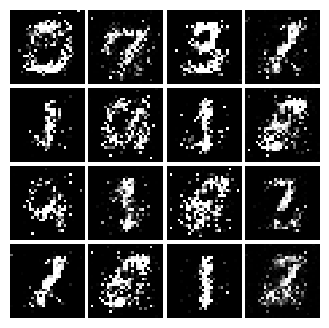

Epoch: 3, Iter: 1820, D: 0.2625, G:0.5257


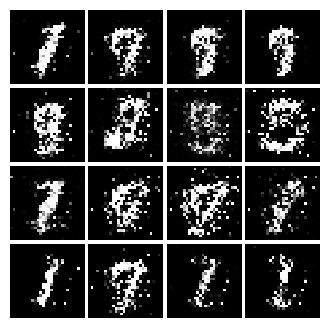

Epoch: 3, Iter: 1840, D: 0.1998, G:0.3713


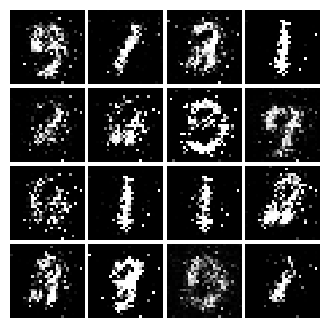

Epoch: 3, Iter: 1860, D: 0.1755, G:0.2623


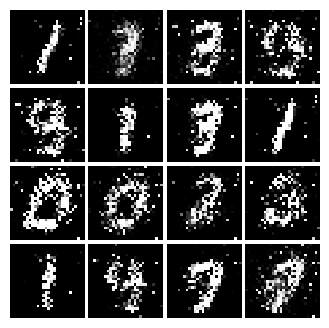

Epoch: 4, Iter: 1880, D: 0.1842, G:0.255


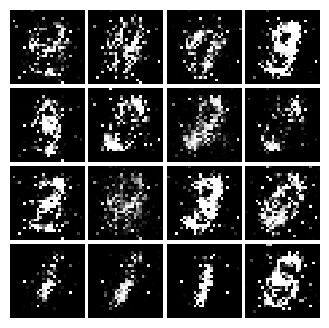

Epoch: 4, Iter: 1900, D: 0.1881, G:0.2379


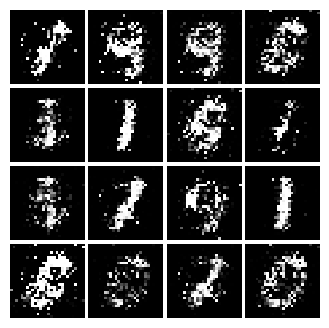

Epoch: 4, Iter: 1920, D: 0.1711, G:0.2452


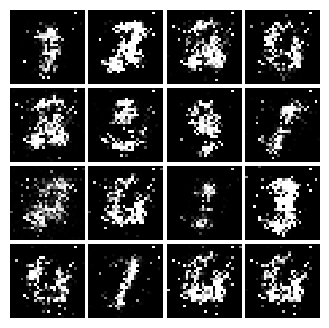

Epoch: 4, Iter: 1940, D: 0.1754, G:0.2144


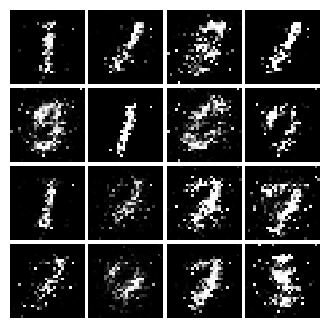

Epoch: 4, Iter: 1960, D: 0.181, G:0.2566


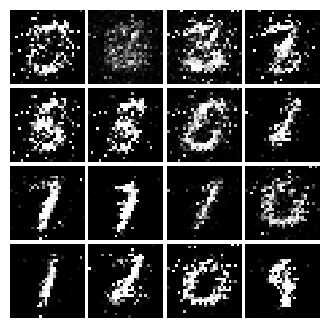

Epoch: 4, Iter: 1980, D: 0.2052, G:0.2015


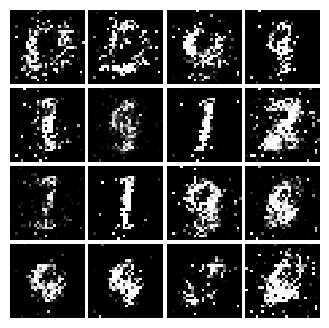

Epoch: 4, Iter: 2000, D: 0.2117, G:0.165


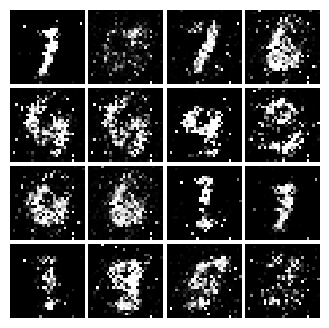

Epoch: 4, Iter: 2020, D: 0.2036, G:0.2282


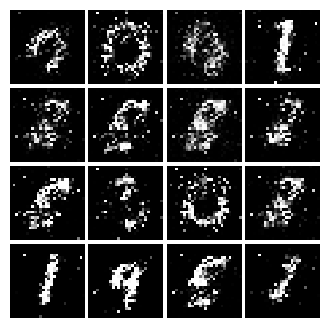

Epoch: 4, Iter: 2040, D: 0.197, G:0.2438


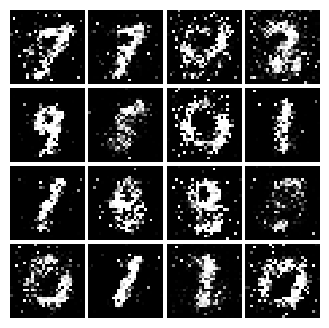

Epoch: 4, Iter: 2060, D: 0.2217, G:0.2309


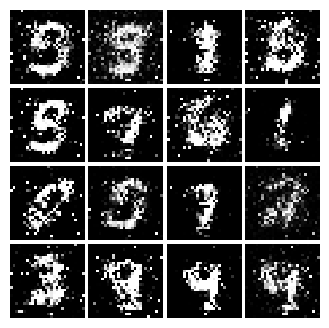

Epoch: 4, Iter: 2080, D: 0.2035, G:0.2894


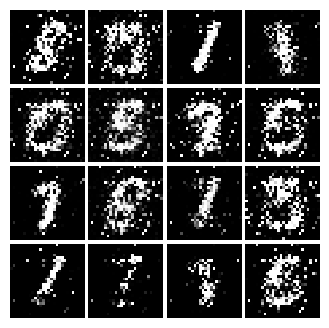

Epoch: 4, Iter: 2100, D: 0.2279, G:0.1755


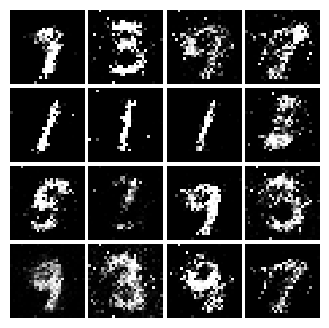

Epoch: 4, Iter: 2120, D: 0.2439, G:0.2356


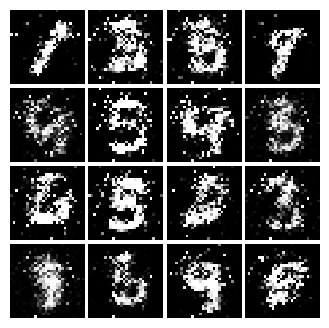

Epoch: 4, Iter: 2140, D: 0.2149, G:0.178


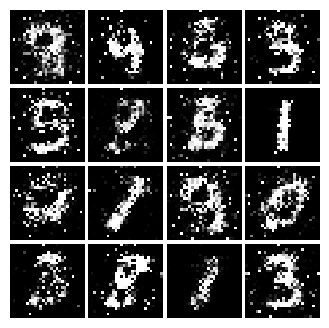

Epoch: 4, Iter: 2160, D: 0.2127, G:0.1969


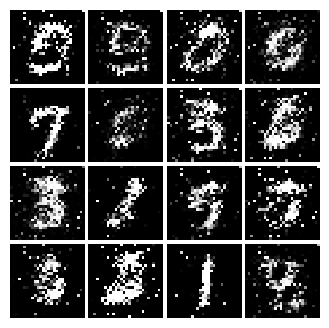

Epoch: 4, Iter: 2180, D: 0.2294, G:0.1714


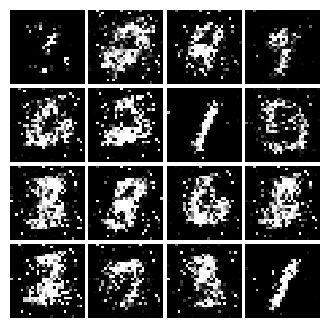

Epoch: 4, Iter: 2200, D: 0.2172, G:0.1694


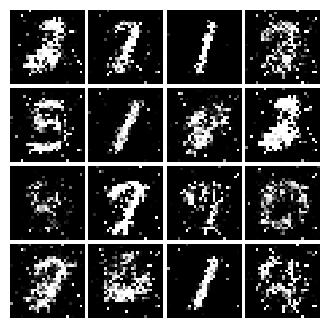

Epoch: 4, Iter: 2220, D: 0.2488, G:0.2085


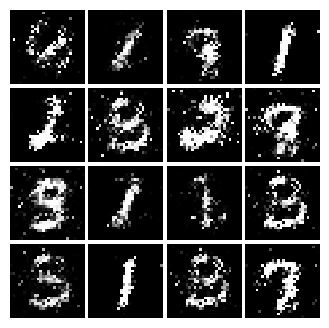

Epoch: 4, Iter: 2240, D: 0.2253, G:0.2154


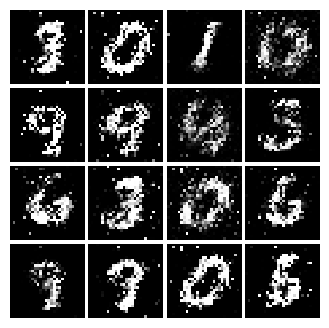

Epoch: 4, Iter: 2260, D: 0.1956, G:0.2313


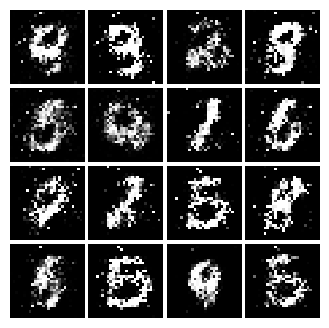

Epoch: 4, Iter: 2280, D: 0.2306, G:0.2066


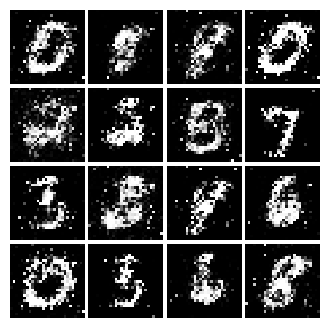

Epoch: 4, Iter: 2300, D: 0.2173, G:0.1901


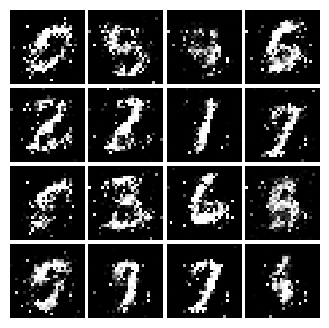

Epoch: 4, Iter: 2320, D: 0.1884, G:0.2126


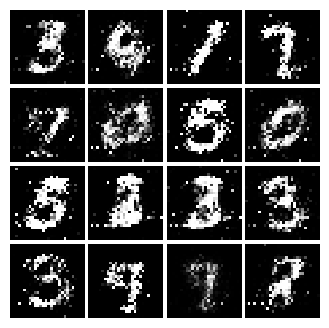

Epoch: 4, Iter: 2340, D: 0.2006, G:0.2075


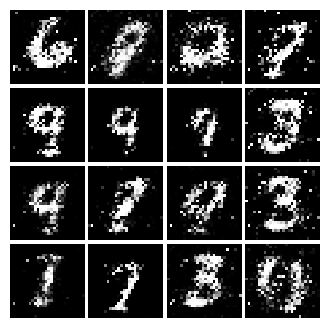

Epoch: 5, Iter: 2360, D: 0.222, G:0.1839


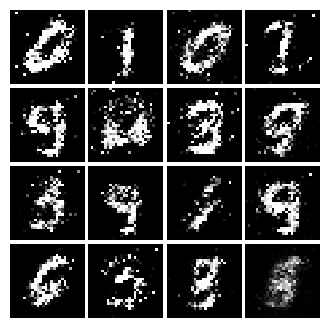

Epoch: 5, Iter: 2380, D: 0.2062, G:0.2073


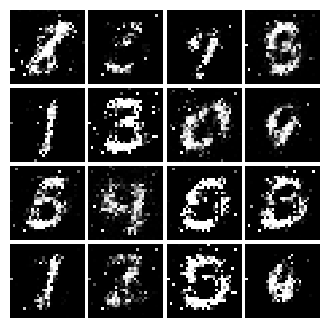

Epoch: 5, Iter: 2400, D: 0.1936, G:0.1847


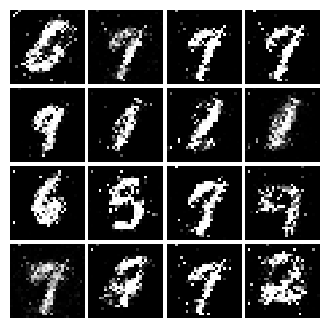

Epoch: 5, Iter: 2420, D: 0.2156, G:0.204


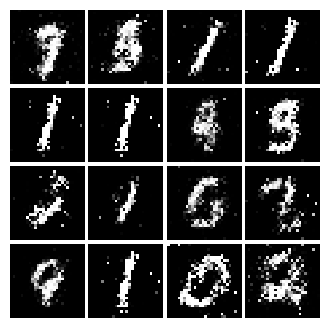

Epoch: 5, Iter: 2440, D: 0.2, G:0.2282


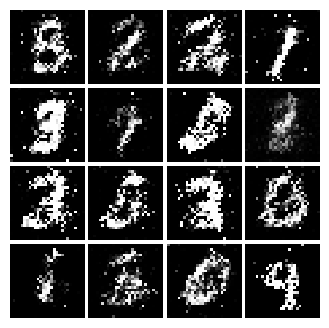

Epoch: 5, Iter: 2460, D: 0.1845, G:0.2074


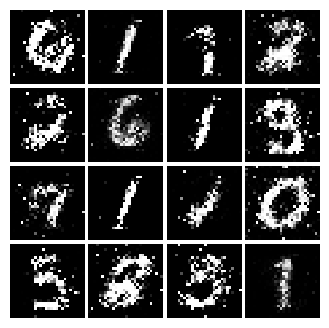

Epoch: 5, Iter: 2480, D: 0.1999, G:0.1881


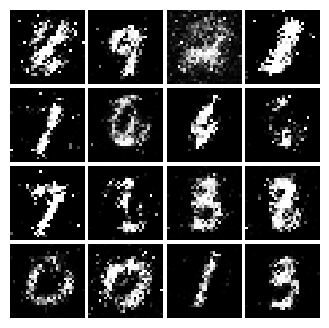

Epoch: 5, Iter: 2500, D: 0.1833, G:0.1985


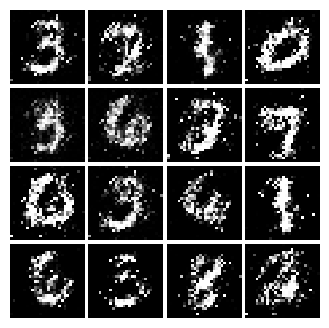

Epoch: 5, Iter: 2520, D: 0.2348, G:0.1806


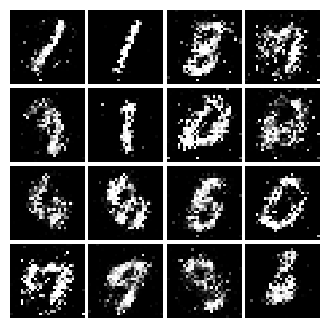

Epoch: 5, Iter: 2540, D: 0.2159, G:0.1996


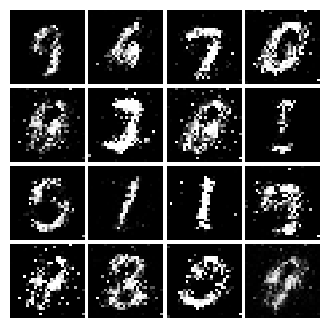

Epoch: 5, Iter: 2560, D: 0.2289, G:0.1724


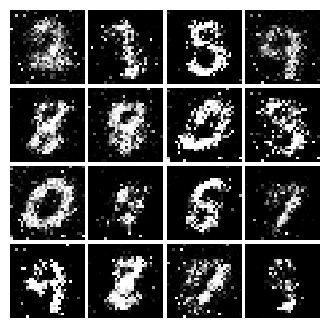

Epoch: 5, Iter: 2580, D: 0.2075, G:0.1945


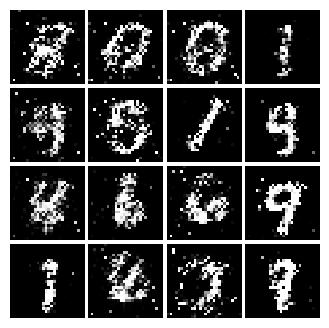

Epoch: 5, Iter: 2600, D: 0.2521, G:0.1977


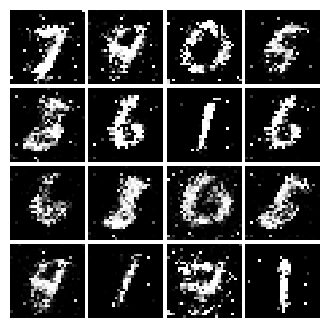

Epoch: 5, Iter: 2620, D: 0.2125, G:0.1873


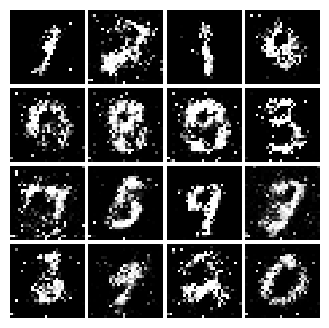

Epoch: 5, Iter: 2640, D: 0.2606, G:0.1947


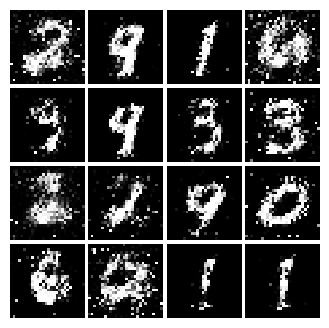

Epoch: 5, Iter: 2660, D: 0.2274, G:0.1621


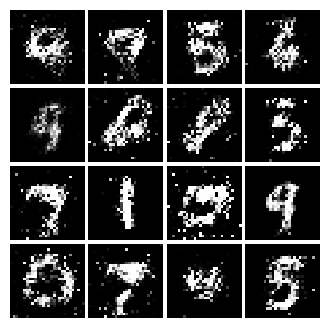

Epoch: 5, Iter: 2680, D: 0.2441, G:0.1737


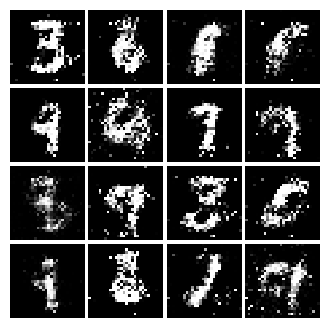

Epoch: 5, Iter: 2700, D: 0.231, G:0.186


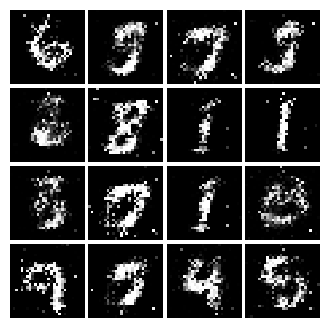

Epoch: 5, Iter: 2720, D: 0.2292, G:0.192


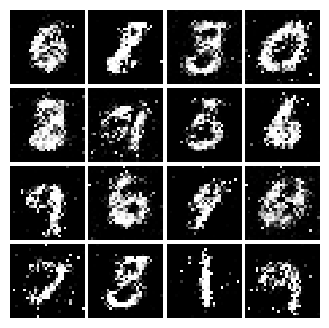

Epoch: 5, Iter: 2740, D: 0.2053, G:0.1886


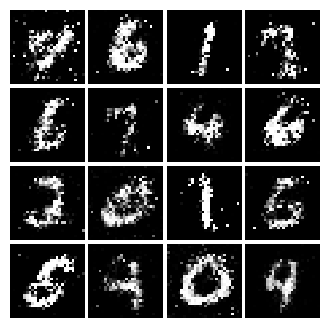

Epoch: 5, Iter: 2760, D: 0.2457, G:0.1698


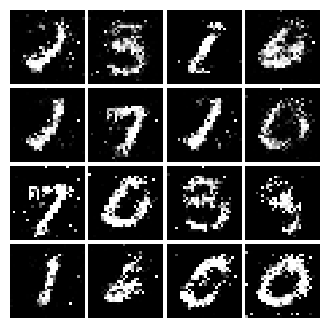

Epoch: 5, Iter: 2780, D: 0.2198, G:0.176


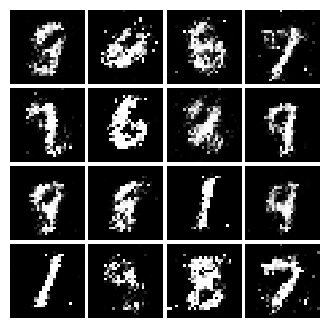

Epoch: 5, Iter: 2800, D: 0.2013, G:0.1897


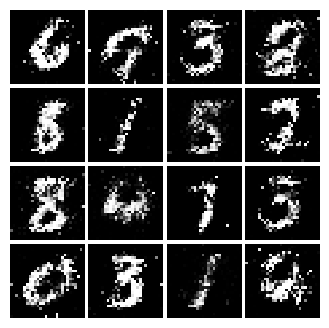

Epoch: 6, Iter: 2820, D: 0.2299, G:0.1947


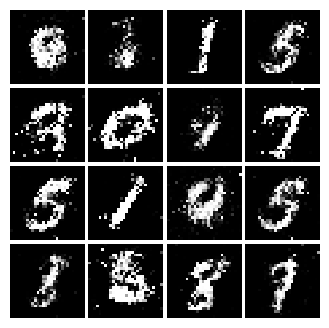

Epoch: 6, Iter: 2840, D: 0.2073, G:0.2083


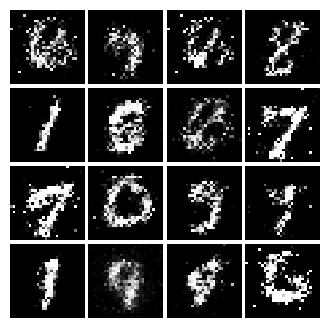

Epoch: 6, Iter: 2860, D: 0.2097, G:0.2005


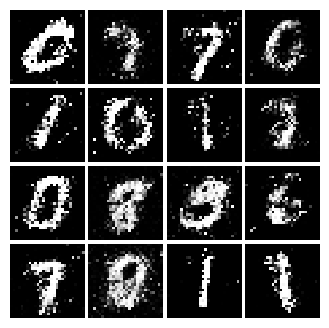

Epoch: 6, Iter: 2880, D: 0.1984, G:0.222


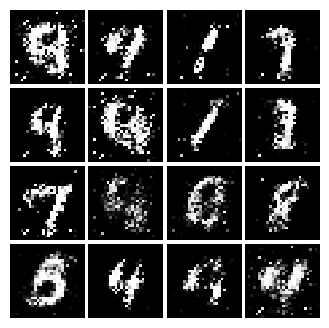

Epoch: 6, Iter: 2900, D: 0.196, G:0.1941


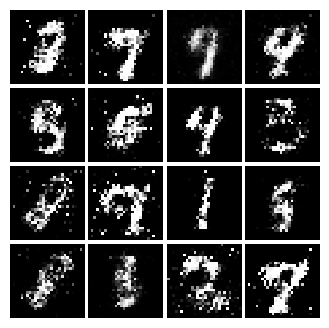

Epoch: 6, Iter: 2920, D: 0.2352, G:0.2108


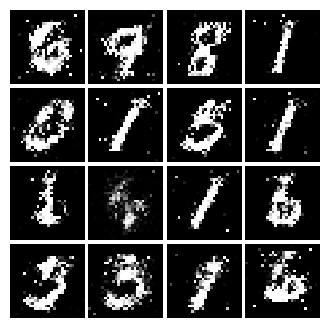

Epoch: 6, Iter: 2940, D: 0.2163, G:0.1792


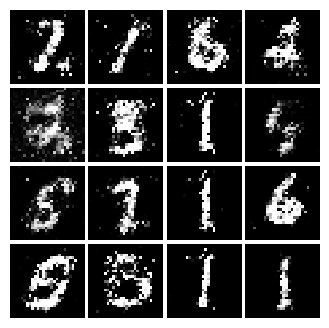

Epoch: 6, Iter: 2960, D: 0.2306, G:0.1899


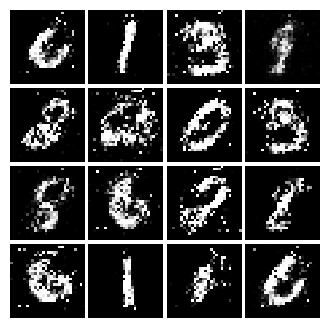

Epoch: 6, Iter: 2980, D: 0.231, G:0.1602


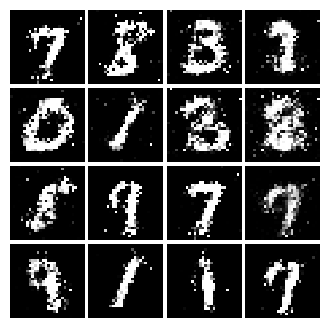

Epoch: 6, Iter: 3000, D: 0.2118, G:0.1923


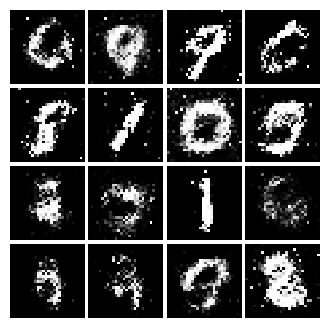

Epoch: 6, Iter: 3020, D: 0.2218, G:0.2094


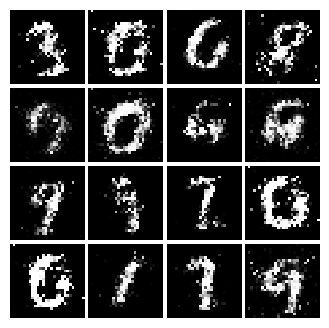

Epoch: 6, Iter: 3040, D: 0.2396, G:0.1722


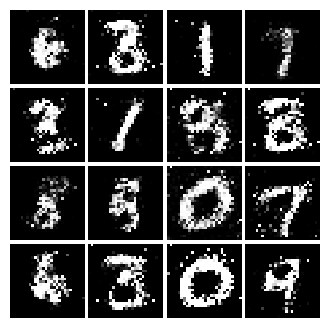

Epoch: 6, Iter: 3060, D: 0.2268, G:0.1618


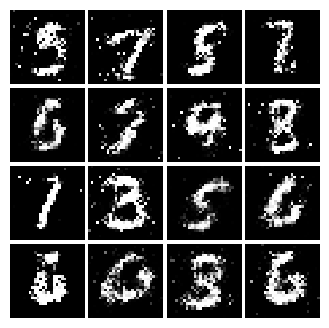

Epoch: 6, Iter: 3080, D: 0.2343, G:0.1688


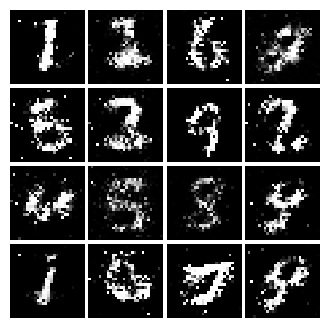

Epoch: 6, Iter: 3100, D: 0.2108, G:0.1646


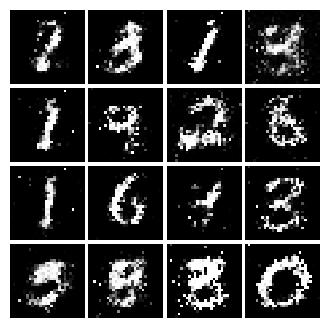

Epoch: 6, Iter: 3120, D: 0.2016, G:0.1748


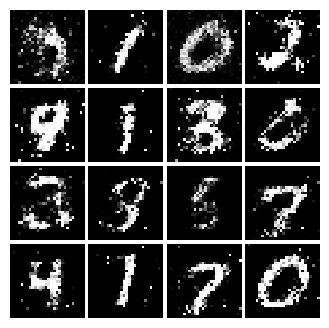

Epoch: 6, Iter: 3140, D: 0.2317, G:0.1606


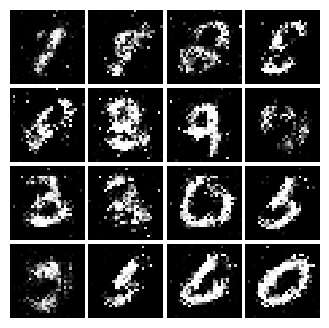

Epoch: 6, Iter: 3160, D: 0.2313, G:0.1696


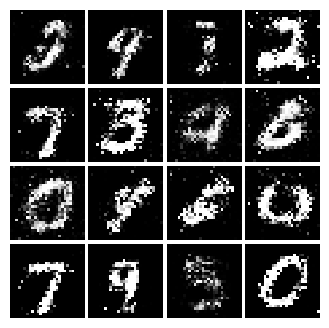

Epoch: 6, Iter: 3180, D: 0.2117, G:0.1719


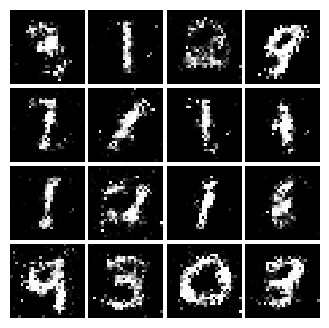

Epoch: 6, Iter: 3200, D: 0.2151, G:0.1599


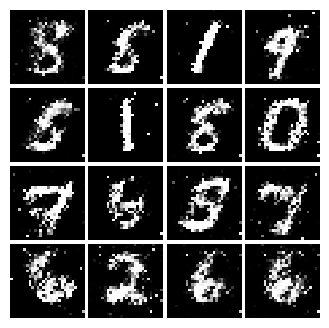

Epoch: 6, Iter: 3220, D: 0.2169, G:0.1673


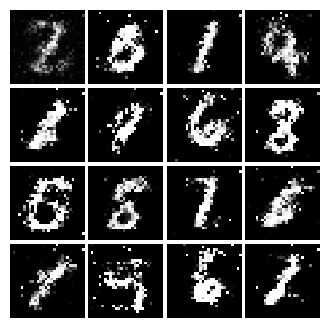

Epoch: 6, Iter: 3240, D: 0.2393, G:0.1818


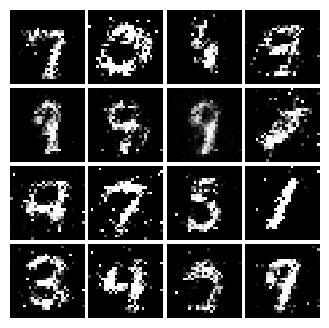

Epoch: 6, Iter: 3260, D: 0.2283, G:0.1834


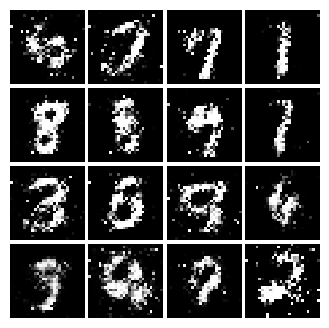

Epoch: 6, Iter: 3280, D: 0.2231, G:0.1773


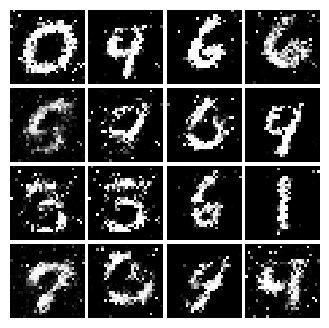

Epoch: 7, Iter: 3300, D: 0.2064, G:0.1801


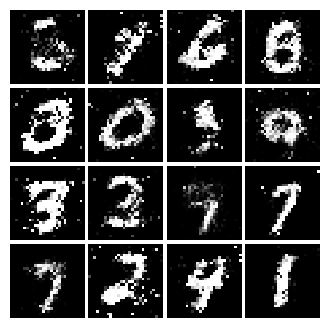

Epoch: 7, Iter: 3320, D: 0.2153, G:0.1522


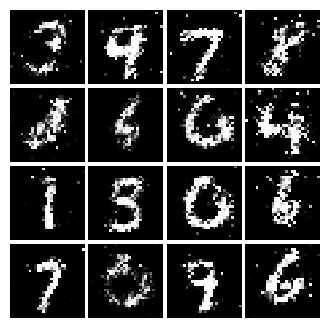

Epoch: 7, Iter: 3340, D: 0.2261, G:0.2007


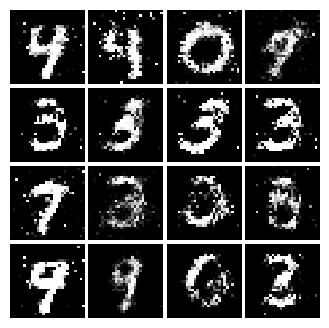

Epoch: 7, Iter: 3360, D: 0.218, G:0.1864


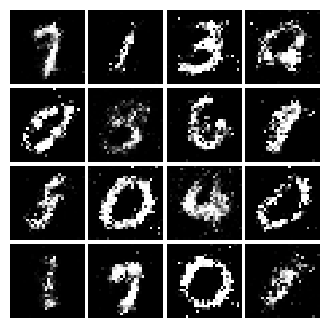

Epoch: 7, Iter: 3380, D: 0.2221, G:0.1711


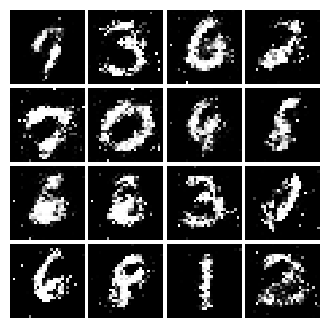

Epoch: 7, Iter: 3400, D: 0.2363, G:0.1477


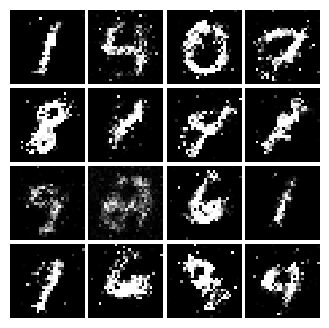

Epoch: 7, Iter: 3420, D: 0.2543, G:0.1808


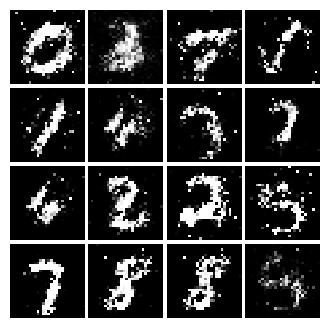

Epoch: 7, Iter: 3440, D: 0.2141, G:0.1909


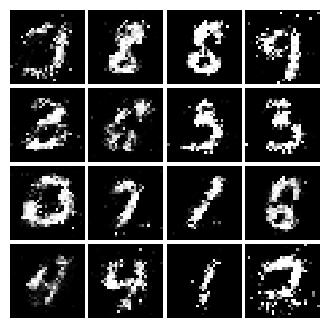

Epoch: 7, Iter: 3460, D: 0.2517, G:0.185


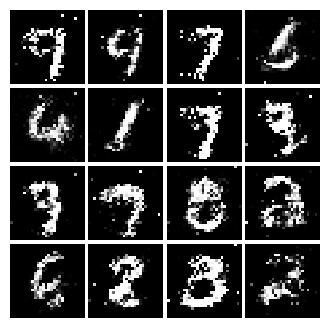

Epoch: 7, Iter: 3480, D: 0.2158, G:0.1736


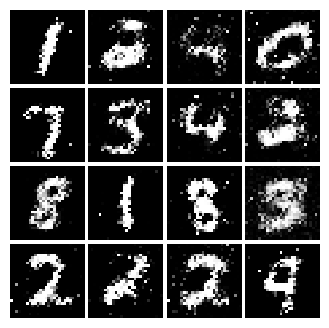

Epoch: 7, Iter: 3500, D: 0.2332, G:0.1747


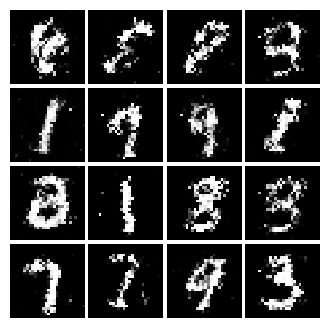

Epoch: 7, Iter: 3520, D: 0.2245, G:0.1653


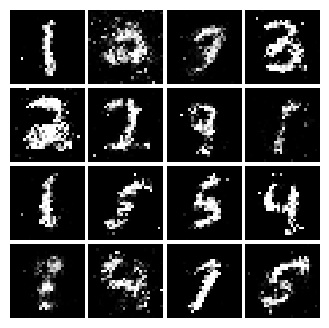

Epoch: 7, Iter: 3540, D: 0.225, G:0.1943


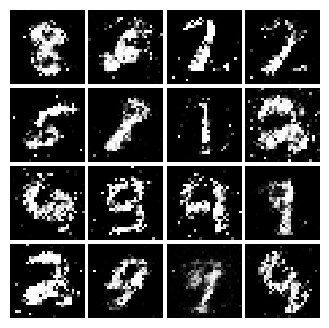

Epoch: 7, Iter: 3560, D: 0.1931, G:0.2099


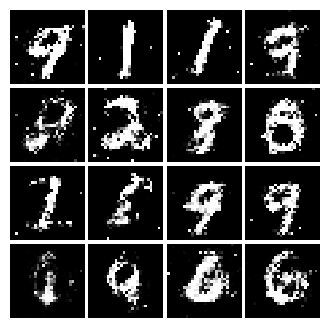

Epoch: 7, Iter: 3580, D: 0.2155, G:0.1778


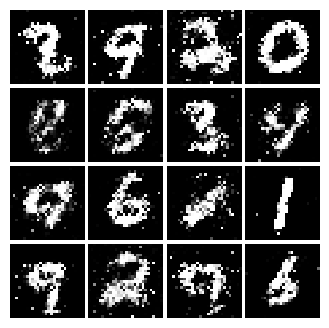

Epoch: 7, Iter: 3600, D: 0.2187, G:0.1752


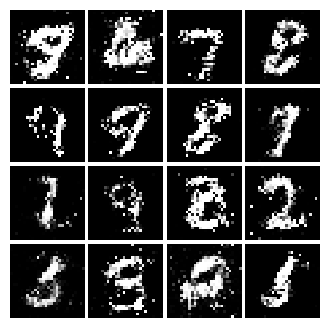

Epoch: 7, Iter: 3620, D: 0.2437, G:0.1977


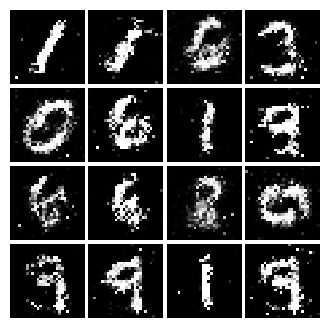

Epoch: 7, Iter: 3640, D: 0.2469, G:0.1782


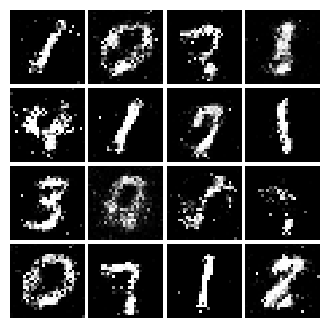

Epoch: 7, Iter: 3660, D: 0.2313, G:0.1972


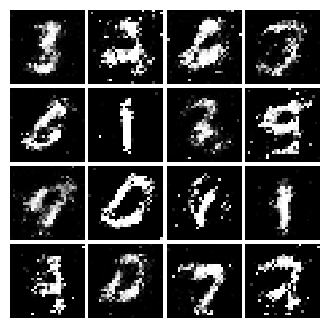

Epoch: 7, Iter: 3680, D: 0.235, G:0.1815


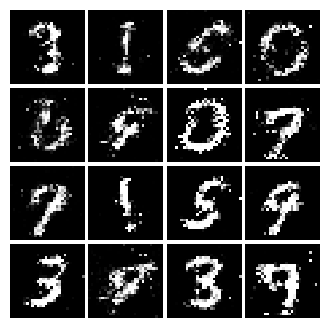

Epoch: 7, Iter: 3700, D: 0.1969, G:0.1705


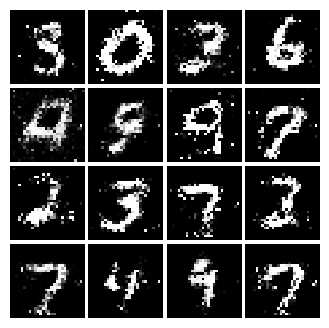

Epoch: 7, Iter: 3720, D: 0.201, G:0.1789


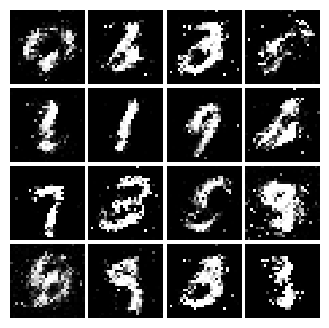

Epoch: 7, Iter: 3740, D: 0.2459, G:0.1295


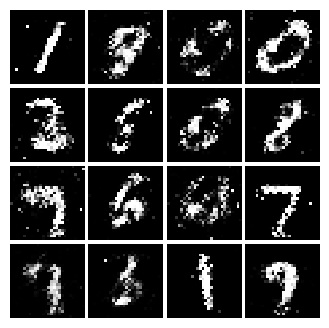

Epoch: 8, Iter: 3760, D: 0.2318, G:0.1886


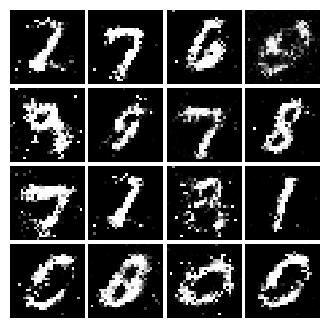

Epoch: 8, Iter: 3780, D: 0.2151, G:0.1869


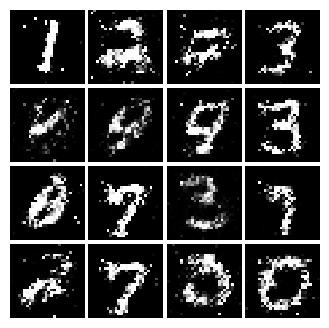

Epoch: 8, Iter: 3800, D: 0.2157, G:0.2025


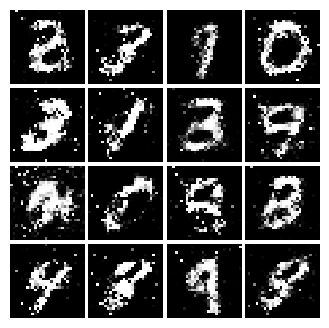

Epoch: 8, Iter: 3820, D: 0.2173, G:0.1796


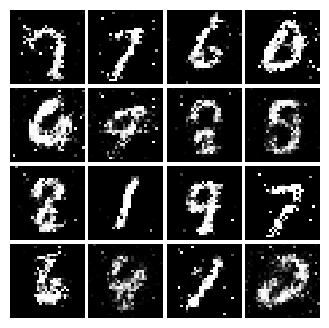

Epoch: 8, Iter: 3840, D: 0.2319, G:0.1621


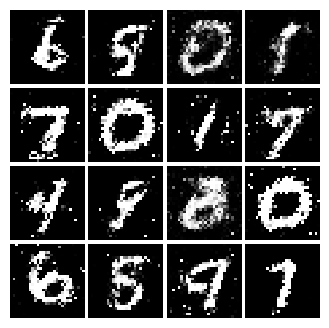

Epoch: 8, Iter: 3860, D: 0.244, G:0.1759


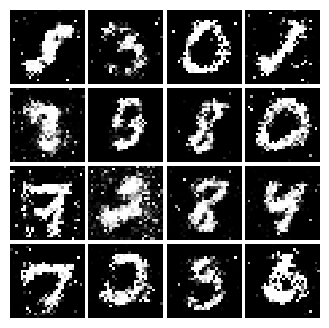

Epoch: 8, Iter: 3880, D: 0.2176, G:0.1688


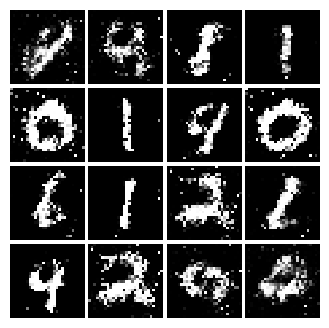

Epoch: 8, Iter: 3900, D: 0.2356, G:0.176


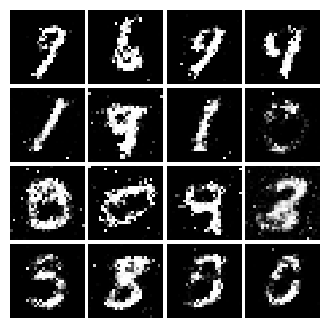

Epoch: 8, Iter: 3920, D: 0.2311, G:0.175


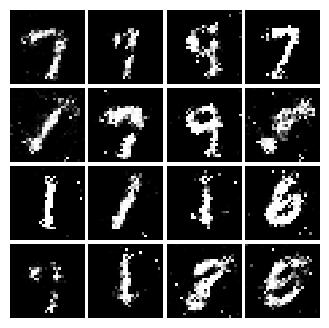

Epoch: 8, Iter: 3940, D: 0.2392, G:0.1694


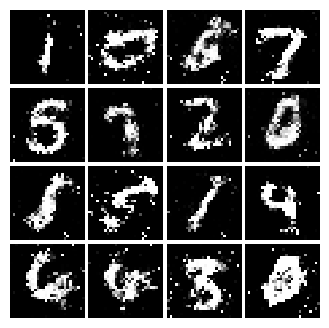

Epoch: 8, Iter: 3960, D: 0.2122, G:0.2006


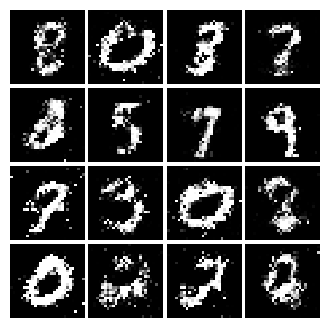

Epoch: 8, Iter: 3980, D: 0.2323, G:0.169


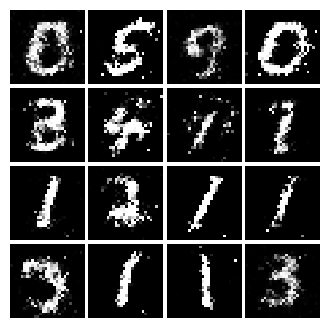

Epoch: 8, Iter: 4000, D: 0.2094, G:0.1704


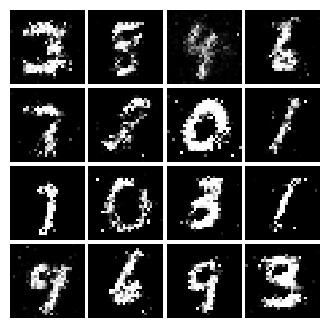

Epoch: 8, Iter: 4020, D: 0.217, G:0.1763


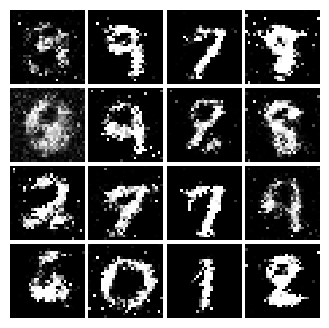

Epoch: 8, Iter: 4040, D: 0.2443, G:0.1808


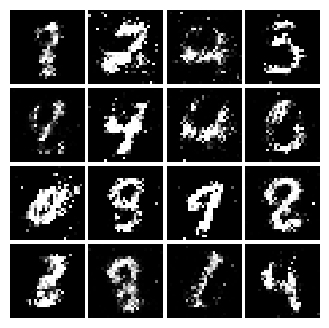

Epoch: 8, Iter: 4060, D: 0.1965, G:0.1735


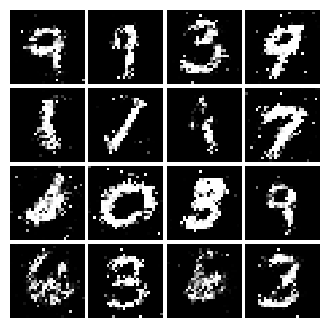

Epoch: 8, Iter: 4080, D: 0.2385, G:0.1931


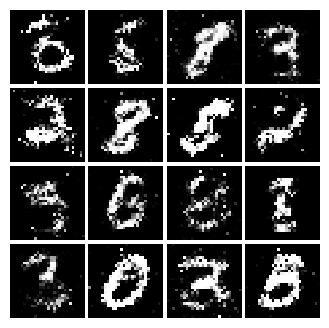

Epoch: 8, Iter: 4100, D: 0.2285, G:0.15


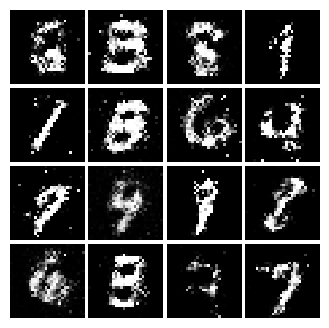

Epoch: 8, Iter: 4120, D: 0.231, G:0.1728


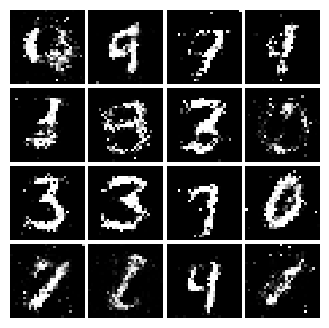

Epoch: 8, Iter: 4140, D: 0.2384, G:0.1805


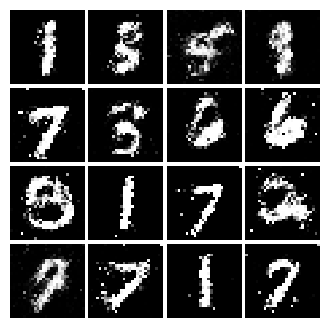

Epoch: 8, Iter: 4160, D: 0.1923, G:0.1852


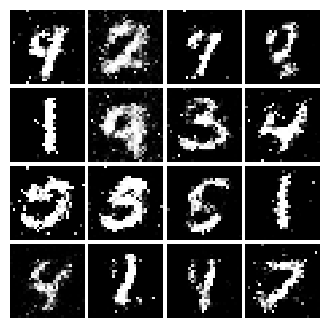

Epoch: 8, Iter: 4180, D: 0.2184, G:0.1757


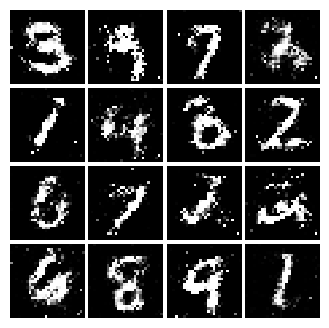

Epoch: 8, Iter: 4200, D: 0.2393, G:0.1832


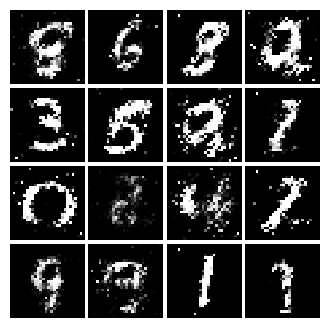

Epoch: 8, Iter: 4220, D: 0.2102, G:0.1785


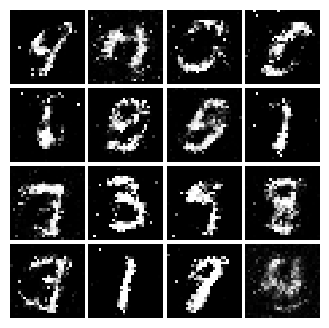

Epoch: 9, Iter: 4240, D: 0.2239, G:0.1622


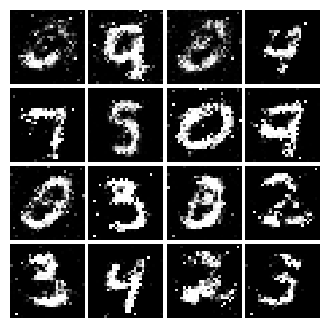

Epoch: 9, Iter: 4260, D: 0.2337, G:0.1616


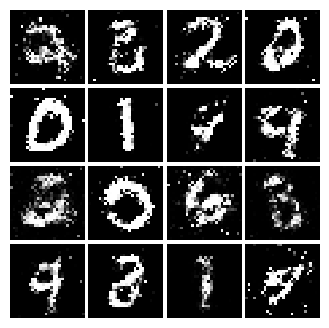

Epoch: 9, Iter: 4280, D: 0.2528, G:0.1767


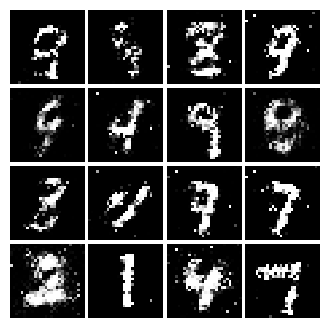

Epoch: 9, Iter: 4300, D: 0.2376, G:0.165


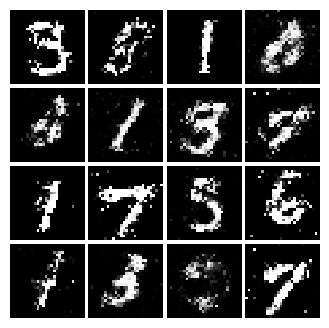

Epoch: 9, Iter: 4320, D: 0.2324, G:0.1568


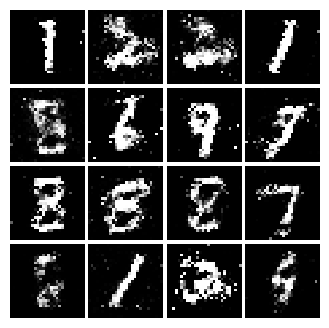

Epoch: 9, Iter: 4340, D: 0.2294, G:0.156


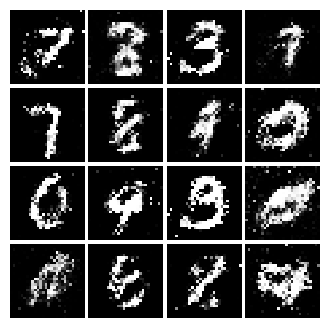

Epoch: 9, Iter: 4360, D: 0.2301, G:0.1672


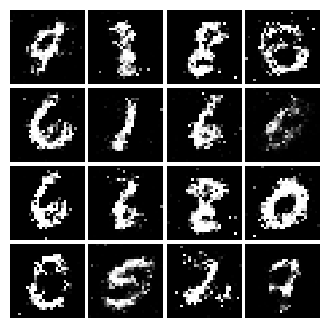

Epoch: 9, Iter: 4380, D: 0.2608, G:0.1223


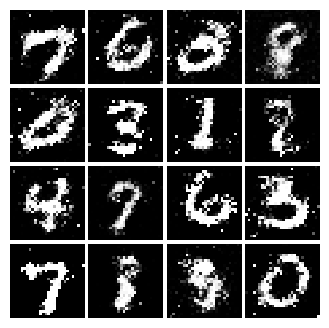

Epoch: 9, Iter: 4400, D: 0.2095, G:0.2037


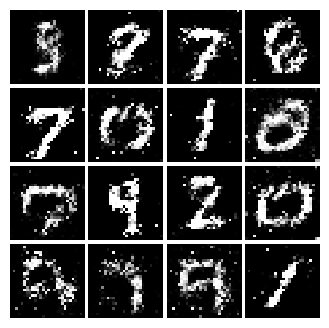

Epoch: 9, Iter: 4420, D: 0.2188, G:0.1353


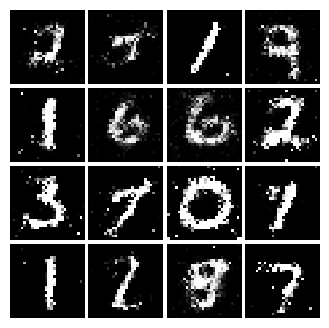

Epoch: 9, Iter: 4440, D: 0.2131, G:0.1788


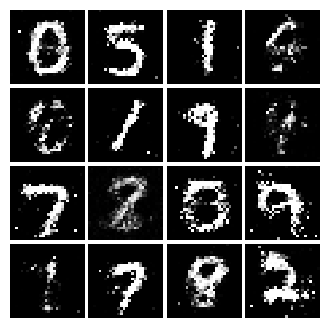

Epoch: 9, Iter: 4460, D: 0.2352, G:0.1552


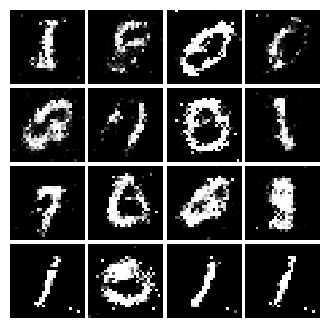

Epoch: 9, Iter: 4480, D: 0.2349, G:0.1744


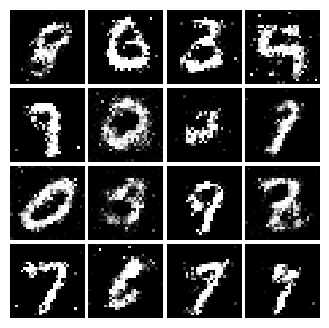

Epoch: 9, Iter: 4500, D: 0.2549, G:0.1482


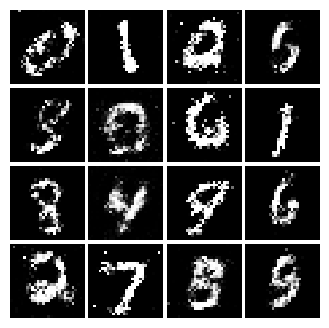

Epoch: 9, Iter: 4520, D: 0.2477, G:0.1851


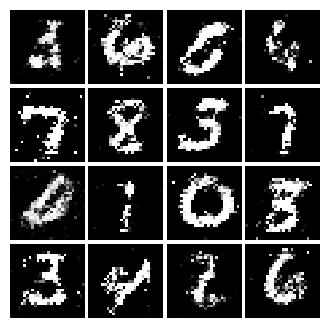

Epoch: 9, Iter: 4540, D: 0.2276, G:0.1599


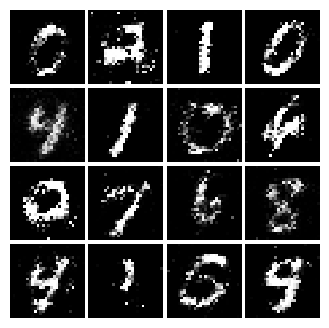

Epoch: 9, Iter: 4560, D: 0.2248, G:0.177


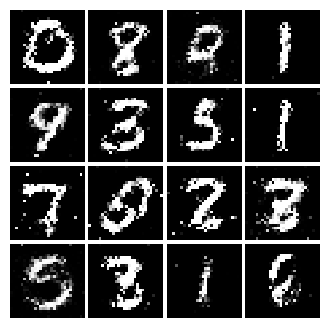

Epoch: 9, Iter: 4580, D: 0.2286, G:0.1661


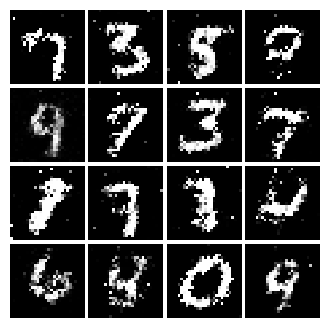

Epoch: 9, Iter: 4600, D: 0.2122, G:0.1715


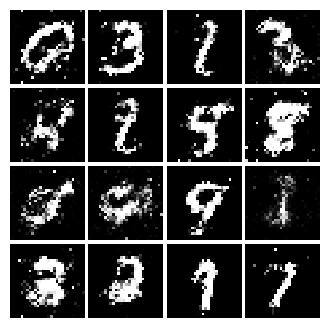

Epoch: 9, Iter: 4620, D: 0.2466, G:0.1524


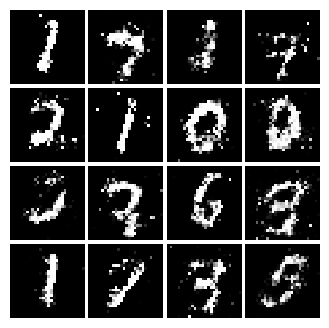

Epoch: 9, Iter: 4640, D: 0.2312, G:0.1784


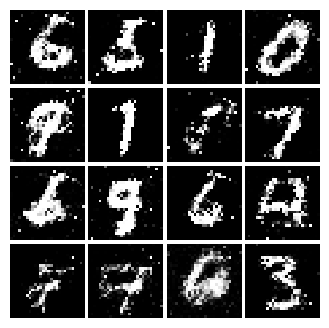

Epoch: 9, Iter: 4660, D: 0.2275, G:0.1766


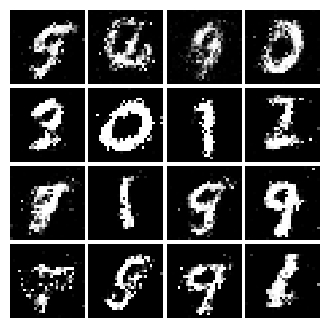

Epoch: 9, Iter: 4680, D: 0.2148, G:0.1791


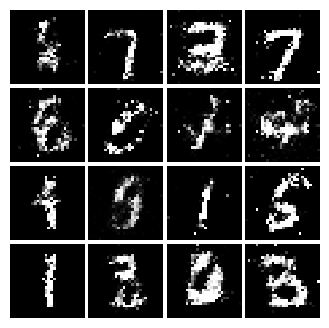

Final images


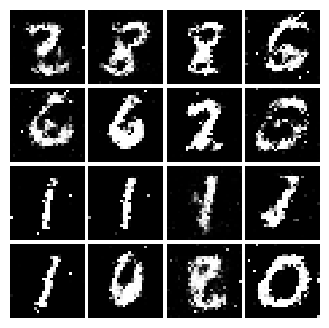

In [22]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, ls_discriminator_loss, ls_generator_loss)

# Part II - Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [23]:
def discriminator():
    """Compute discriminator score for a batch of input images.

    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]

    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        ###############################################################
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        ###############################################################

        tf.keras.layers.InputLayer((784,)),
        tf.keras.layers.Reshape((28,28,1)),

        tf.keras.layers.Conv2D(32, 5, strides=1, padding='valid', input_shape=(28, 28, 1),use_bias=True),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPooling2D(pool_size=2, strides=2),
        tf.keras.layers.Conv2D(64, 5, strides=1, padding='valid',use_bias=True),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPooling2D(pool_size=2, strides=2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4 * 4 * 64,use_bias=True),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1,use_bias=True)

        #############################################################
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        #############################################################
    ])

    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [24]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.

    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]

    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()

    # TODO: implement architecture
    ###############################################################
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ###############################################################

    model = tf.keras.models.Sequential([
        tf.keras.layers.Dense(1024, input_shape=(noise_dim,),use_bias=True),
        tf.keras.layers.ReLU(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(7 * 7 * 128,use_bias=True),
        tf.keras.layers.ReLU(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape((7, 7, 128)),
        tf.keras.layers.Conv2DTranspose(64, 4, strides=2, padding='same',use_bias=True),
        tf.keras.layers.ReLU(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', activation='tanh',use_bias=True)
    ])

    #############################################################
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #############################################################
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.271, G:0.6545


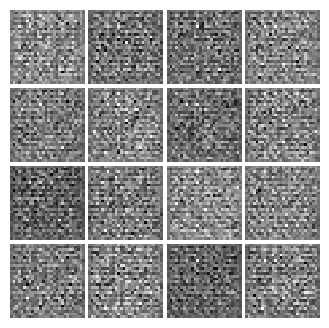

Epoch: 0, Iter: 20, D: 0.6286, G:1.483


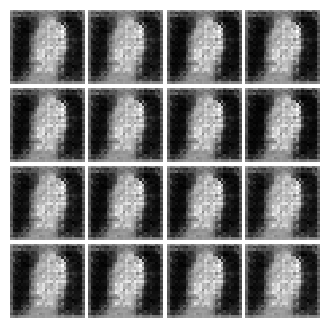

Epoch: 0, Iter: 40, D: 0.4166, G:1.414


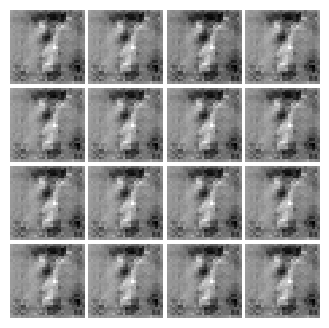

Epoch: 0, Iter: 60, D: 1.019, G:0.6507


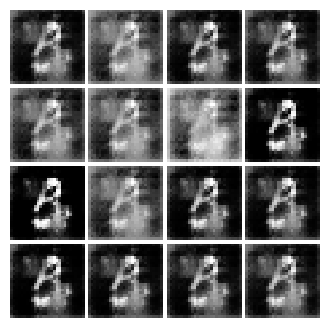

Epoch: 0, Iter: 80, D: 0.8636, G:1.17


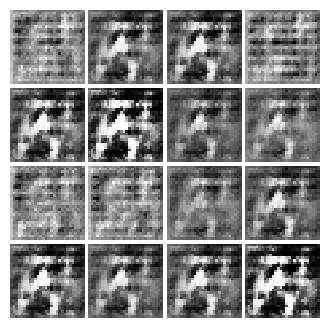

Epoch: 0, Iter: 100, D: 0.3776, G:2.58


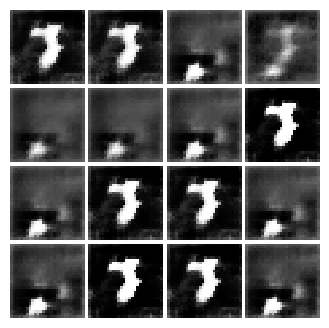

Epoch: 0, Iter: 120, D: 0.4818, G:3.288


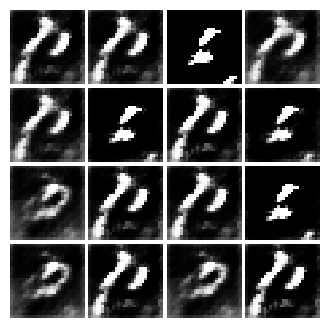

Epoch: 0, Iter: 140, D: 0.2339, G:3.853


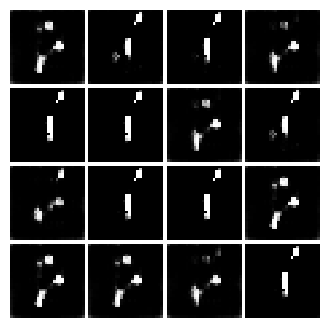

Epoch: 0, Iter: 160, D: 0.8572, G:8.641


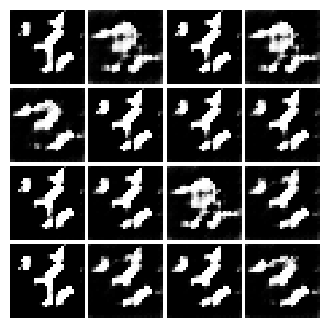

Epoch: 0, Iter: 180, D: 1.065, G:3.105


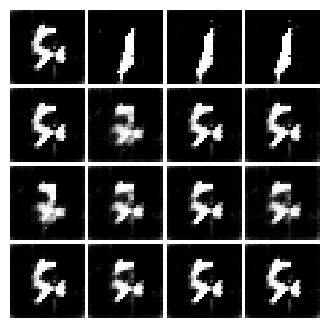

Epoch: 0, Iter: 200, D: 0.1999, G:3.41


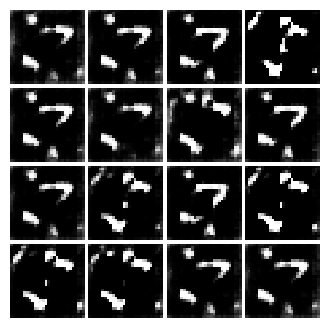

Epoch: 0, Iter: 220, D: 0.485, G:2.769


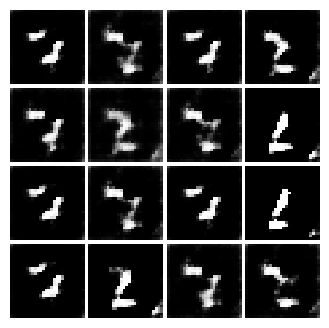

Epoch: 0, Iter: 240, D: 0.5983, G:3.453


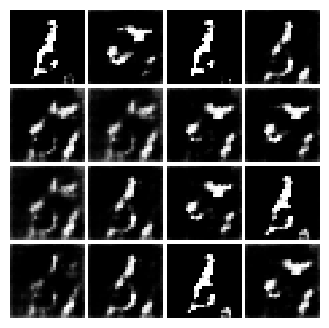

Epoch: 0, Iter: 260, D: 0.4107, G:3.133


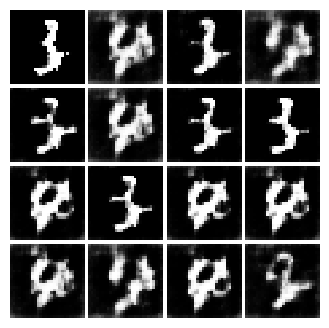

Epoch: 0, Iter: 280, D: 0.3346, G:3.237


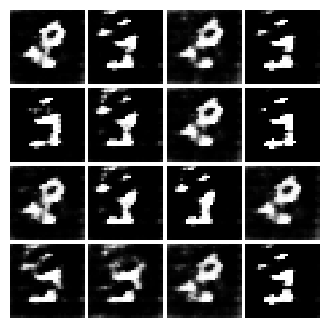

Epoch: 0, Iter: 300, D: 0.7224, G:3.466


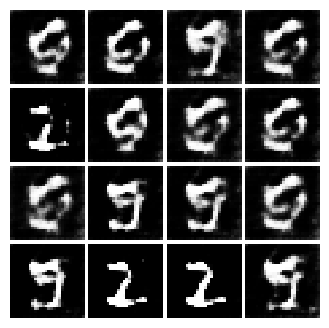

Epoch: 0, Iter: 320, D: 0.4794, G:3.785


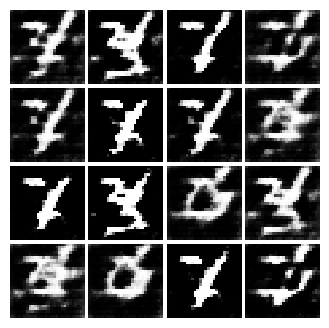

Epoch: 0, Iter: 340, D: 1.271, G:2.644


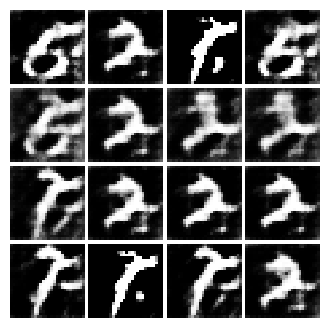

Epoch: 0, Iter: 360, D: 0.6273, G:1.825


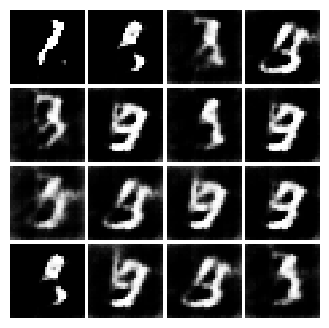

Epoch: 0, Iter: 380, D: 0.7104, G:2.23


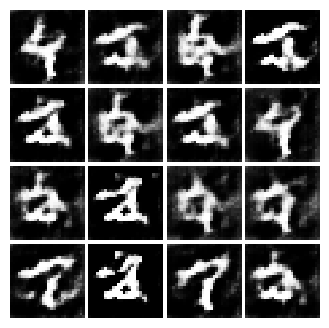

Epoch: 0, Iter: 400, D: 0.4883, G:1.534


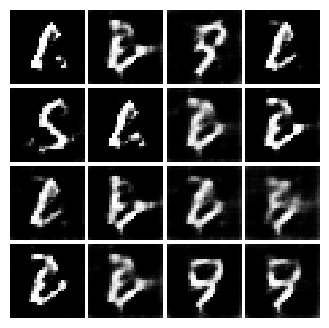

Epoch: 0, Iter: 420, D: 0.384, G:3.044


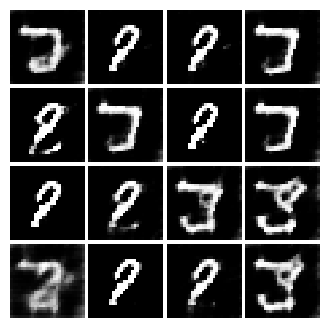

Epoch: 0, Iter: 440, D: 0.3212, G:3.019


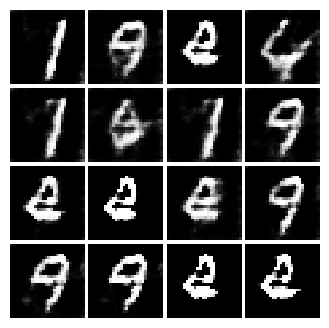

Epoch: 0, Iter: 460, D: 1.148, G:3.76


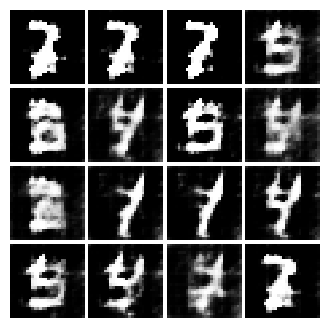

Epoch: 1, Iter: 480, D: 2.962, G:3.606


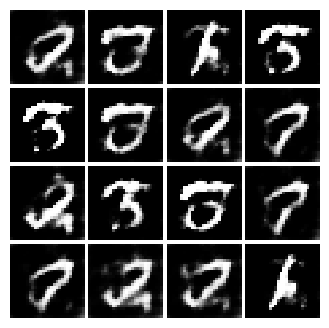

Epoch: 1, Iter: 500, D: 0.4855, G:3.557


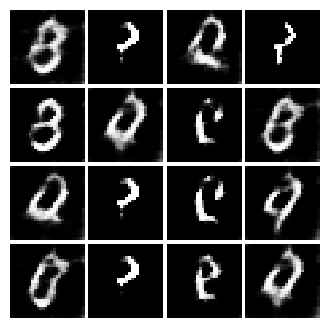

Epoch: 1, Iter: 520, D: 0.4025, G:3.765


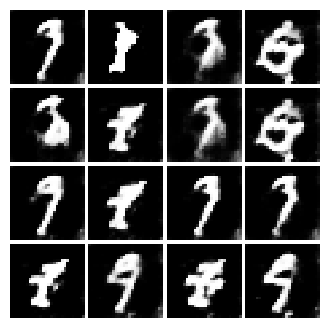

Epoch: 1, Iter: 540, D: 0.438, G:2.771


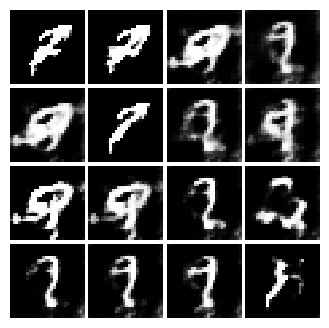

Epoch: 1, Iter: 560, D: 0.7849, G:3.11


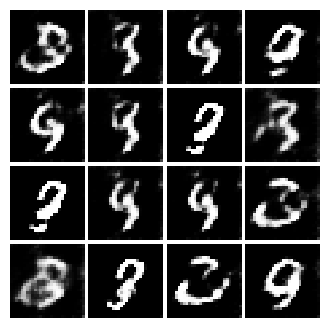

Epoch: 1, Iter: 580, D: 0.6234, G:3.44


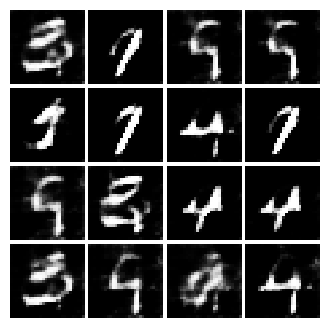

Epoch: 1, Iter: 600, D: 0.6363, G:3.132


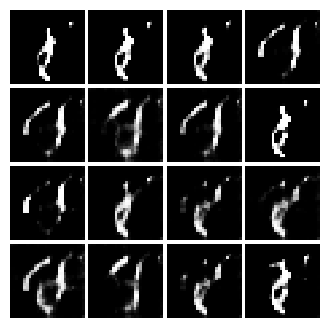

Epoch: 1, Iter: 620, D: 0.605, G:2.592


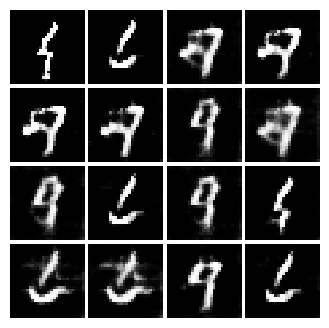

Epoch: 1, Iter: 640, D: 0.6817, G:2.484


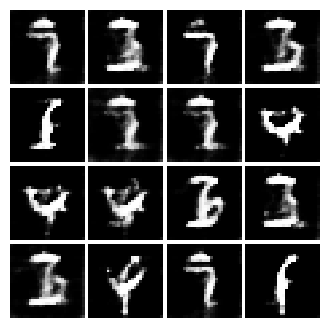

Epoch: 1, Iter: 660, D: 0.3003, G:3.558


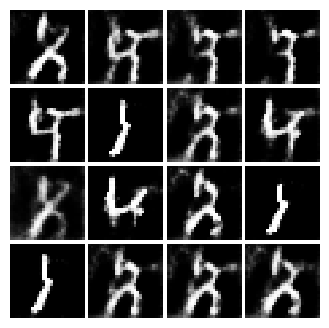

Epoch: 1, Iter: 680, D: 0.3385, G:3.185


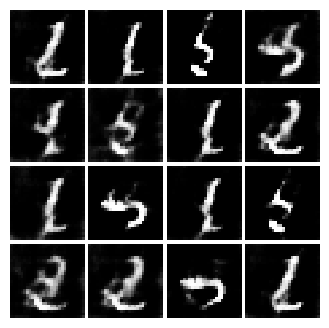

Epoch: 1, Iter: 700, D: 0.3801, G:3.449


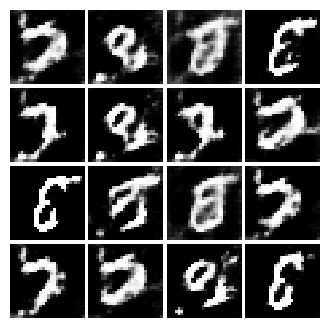

Epoch: 1, Iter: 720, D: 1.048, G:6.342


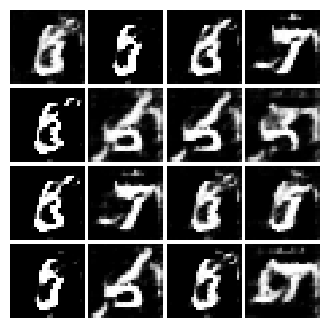

Epoch: 1, Iter: 740, D: 0.6683, G:3.734


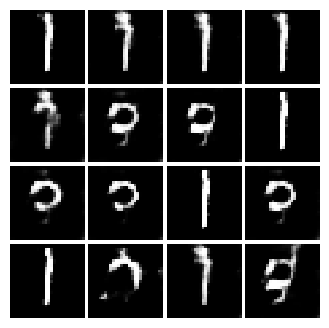

Epoch: 1, Iter: 760, D: 0.3783, G:3.627


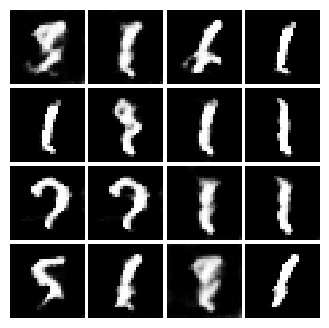

Epoch: 1, Iter: 780, D: 0.3356, G:2.563


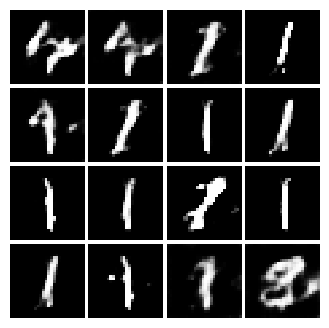

Epoch: 1, Iter: 800, D: 0.5879, G:2.405


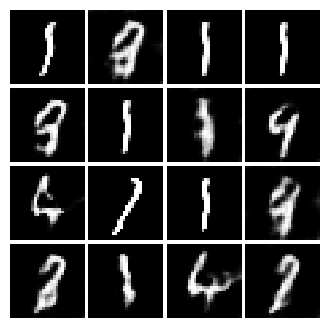

Epoch: 1, Iter: 820, D: 0.5833, G:2.215


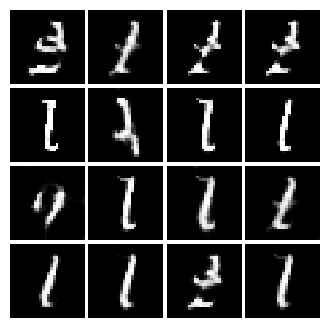

Epoch: 1, Iter: 840, D: 0.3155, G:2.19


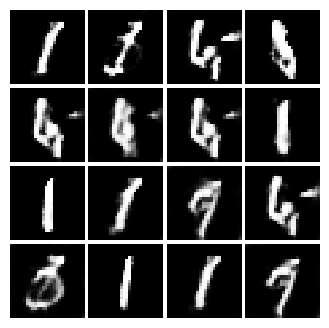

Epoch: 1, Iter: 860, D: 0.5442, G:2.439


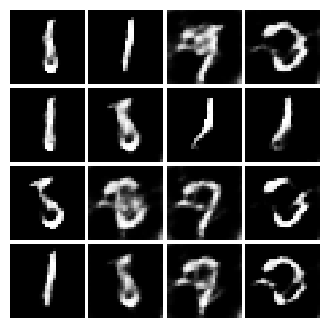

Epoch: 1, Iter: 880, D: 0.3212, G:3.337


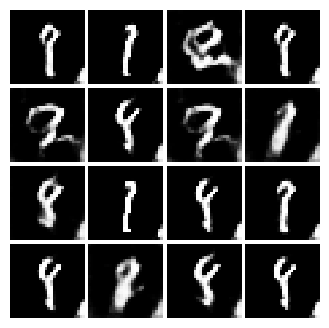

Epoch: 1, Iter: 900, D: 0.9882, G:4.296


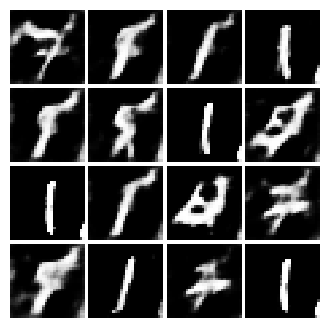

Epoch: 1, Iter: 920, D: 0.4007, G:3.017


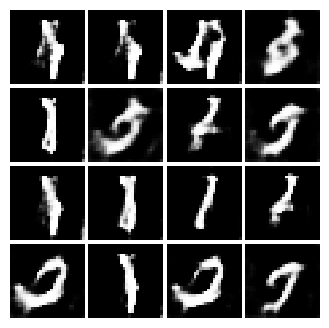

Epoch: 2, Iter: 940, D: 0.6717, G:2.34


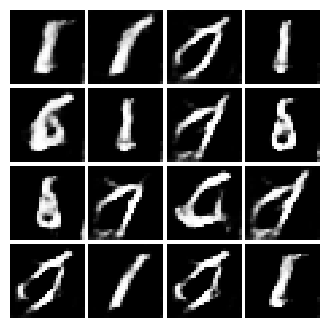

Epoch: 2, Iter: 960, D: 0.6432, G:1.909


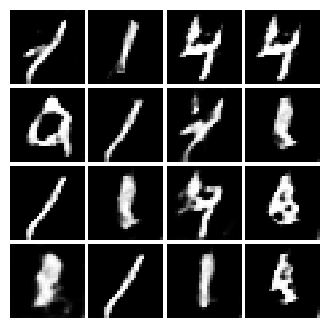

Epoch: 2, Iter: 980, D: 0.4458, G:2.581


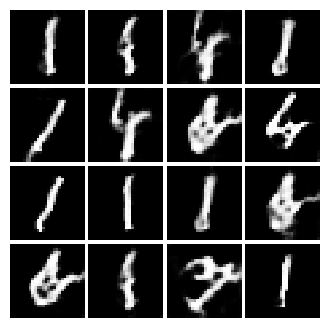

Epoch: 2, Iter: 1000, D: 0.6013, G:2.74


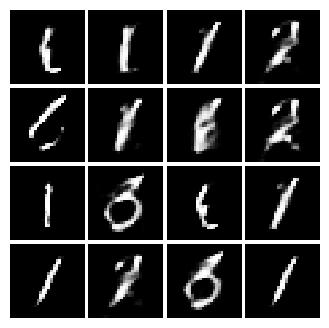

Epoch: 2, Iter: 1020, D: 0.6458, G:1.499


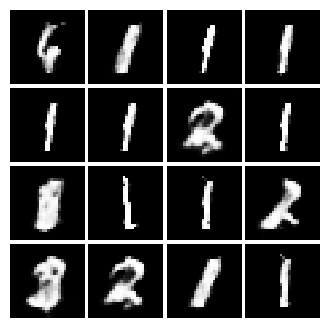

Epoch: 2, Iter: 1040, D: 0.4475, G:2.379


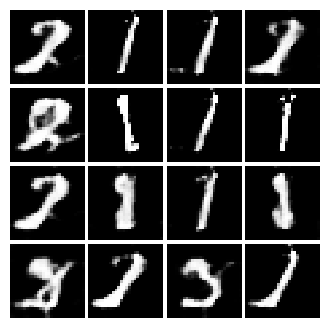

Epoch: 2, Iter: 1060, D: 0.3784, G:2.275


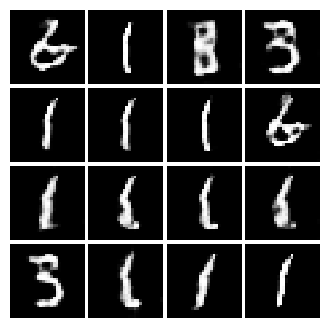

Epoch: 2, Iter: 1080, D: 0.5215, G:2.069


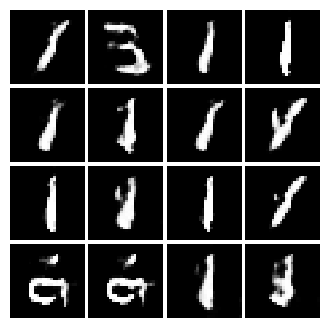

Epoch: 2, Iter: 1100, D: 0.8644, G:2.979


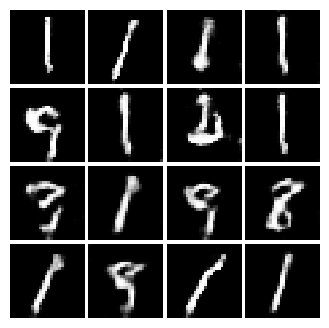

Epoch: 2, Iter: 1120, D: 0.6103, G:2.671


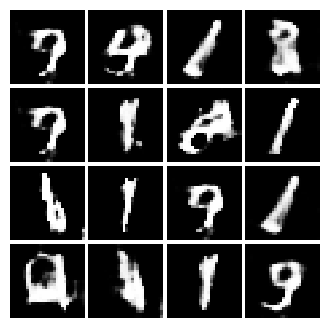

Epoch: 2, Iter: 1140, D: 0.4977, G:2.595


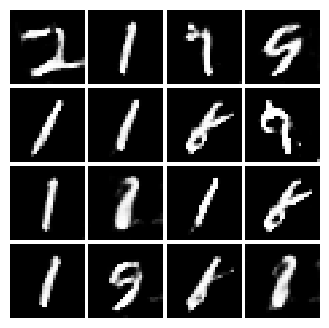

Epoch: 2, Iter: 1160, D: 0.5501, G:3.52


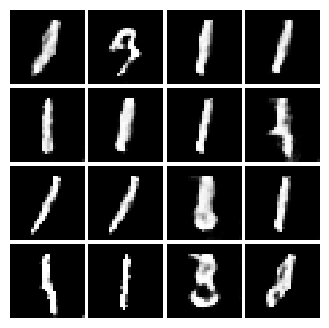

Epoch: 2, Iter: 1180, D: 0.5325, G:2.318


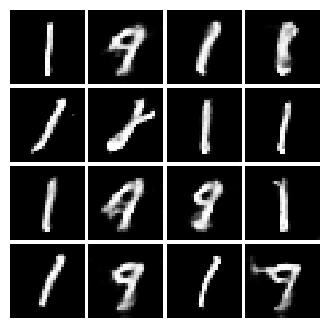

Epoch: 2, Iter: 1200, D: 0.3929, G:2.351


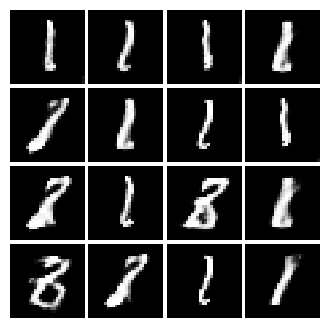

Epoch: 2, Iter: 1220, D: 0.4978, G:2.672


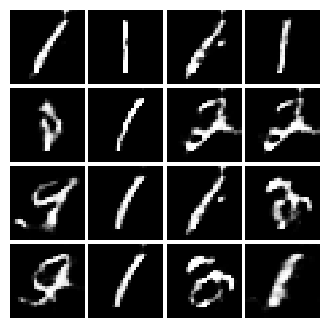

Epoch: 2, Iter: 1240, D: 0.4789, G:2.059


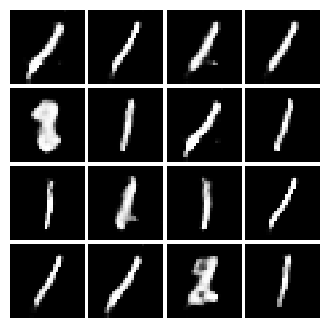

Epoch: 2, Iter: 1260, D: 0.4524, G:2.641


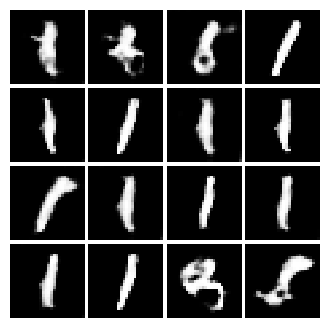

Epoch: 2, Iter: 1280, D: 0.5676, G:1.954


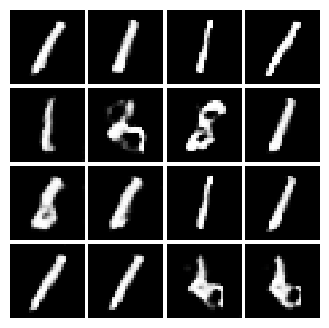

Epoch: 2, Iter: 1300, D: 0.3851, G:2.692


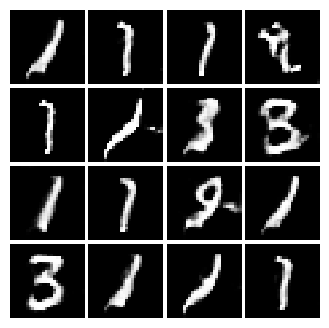

Epoch: 2, Iter: 1320, D: 0.421, G:2.207


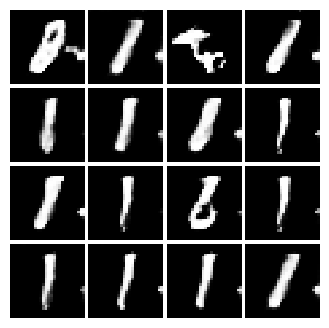

Epoch: 2, Iter: 1340, D: 0.4937, G:2.77


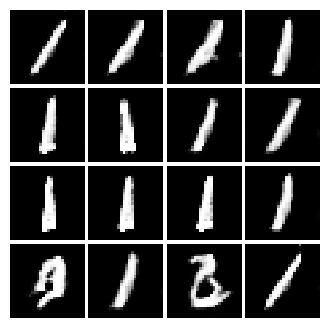

Epoch: 2, Iter: 1360, D: 0.447, G:2.502


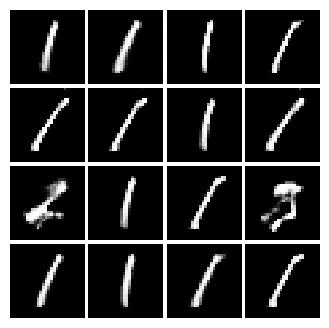

Epoch: 2, Iter: 1380, D: 0.3698, G:2.463


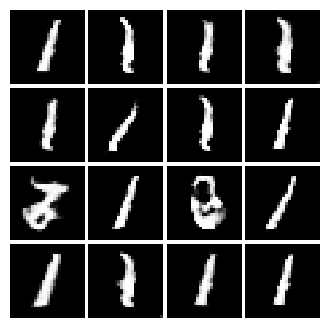

Epoch: 2, Iter: 1400, D: 0.3858, G:2.284


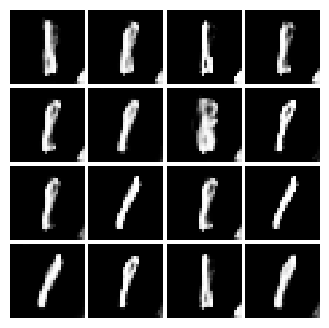

Epoch: 3, Iter: 1420, D: 0.3966, G:2.4


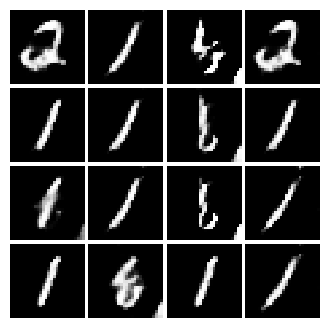

Epoch: 3, Iter: 1440, D: 0.3395, G:3.009


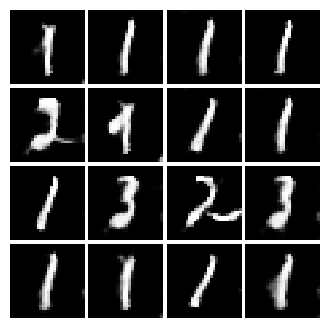

Epoch: 3, Iter: 1460, D: 0.4808, G:2.074


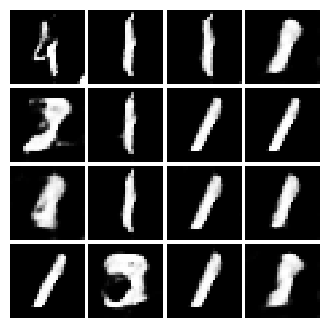

Epoch: 3, Iter: 1480, D: 0.5054, G:2.703


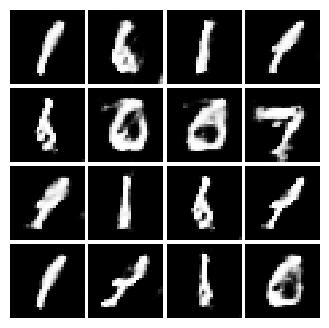

Epoch: 3, Iter: 1500, D: 0.3908, G:2.248


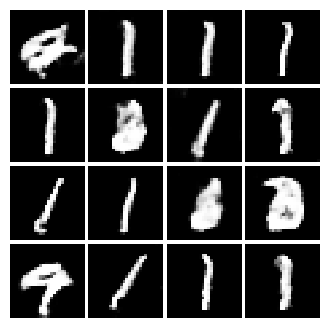

Epoch: 3, Iter: 1520, D: 0.4645, G:2.585


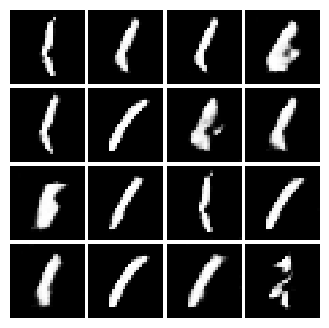

Epoch: 3, Iter: 1540, D: 0.4992, G:2.24


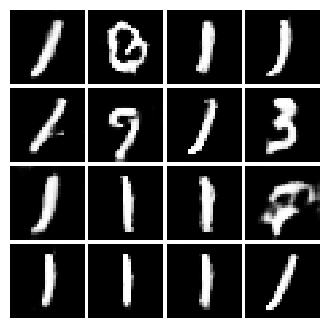

Epoch: 3, Iter: 1560, D: 0.4401, G:2.466


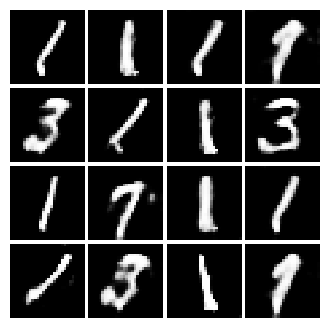

Epoch: 3, Iter: 1580, D: 0.5267, G:2.556


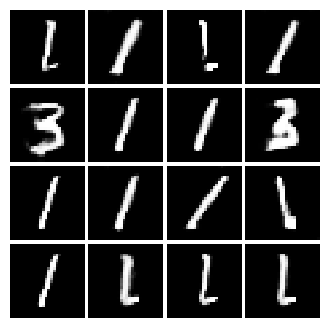

Epoch: 3, Iter: 1600, D: 0.7055, G:2.861


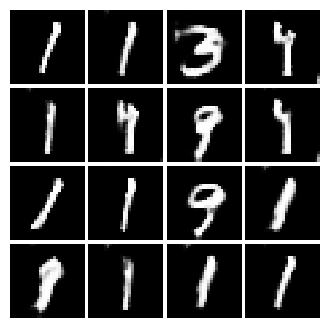

Epoch: 3, Iter: 1620, D: 0.4742, G:3.146


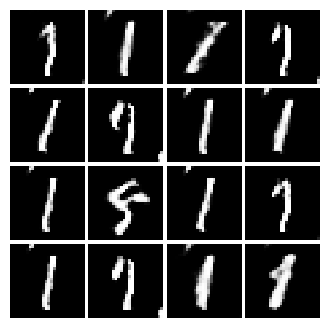

Epoch: 3, Iter: 1640, D: 0.5813, G:2.367


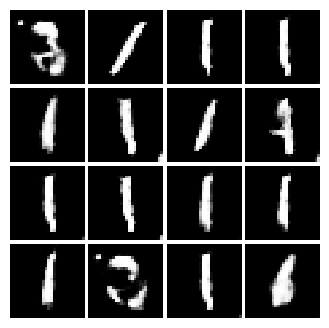

Epoch: 3, Iter: 1660, D: 0.4825, G:2.468


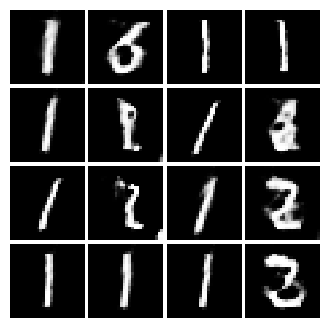

Epoch: 3, Iter: 1680, D: 0.4432, G:2.678


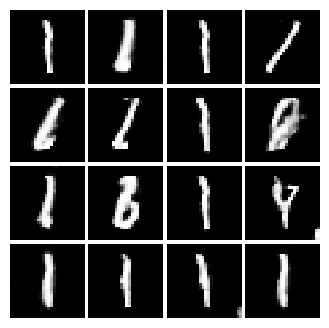

Epoch: 3, Iter: 1700, D: 0.4556, G:2.785


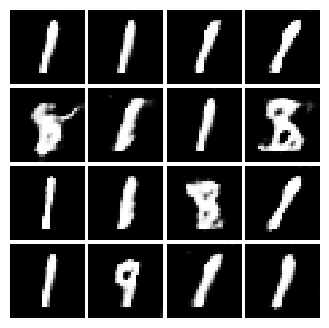

Epoch: 3, Iter: 1720, D: 0.4362, G:2.736


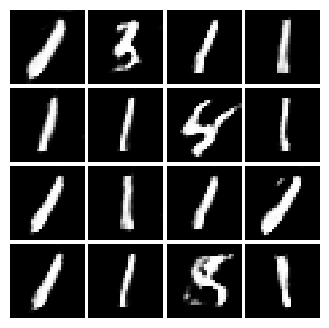

Epoch: 3, Iter: 1740, D: 0.6338, G:3.415


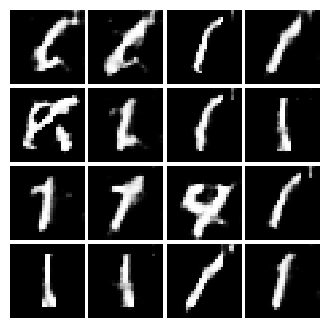

Epoch: 3, Iter: 1760, D: 0.4351, G:2.499


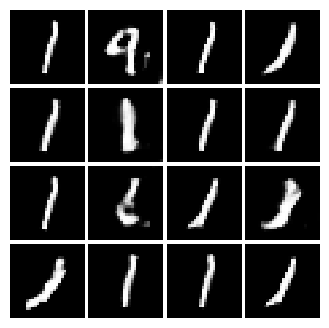

Epoch: 3, Iter: 1780, D: 0.7414, G:3.014


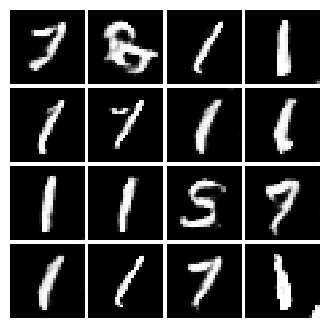

Epoch: 3, Iter: 1800, D: 0.5052, G:2.648


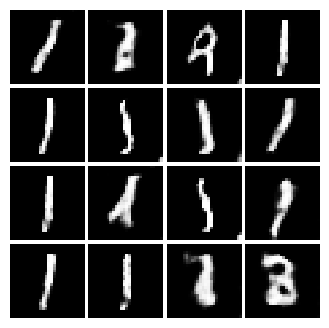

Epoch: 3, Iter: 1820, D: 0.5216, G:2.099


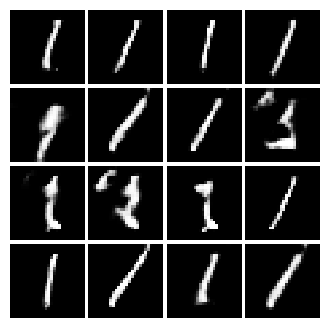

Epoch: 3, Iter: 1840, D: 0.406, G:2.041


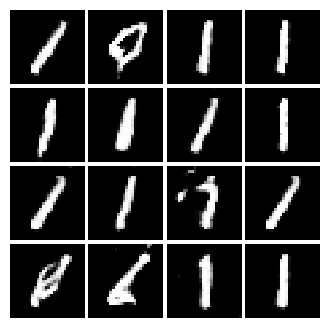

Epoch: 3, Iter: 1860, D: 0.4907, G:1.929


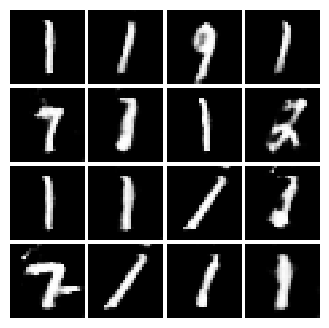

Epoch: 4, Iter: 1880, D: 0.4476, G:2.026


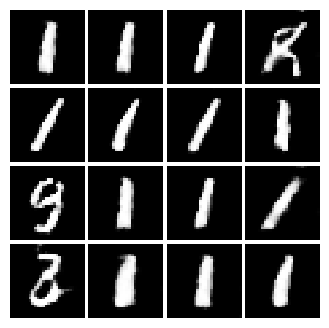

Epoch: 4, Iter: 1900, D: 0.4757, G:2.007


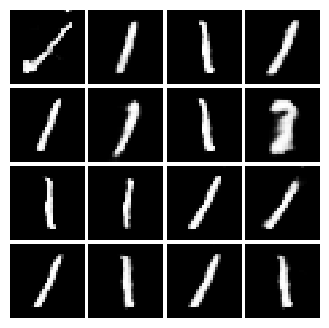

Epoch: 4, Iter: 1920, D: 0.5492, G:2.209


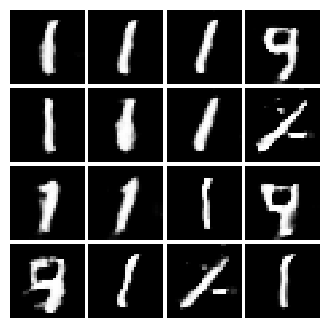

Epoch: 4, Iter: 1940, D: 0.4318, G:1.877


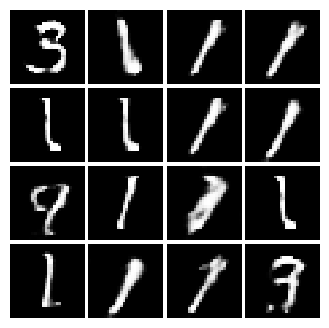

Epoch: 4, Iter: 1960, D: 0.526, G:2.497


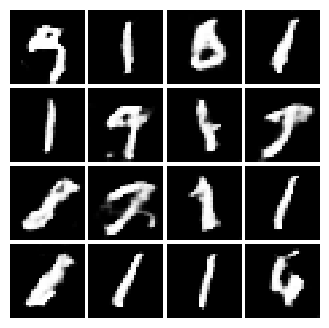

Epoch: 4, Iter: 1980, D: 0.4298, G:2.167


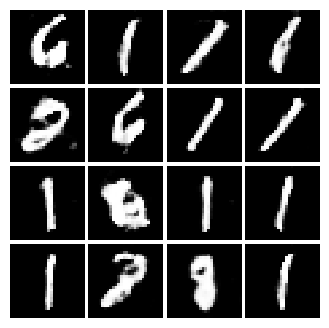

Epoch: 4, Iter: 2000, D: 0.7166, G:1.765


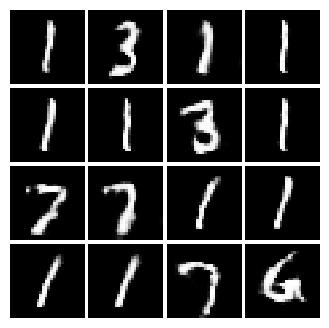

Epoch: 4, Iter: 2020, D: 0.513, G:2.253


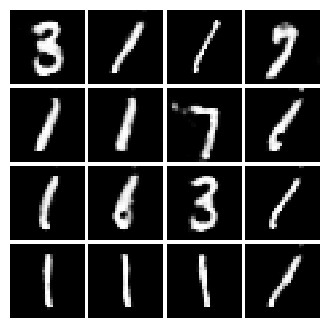

Epoch: 4, Iter: 2040, D: 0.4588, G:2.178


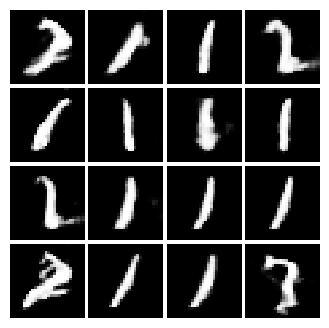

Epoch: 4, Iter: 2060, D: 0.3875, G:2.411


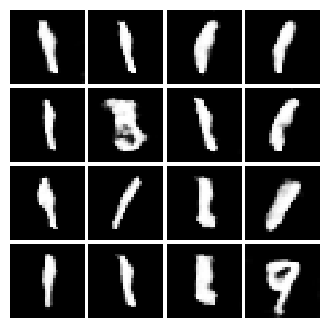

Epoch: 4, Iter: 2080, D: 0.5248, G:2.198


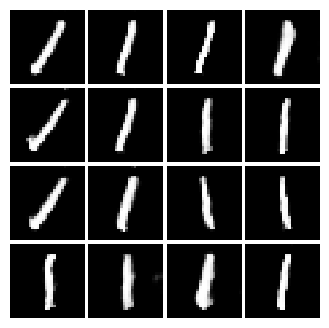

Epoch: 4, Iter: 2100, D: 0.5892, G:2.641


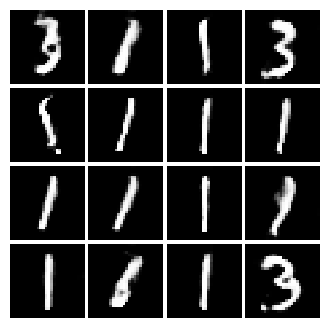

Epoch: 4, Iter: 2120, D: 0.5916, G:2.021


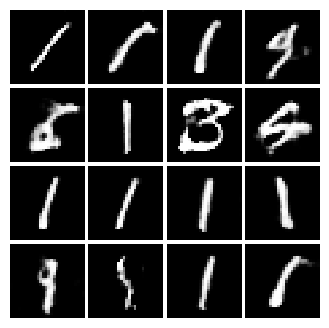

Epoch: 4, Iter: 2140, D: 0.5558, G:2.225


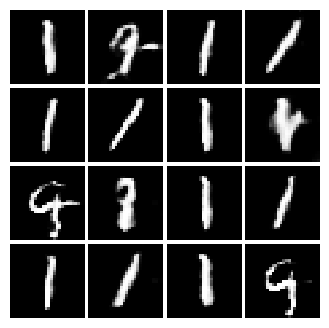

Epoch: 4, Iter: 2160, D: 0.6113, G:2.202


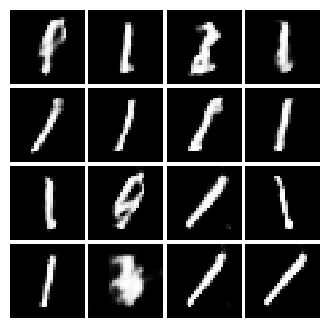

Epoch: 4, Iter: 2180, D: 0.5062, G:2.135


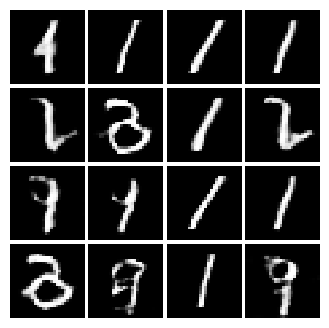

Epoch: 4, Iter: 2200, D: 0.5956, G:2.014


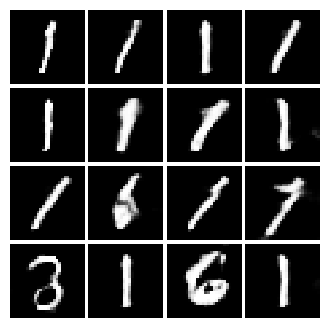

Epoch: 4, Iter: 2220, D: 0.69, G:1.768


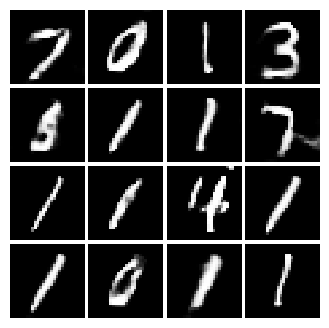

Epoch: 4, Iter: 2240, D: 0.5811, G:2.322


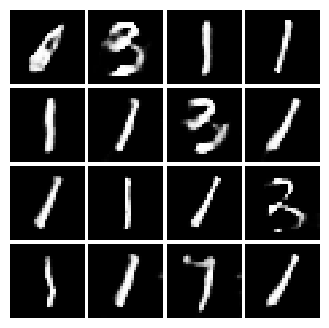

Epoch: 4, Iter: 2260, D: 0.5084, G:2.107


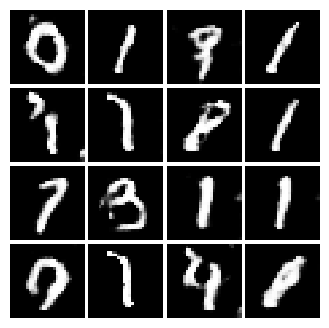

Epoch: 4, Iter: 2280, D: 0.5992, G:2.019


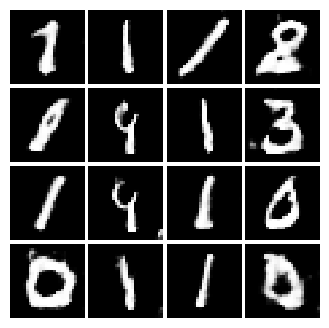

Epoch: 4, Iter: 2300, D: 0.6364, G:2.342


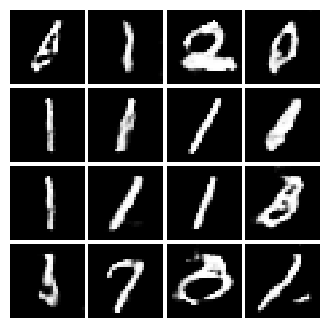

Epoch: 4, Iter: 2320, D: 0.5804, G:2.368


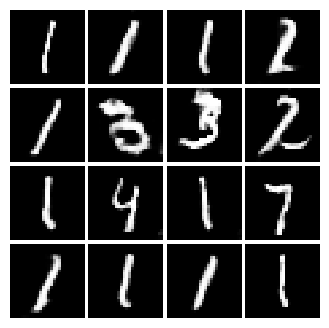

Epoch: 4, Iter: 2340, D: 0.6925, G:2.094


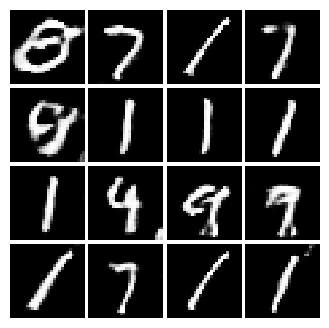

Final images


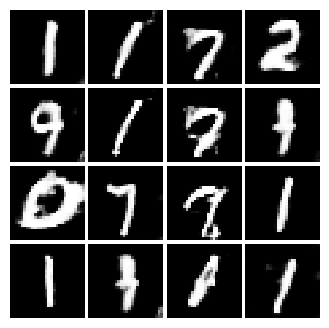

In [25]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_optimizer, G_optimizer = get_optimizers()

# Run it!
run_a_gan(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss, num_epochs=5)

# OPTIONAL: Part III - Sequence-to-Sequence Generative Model

Research and experiment on architecture and training of a sequence-to-sequence autoencoders and generative model for task such as language translation. Below are example tutorials:

- https://keras.io/examples/nlp/lstm_seq2seq/
- https://keras.io/examples/nlp/neural_machine_translation_with_transformer/